In [1]:
import xarray as xr
import os
import glob
import dask.distributed as dd
import dask
import dask.array as da
import time
import sys
import calendar
from datetime import datetime, timedelta
import numpy as np
import wrf
from itertools import product

import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['text.usetex'] = False

import matplotlib.cm as cm
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.ticker import FixedLocator, FixedFormatter

import cartopy
from cartopy import crs
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.feature import NaturalEarthFeature
from matplotlib.cm import get_cmap
import cmaps

from windrose import WindroseAxes

from scipy.stats import weibull_min

import seaborn as sns
import seaborn.objects as so

from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.ticker import AutoMinorLocator

from scipy.stats import linregress


from meteostat import Stations
from datetime import datetime
from meteostat import Hourly

from sklearn.cluster import KMeans
from sklearn.linear_model import LinearRegression
from sklearn.mixture import GaussianMixture
from sklearn.covariance import EllipticEnvelope

In [2]:
root_dir = '/media/harish/SSD_4TB/EU_SCORES'

In [3]:
# Extrapolating buoy wind to required height
def extrapolate(Um, Zm, Z0, Z):
    '''
    Um: Measured wind
    Zm: measured height
    Z0: Roughness length
    Z: reference height
    '''
    return Um*np.log(Z/Z0)/np.log(Zm/Z0)

# Writing a function to extract location wise data based on XLAT and XLONG
def read_pointwise_timeseries(ds, target_lat, target_lon, var_name = None,vert_levels=None):
    if 'Time' in ds.coords:
        # If 'Time' is present in the coordinates, select the first time step
        ds_single_time = ds.isel(Time=0)
    else:
        # If 'Time' is not present, use the dataset as is
        ds_single_time = ds
    start = time.time()
    # Calculate the squared distance to each grid point
    distance_squared = (ds_single_time.XLAT - target_lat)**2 + (ds_single_time.XLONG - target_lon)**2
    end = time.time()
    print(f'Time elapsed for nearest point identification is {end-start}s')
    # Find the indices of the nearest grid point
    indices = np.unravel_index(np.nanargmin(distance_squared), distance_squared.shape)
    nearest_indices = {'south_north': indices[0], 'west_east': indices[1]}
    print(nearest_indices)
    # Select the nearest point using the indices
    if var_name:
        if vert_levels:
            var_timeseries = ds[var_name].isel(bottom_top=slice(None,vert_levels),south_north=nearest_indices['south_north'], west_east=nearest_indices['west_east'])
        else:
            var_timeseries = ds[var_name].isel(south_north=nearest_indices['south_north'], west_east=nearest_indices['west_east'])
    else:
        if vert_levels:
            var_timeseries = ds.isel(bottom_top=slice(None,vert_levels),south_north=nearest_indices['south_north'], west_east=nearest_indices['west_east'])
        else:
            var_timeseries = ds.isel(south_north=nearest_indices['south_north'], west_east=nearest_indices['west_east'])
    var_timeseries.name = 'data'
    return var_timeseries

'''
for key in points1.keys():
    read_pointwise_timeseries(ws,points1[key][0],points1[key][1]).to_netcdf(f'{root_dir}/{key}_wind_speed.nc')
'''

chunks={"Time": -1,"south_north": 8,"west_east": 8}
def wind_speed(root_dir,var1,var2,level=None,chunks=None):
    if level:
        ds1 = xr.open_dataset(f'{root_dir}/{var1}_{level}.nc',chunks=chunks)
        ds2 = xr.open_dataset(f'{root_dir}/{var2}_{level}.nc',chunks=chunks)
    else:
        ds1 = xr.open_dataset(f'{root_dir}/{var1}.nc',chunks=chunks)
        ds2 = xr.open_dataset(f'{root_dir}/{var2}.nc',chunks=chunks)
    return np.sqrt(ds1[var1]**2+ds2[var2]**2)
def wind_direction(root_dir,var1,var2,level=None,chunks=None):
    if level:
        ds1 = xr.open_dataset(f'{root_dir}/{var1}_{level}.nc',chunks=chunks)
        ds2 = xr.open_dataset(f'{root_dir}/{var2}_{level}.nc',chunks=chunks)
    else:
        ds1 = xr.open_dataset(f'{root_dir}/{var1}.nc',chunks=chunks)
        ds2 = xr.open_dataset(f'{root_dir}/{var2}.nc',chunks=chunks)
    
    return np.mod(180+np.rad2deg(np.arctan2(ds1[var1], ds2[var2])),360)
def WPD(wind_speed):
    return 0.5*1.225*wind_speed**3

def turbine_power(wind,turbine_type=None):
    # Fix the spline approximation
    from scipy.interpolate import UnivariateSpline
    if turbine_type == '15MW':
        power_curve = pd.read_csv(f'{root_dir}/eval/IEA_15MW_240_RWT.csv', usecols=range(0, 2))
        spline = UnivariateSpline(power_curve.iloc[:,0],power_curve.iloc[:,1])
        power = spline(wind)
        power = xr.where(((wind>=3) & (wind<= 25)), power, 0)   #change it to np.where, if you encounter any error
    elif turbine_type == '8MW':
        power_curve = pd.read_csv(f'{root_dir}/eval/2016CACost_NREL_Reference_8MW_180.csv', usecols=range(0, 2))
        spline = UnivariateSpline(power_curve.iloc[:,0],power_curve.iloc[:,1])
        power = spline(wind)
        power = xr.where(((wind>=4) & (wind<= 25)), power, 0)   #change it to np.where, if you encounter any error
    return power

def solar_power(ws,swdown,t2,Epv):
    # Based on Rui Chang et. al., 2022, A coupled WRF-PV mesoscale model simulating the near-surface climate of utility-scale photovoltaic plants
    # Based on https://www.sciencedirect.com/science/article/pii/S0959652623011551#sec2
    c1 = 4.3 # degC
    c2 = 0.943 # No units
    c3 = 0.028 # degC.m2.W-1
    c4 = -1.528 # degC.s.m-1
    gamma = - 0.005 # degC-1   
    
    Tcell = c1 + c2*t2 + c3*swdown + c4*ws
    Tref = 25

    PR = 1 + gamma * (Tcell - Tref) 
    Spv = swdown * Epv * PR
    Spv = xr.DataArray(Spv.astype('float32'),name='PVO')
    return Spv


In [4]:
def hexbin_plotter(gs,df0,df1,title,text_arg=None,units=None,xlabel=None,ylabel=None,colorbar=None,limits=None):
    
    txt0 = bias(df0,df1)
    txt1 = r(df0,df1)
    txt2 = RMSE(df0,df1)
    txt3 = MAE(df0,df1)
    txt4 = SI(df0,df1)
    txt5 = EMD(df0,df1)

    ax = fig.add_subplot(gs)
    hb = ax.hexbin(df0,df1, gridsize=100, bins='log', cmap='inferno')
    if text_arg:
        ax.text(0.05, 0.95, f'bias: {txt0:.2f} {units}\nr: {txt1:.2f}\nRMSE: {txt2:.2f} {units}\nMAE: {txt3:.2f} {units}\nSI: {txt4:.2f} %',
                      transform=ax.transAxes, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8),fontsize=14)
    
    if xlabel:
        ax.set_xlabel(xlabel,fontsize=14)
    if ylabel:
        ax.set_ylabel(ylabel,fontsize=14)
    ax.set_title(f'{title}',fontsize=14)
    ax.tick_params(labelsize=14)

    ax.set_xlim(limits)
    ax.set_ylim(limits)
    ax.plot(np.linspace(limits[0],limits[1]),np.linspace(limits[0],limits[1]),'--',color='grey')
    
    if colorbar:
        cbar = fig.colorbar(hb, ax=ax, orientation='vertical')
        cbar.set_label('Log Count', fontsize=14)
        cbar.ax.tick_params(labelsize=14)

In [5]:
def hist_pdf_plotter(gs,dfs,bins,line_styles,colors,labels,xlabel=None,ylabel=None,title=None,text_arg=None,text_alignment=None):
    ax = fig.add_subplot(gs)
    for i,df in enumerate(dfs):
        sns.histplot(data=dfs[i], bins=bins, 
                             stat='density', color=colors[i], label=labels[i], linewidth=3,linestyle=line_styles[i],ax=ax,element='poly',fill=False)
        if i > 0:
            if text_arg:
                x_position = 0.65 if text_alignment == 'right' else 0.05
                txt5 = EMD(dfs[0], dfs[i])
                ax.text(x_position, 0.95-(i-1)*0.15, fr'EMD({labels[i]}): {txt5:.4f}',
                      transform=ax.transAxes, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8),fontsize=14)
    ax.set_xlabel(xlabel,fontsize=14)
    ax.set_ylabel(ylabel,fontsize=14)
    ax.set_title(title,fontsize=14)
    ax.tick_params(labelsize=14)
    return ax

In [6]:
def map_plotter(gs,data,x,y,levels,cmap,title,shrink,cbar_label,orientation,extent=None,rectangles=None,sample_points=None):    
    ax = fig.add_subplot(gs,projection=ccrs.PlateCarree())
    ax.coastlines()

    contour = data.plot.contourf(
        x=x,y=y,levels=levels,add_colorbar=False,cmap = cmap,extend='both',
        #cbar_kwargs = {'orientation':orientation, 'shrink':shrink, 'aspect':40, 'label':cbar_label,'fontsize':14},
        ax=ax)
    
    # Add colorbar with font size
    cbar = fig.colorbar(contour, orientation=orientation, shrink=shrink, aspect=40, label=cbar_label)
    cbar.ax.tick_params(labelsize=14)
    cbar.ax.set_xlabel(cbar_label, fontsize=14)
    
    if extent:
        # Set the extent (for example, bounding box for Europe)
        ax.set_extent(extent, crs=ccrs.PlateCarree())
    
    # Add gridlines with labels
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=1, color='gray', alpha=0.5, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    
    # Set x and y ticks font size
    gl.xlabel_style = {'size': 14}
    gl.ylabel_style = {'size': 14}
    
    # set title
    ax.set_title(title,fontsize=14)
    
    # Add land feature with grey color
    land_feature = cfeature.NaturalEarthFeature(
        'physical', 'land', '10m', edgecolor='face', facecolor='lightgrey'
    )
    ax.add_feature(land_feature)
    ax.add_feature(cfeature.BORDERS, linestyle=':', linewidth=1, edgecolor='black')
    
    if sample_points:
        for label, (lat, lon) in sample_points.items():
            ax.text(lon, lat - 0.05, label, color='black', fontsize=14, ha='center', va='center')
            ax.plot(lon, lat, '.', markersize=8,color='black')
        
    return ax

In [7]:
def variability_plotter(gs,data,title,xlabel,ylabel,label,color,marker,xlabel_ticks=None,legend=None):
    ax = fig.add_subplot(gs)
    #sns.lineplot(x=x, y=y, data=data, ax=ax,lw=2,label=label,legend=legend,color=color,marker=marker,markersize=8)
    
    for i, key in enumerate(data):
        sns.lineplot(x=data.index.name, y=key, data=data, ax=ax, lw=2, label=key, legend=legend, color=colors[i], marker=markers[i], markersize=8)
        ax.axhline(data[key].mean(), color=colors[i], linestyle='--', label=f'{key} Overall Mean')
    
    ax.set_title(title,fontsize=14)
    ax.set_xlabel(xlabel,fontsize=14)
    ax.set_ylabel(ylabel,fontsize=14)
    
    # Set x and y ticks font size
    ax.tick_params(axis='x', labelsize=14)
    ax.tick_params(axis='y', labelsize=14)  

    # Set x-axis range
    ax.set_xlim([data.index.min(), data.index.max()])

    if xlabel_ticks is not None:
        ax.set_xticks(data.index)
        ax.set_xticklabels(xlabel_ticks)
    
    return ax

In [8]:
line_styles = ['-','--','-']
colors = [
    'black',  # Light Blue
    'orange',    # Dark Orange
    (102/255, 0/255, 102/255),     # Dark Purple
    (0/255, 153/255, 0/255),      # Dark Green
    (204/255, 0/255, 0/255),      # Dark Red
    (139/255, 69/255, 19/255),    # Saddle Brown
    (51/255, 51/255, 102/255)    # Dark Blue
]
markers = ['o','d','p','s','*','']

In [9]:
hours = list(np.arange(0, 24))
months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']

## Evaluating statistics

In [10]:
from scipy import stats
from scipy.spatial import distance
def mean(df):
    return round(df.mean(),2)
def std(df):
    return round(df.std(),2)
def r(df1,df2):
    return round(np.corrcoef(df2,df1)[0,1],2)
def bias(df1,df2):
    return round((mean(df2)-mean(df1)),2)
def RMSE(df1,df2):
    return round((np.sqrt(((df2 - df1) ** 2).mean())),2)
def MAE(df1,df2):
    return round(np.mean(np.abs(df2-df1)),2)
def SI(df1,df2):
    return round((RMSE(df2, df1)*100/mean(df1)),2)

def EMD(df1,df2):
    bins = np.arange(0,25.1,0.1)
    hist1 = np.histogram(df1,bins,density=True)[0]
    hist2 = np.histogram(df2,bins,density=True)[0]
    #return stats.wasserstein_distance(bins[:-1],bins[:-1],u_weights=hist1,v_weights=hist2)
    
    return stats.wasserstein_distance(df1,df2)

In [11]:
all_sample_points = {}
all_sample_points['Portugal_coast'] = {
    "P1": (41.35, -8.9),
    "P2": (41.5236, -9.055), #P2 is POR2 in tslist
    "P3": (41.7, -9.2),
}
all_sample_points['Netherlands_coast'] = {
    "P1": (51.3, 2.3),
    "P2": (51.6, 2.6), #P2 is POR2 in tslist
    "P3": (51.75, 3.25),
}
all_sample_points['Ireland_coast'] = {
    "P1": (52.55,-10.25),
    "P2": (52.85, -10), #P2 is POR2 in tslist
    "P3": (52.9, -10.4),
}

In [12]:
optimization_data = {}
validation_data = {}

# Portugal region

In [43]:
#-- Duration of the observations and corresponding simulations --#
start='2011-07-01 00:00:00'
end='2012-07-01 00:00:00'
times = pd.date_range(start=start, end=end, freq='1H')
print('A total of ',times.shape[0],'times should exist during ',times[0],' and ',times[-1])
case = 'Portugal_coast'

# create empty keys as case, in the dictonaries
optimization_data[case] = {}
validation_data[case] = {}

sample_points = {
    #"POR1": (41.5519, -8.7475),
    "P1": (41.35, -8.9),
    "P2": (41.5236, -9.055), #P2 is POR2 in tslist
    "P3": (41.7, -9.2),
}
obs_points = {
    "Guarda": (41.9, -8.896),
    "Cies": (42.179, -8.892),
    "CS": (42.12, -9.4),
}

A total of  8785 times should exist during  2011-07-01 00:00:00  and  2012-07-01 00:00:00


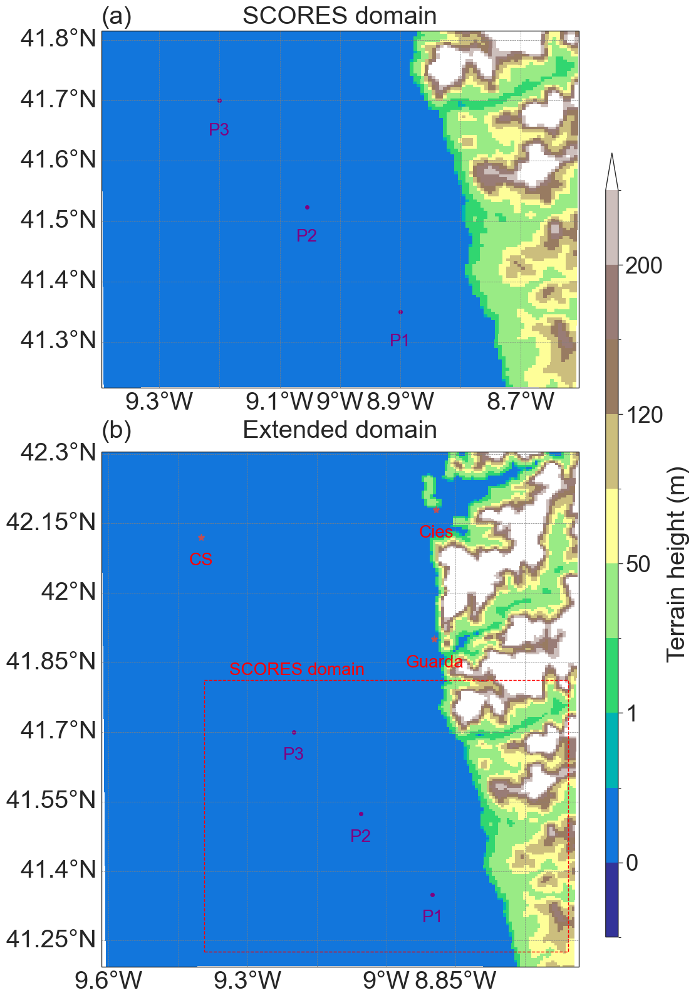

In [31]:
# Load data for the first file
SCORES_domain = f'{root_dir}/New_runs/{case}/Postprocessed/geo_em.d01.nc'
SCORES_ds = xr.open_dataset(SCORES_domain)
plot_data1 = SCORES_ds.HGT_M[0, ...].assign_coords(latitude=SCORES_ds.XLAT_M[0,...],longitude=SCORES_ds.XLONG_M[0,...])

# Load data for the second file
Extended_domain = f'{root_dir}/Validation_runs/{case}/Postprocessed/geo_em.d01.nc'
Extended_ds = xr.open_dataset(Extended_domain)
plot_data2 = Extended_ds.HGT_M[0, ...].assign_coords(latitude=Extended_ds.XLAT_M[0,...],longitude=Extended_ds.XLONG_M[0,...])

# Define the custom color levels and colormap
clevels = [-5, 0, 0.5, 1, 10, 50, 80, 120, 160, 200, 240]
cmap = plt.get_cmap("terrain")

# Create a figure with two subplots
sns.set_theme(style="white")
sns.set_context("paper",font_scale=3)
fig, axes = plt.subplots(2, 1, figsize=(10, 25),width_ratios=[1], subplot_kw={'projection':ccrs.PlateCarree()})
#plt.rc('font', size=10)    # fontsize of the all text
#plt.rc('ytick', labelsize=10)    # fontsize of the tick labels
#plt.rc('xtick', labelsize=10)

# Plot the data for the first file in the first subplot
im1 = plot_data1.plot(x='longitude',y='latitude',levels=clevels, cmap=cmap, ax=axes[0],add_colorbar=False)
#cbar = plt.colorbar(im1, ax=axes[0], shrink=0.5)
#cbar.set_label('Terrain height (m)')
gl = axes[0].gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linestyle='--', linewidth=0.5, color='gray')
gl.top_labels = False
gl.right_labels = False
axes[0].set_title('SCORES domain',loc='center')
axes[0].set_title('(a)',loc='left')

# Plot the data for the second file in the second subplot
im2 = plot_data2.plot(x='longitude',y='latitude',levels=clevels, cmap=cmap, ax=axes[1],add_colorbar=False)
gl = axes[1].gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linestyle='--', linewidth=0.5, color='gray')
#cbar = plt.colorbar(im1, ax=axes[1], shrink=0.8)
#cbar.set_label('Terrain height (m)')
gl.top_labels = False
gl.right_labels = False
axes[1].set_title('Extended domain',loc='center')
axes[1].set_title('(b)',loc='left')

# Get the maximum and minimum latitude and longitude from plot_data1
min_lat = plot_data1.latitude.min().values
max_lat = plot_data1.latitude.max().values
min_lon = plot_data1.longitude.min().values
max_lon = plot_data1.longitude.max().values

# Draw a rectangular box on im2
rect = matplotlib.patches.Rectangle((min_lon, min_lat), max_lon - min_lon, max_lat - min_lat,linestyle='--', linewidth=1, edgecolor='red', facecolor='none',label='dmy')
axes[1].add_patch(rect)

# Add the line label "SCORES domain" within the rectangular box
text_x = min_lon+0.2
text_y = max_lat+0.02
axes[1].annotate("SCORES domain", xy=(text_x, text_y), color='red', fontsize=20, ha='center', va='center')

# Add labels and markers of sample points
for label, (lat, lon) in sample_points.items():
    for ax in axes:
        ax.text(lon, lat - 0.05, label, color='purple', fontsize=20, ha='center', va='center')
        ax.plot(lon, lat, '.', markersize=8,color='purple')

# Add labels and markers of observationsl sites

for label, (lat, lon) in obs_points.items():
    ax = axes[1]
    ax.text(lon, lat - 0.05, label, color='red', fontsize=20, ha='center', va='center')
    ax.plot(lon, lat, 'r*', markersize=8)

# Add colorbar spanning both subplots
cax = plt.axes([1, 0.2, 0.02, 0.5])  # Adjust the position and size of the colorbar
cbar = plt.colorbar(im1, cax=cax)
cbar.set_label('Terrain height (m)')

plt.tight_layout(rect=(0, 0, 1.0, 1))   
plt.subplots_adjust(hspace=-0.5)

plt.savefig(f'Portugal_Domain_configuration.png',dpi=300,bbox_inches='tight',pad_inches=0)

## Validation with observations

### Observational cite ID-7303 (Guarda)

In [23]:
run = 'Validation_runs'
key = 'Guarda'
# === Simulations from wrfout ===
chunks={"Time": -1,"south_north": 8,"west_east": 8}
# read XLAND and get the lat lon data from this
XLAND = xr.open_dataset(f'{root_dir}/{run}/{case}/Postprocessed/variablewise_files/XLAND.nc')
XLAT = XLAND.XLAT
XLONG = XLAND.XLONG

ws = xr.open_dataset(f'{root_dir}/{run}/{case}/Postprocessed/variablewise_files/ws_10.nc')['ws']
ws_df = read_pointwise_timeseries(ws,obs_points[key][0],obs_points[key][1]).drop_vars(['XLONG','XLAT']).to_dataframe(name='ws')

t2 = xr.open_dataset(f'{root_dir}/{run}/{case}/Postprocessed/variablewise_files/T2.nc',chunks=chunks)
t2 = t2.assign_coords(XLAT=XLAT,XLONG=XLONG)
t2_df = read_pointwise_timeseries(t2,obs_points[key][0],obs_points[key][1],var_name='T2').drop_vars(['XLONG','XLAT']).to_dataframe(name='t2')

sim_df = pd.concat([ws_df,t2_df],axis=1)
sim_df.columns = pd.MultiIndex.from_product([[run], sim_df.columns])

# -- Observations --#
#WSPD
WSPD = pd.read_csv(f'{root_dir}/eval/Observations/EMODnet/Portugal/ID-7303/WSPD.csv',header=0,skiprows=[1])
WSPD = WSPD[WSPD['WSPD_QC']==1]
WSPD = WSPD.loc[:,['time', 'WSPD']]
WSPD.set_index('time',inplace=True)
#WSPD.dropna(inplace=True)
WSPD = WSPD.apply(pd.to_numeric, errors='coerce')
WSPD.index = pd.to_datetime(WSPD.index, format='%Y-%m-%dT%H:%M:%SZ').tz_localize(None)
WSPD = WSPD.loc[start:end,:]
#WDIR
WDIR = pd.read_csv(f'{root_dir}/eval/Observations/EMODnet/Portugal/ID-7303/WDIR.csv',header=0,skiprows=[1])
WDIR = WDIR[WDIR['WDIR_QC']==1]
WDIR = WDIR.loc[:,['time', 'WDIR']]
WDIR.set_index('time',inplace=True)
#WDIR.dropna(inplace=True)
WDIR = WDIR.apply(pd.to_numeric, errors='coerce')
WDIR.index = pd.to_datetime(WDIR.index, format='%Y-%m-%dT%H:%M:%SZ').tz_localize(None)
WDIR = WDIR.loc[start:end,:]
#DRYT
DRYT = pd.read_csv(f'{root_dir}/eval/Observations/EMODnet/Portugal/ID-7303/DRYT.csv',header=0,skiprows=[1])
DRYT = DRYT[DRYT['DRYT_QC']==1]
DRYT = DRYT.loc[:,['time', 'DRYT']]
DRYT.set_index('time',inplace=True)
#DRYT.dropna(inplace=True)
DRYT = DRYT.apply(pd.to_numeric, errors='coerce')
DRYT.index = pd.to_datetime(DRYT.index, format='%Y-%m-%dT%H:%M:%SZ').tz_localize(None)
DRYT = DRYT.loc[start:end,:]
obs_df =  WSPD.merge(WDIR, left_index=True, right_index=True, how='inner')
obs_df =  obs_df.merge(DRYT, left_index=True, right_index=True, how='inner')

#Add top column name as obs
head_column = 'Obs'
obs_df.columns = pd.MultiIndex.from_product([[head_column], obs_df.columns])

#--- Reanalysis from open meteo---#
ERA5 = pd.read_csv(f'{root_dir}/eval/Reanalysis/open-meteo/{key}_ERA5.csv',header=2,index_col=0)
ERA5.index = pd.to_datetime(ERA5.index)
ERA5.columns = pd.MultiIndex.from_product([['ERA5'], ERA5.columns])

# Now, combine the df df_7303, and df_7303_reanalysis side by side
merged_df = sim_df.merge(obs_df, left_index=True, right_index=True, how='inner')
merged_df = merged_df.merge(ERA5, left_index=True, right_index=True, how='inner')

# wind speed dataframes
ws_dfs = [merged_df['Obs']['WSPD'],
          merged_df['ERA5']['wind_speed_10m (m/s)'],
         merged_df[run]['ws']]

# 2m temperature dataframes
temp_dfs = [merged_df['Obs']['DRYT'],
           merged_df['ERA5']['temperature_2m (°C)'],
           merged_df[run]['t2']] #convert into Kelvin

# --- Storing the dataframes into the validation list here ---#
cite_data = {'ws_dfs': ws_dfs, 'temp_dfs': temp_dfs}

Time elapsed for nearest point identification is 0.0029845237731933594s
{'south_north': 151, 'west_east': 114}
Time elapsed for nearest point identification is 0.0013628005981445312s
{'south_north': 151, 'west_east': 114}


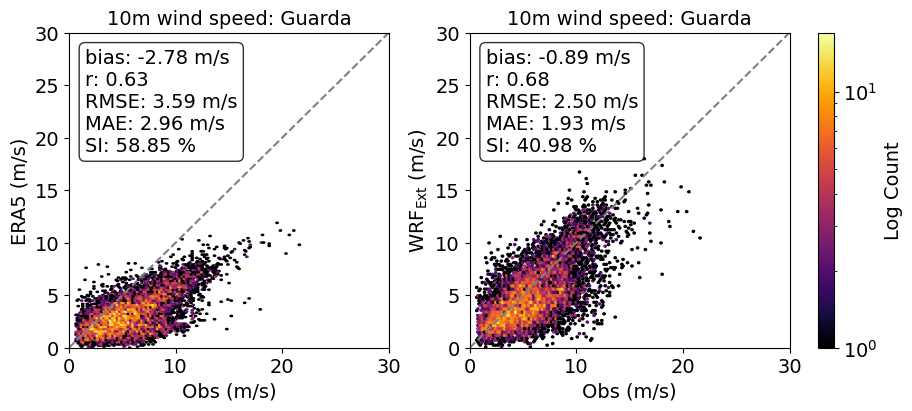

In [24]:
fig = plt.figure(figsize=(9, 4), constrained_layout=True)
gs = fig.add_gridspec(1,2)
limits = [0,30]
hexbin_plotter(gs[0,0],cite_data['ws_dfs'][0],cite_data['ws_dfs'][1],f'10m wind speed: {key}',text_arg=True,units='m/s',xlabel='Obs (m/s)',ylabel='ERA5 (m/s)',limits=limits)
ax = hexbin_plotter(gs[0,1],cite_data['ws_dfs'][0],cite_data['ws_dfs'][2],f'10m wind speed: {key}',text_arg=True,units='m/s',
                    xlabel='Obs (m/s)',ylabel=r'WRF$_{\mathrm{Ext}}$ (m/s)',colorbar=True,limits=limits)
plt.savefig(f'{case}_{run}_{key}_wind_hexbins.png',dpi=300,bbox_inches='tight',pad_inches=0)

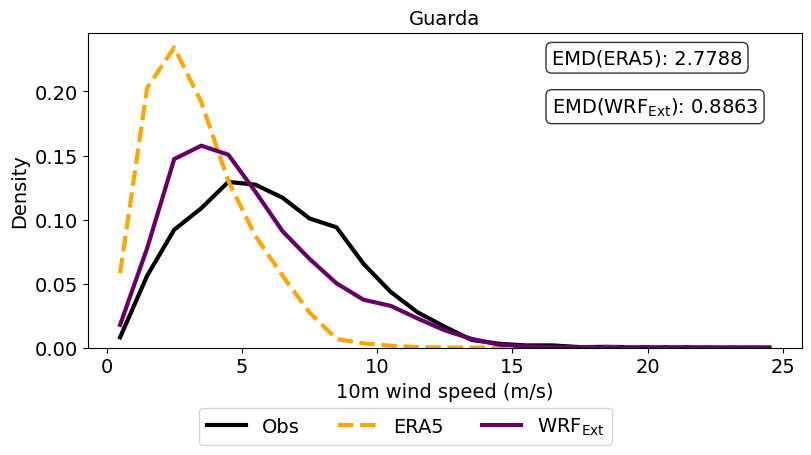

In [25]:
bins=np.arange(0, 25.1, 1)
labels = ['Obs', 'ERA5', r'WRF$_{\mathrm{Ext}}$']

fig = plt.figure(figsize=(8, 4), constrained_layout=True)
gs = fig.add_gridspec(1,1)
ax = hist_pdf_plotter(gs[0,0],cite_data['ws_dfs'],bins,line_styles,colors,labels,xlabel='10m wind speed (m/s)',ylabel = 'Density',title=key,text_arg=True,text_alignment='right')

# Add a legend at the bottom
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', bbox_to_anchor=(0.5, -0.1), ncol=len(labels), borderaxespad=0.,fontsize=14)

plt.savefig(f'{case}_{run}_{key}_wind_hist_pdf.png',dpi=300,bbox_inches='tight',pad_inches=0)

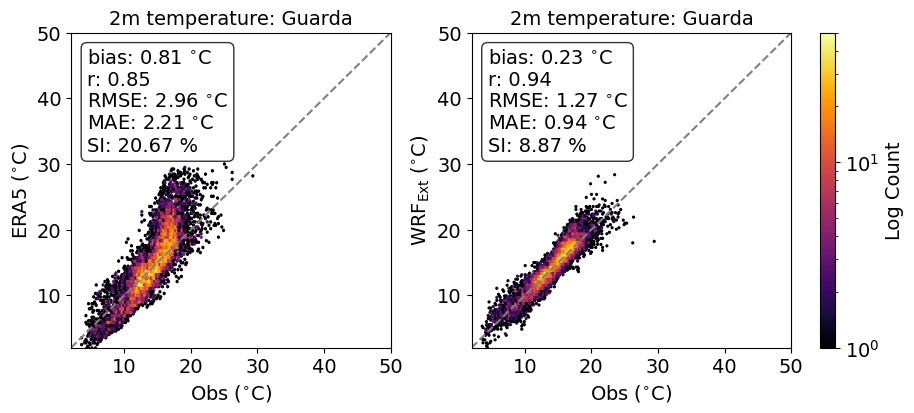

In [26]:
fig = plt.figure(figsize=(9, 4), constrained_layout=True)
gs = fig.add_gridspec(1,2)
limits = [2,50]
hexbin_plotter(gs[0,0],cite_data['temp_dfs'][0],cite_data['temp_dfs'][1],f'2m temperature: {key}',text_arg=True,units=r'$^{\circ}$C',
               xlabel=r'Obs ($^{\circ}$C)',ylabel='ERA5 ($^{\circ}$C)',limits=limits)
ax = hexbin_plotter(gs[0,1],cite_data['temp_dfs'][0],cite_data['temp_dfs'][2],f'2m temperature: {key}',text_arg=True,units=r'$^{\circ}$C',
                    xlabel='Obs ($^{\circ}$C)',ylabel=r'WRF$_{\mathrm{Ext}}$ ($^{\circ}$C)',colorbar=True,limits=limits)
plt.savefig(f'{case}_{run}_{key}_temperature_hexbins.png',dpi=300,bbox_inches='tight',pad_inches=0)

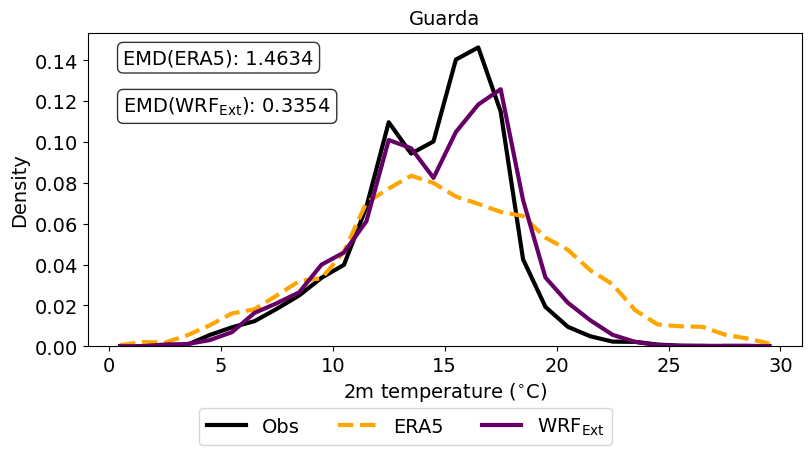

In [27]:

bins=np.arange(0, 30.1, 1)
labels = ['Obs', 'ERA5', r'WRF$_{\mathrm{Ext}}$']

fig = plt.figure(figsize=(8, 4), constrained_layout=True)
gs = fig.add_gridspec(1,1)
ax = hist_pdf_plotter(gs[0,0],cite_data['temp_dfs'],bins,line_styles,colors,labels,xlabel=r'2m temperature ($^{\circ}$C)',ylabel = 'Density',title=key,text_arg=True)

# Add a legend at the bottom
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', bbox_to_anchor=(0.5, -0.1), ncol=len(labels), borderaxespad=0.,fontsize=14)

plt.savefig(f'{case}_{run}_{key}_temperature_hist_pdf.png',dpi=300,bbox_inches='tight',pad_inches=0)

### Observational cite ID-7306 (Cies)

In [28]:
run = 'Validation_runs'
key = 'Cies'
# === Simulations from wrfout ===
chunks={"Time": -1,"south_north": 8,"west_east": 8}
# read XLAND and get the lat lon data from this
XLAND = xr.open_dataset(f'{root_dir}/{run}/{case}/Postprocessed/variablewise_files/XLAND.nc')
XLAT = XLAND.XLAT
XLONG = XLAND.XLONG

ws = xr.open_dataset(f'{root_dir}/{run}/{case}/Postprocessed/variablewise_files/ws_10.nc')['ws']
ws_df = read_pointwise_timeseries(ws,obs_points[key][0],obs_points[key][1]).drop_vars(['XLONG','XLAT']).to_dataframe(name='ws')

t2 = xr.open_dataset(f'{root_dir}/{run}/{case}/Postprocessed/variablewise_files/T2.nc',chunks=chunks)
t2 = t2.assign_coords(XLAT=XLAT,XLONG=XLONG)
t2_df = read_pointwise_timeseries(t2,obs_points[key][0],obs_points[key][1],var_name='T2').drop_vars(['XLONG','XLAT']).to_dataframe(name='t2')

sim_df = pd.concat([ws_df,t2_df],axis=1)
sim_df.columns = pd.MultiIndex.from_product([[run], sim_df.columns])

sim_df = pd.concat([ws_df,t2_df],axis=1)
sim_df.columns = pd.MultiIndex.from_product([[run], sim_df.columns])

# -- Observations --#
#WSPD
WSPD = pd.read_csv(f'{root_dir}/eval/Observations/EMODnet/Portugal/ID-7306/WSPD.csv',header=0,skiprows=[1])
WSPD = WSPD[WSPD['WSPD_QC']==1]
WSPD = WSPD.loc[:,['time', 'WSPD']]
WSPD.set_index('time',inplace=True)
#WSPD.dropna(inplace=True)
WSPD = WSPD.apply(pd.to_numeric, errors='coerce')
WSPD.index = pd.to_datetime(WSPD.index, format='%Y-%m-%dT%H:%M:%SZ').tz_localize(None)
WSPD = WSPD.loc[start:end,:]
#WDIR
WDIR = pd.read_csv(f'{root_dir}/eval/Observations/EMODnet/Portugal/ID-7306/WDIR.csv',header=0,skiprows=[1])
WDIR = WDIR[WDIR['WDIR_QC']==1]
WDIR = WDIR.loc[:,['time', 'WDIR']]
WDIR.set_index('time',inplace=True)
#WDIR.dropna(inplace=True)
WDIR = WDIR.apply(pd.to_numeric, errors='coerce')
WDIR.index = pd.to_datetime(WDIR.index, format='%Y-%m-%dT%H:%M:%SZ').tz_localize(None)
WDIR = WDIR.loc[start:end,:]
#DRYT
DRYT = pd.read_csv(f'{root_dir}/eval/Observations/EMODnet/Portugal/ID-7306/DRYT.csv',header=0,skiprows=[1])
DRYT = DRYT[DRYT['DRYT_QC']==1]
DRYT = DRYT.loc[:,['time', 'DRYT']]
DRYT.set_index('time',inplace=True)
#DRYT.dropna(inplace=True)
DRYT = DRYT.apply(pd.to_numeric, errors='coerce')
DRYT.index = pd.to_datetime(DRYT.index, format='%Y-%m-%dT%H:%M:%SZ').tz_localize(None)
DRYT = DRYT.loc[start:end,:]

obs_df =  WSPD.merge(WDIR, left_index=True, right_index=True, how='inner')
obs_df =  obs_df.merge(DRYT, left_index=True, right_index=True, how='inner')

#Add top column name as obs
head_column = 'Obs'
obs_df.columns = pd.MultiIndex.from_product([[head_column], obs_df.columns])

#--- Reanalysis from open meteo---#
ERA5 = pd.read_csv(f'{root_dir}/eval/Reanalysis/open-meteo/{key}_ERA5.csv',header=2,index_col=0)
ERA5.index = pd.to_datetime(ERA5.index)
ERA5.columns = pd.MultiIndex.from_product([['ERA5'], ERA5.columns])

# Now, combine the df df_7303, and df_7303_reanalysis side by side
merged_df = sim_df.merge(obs_df, left_index=True, right_index=True, how='inner')
merged_df = merged_df.merge(ERA5, left_index=True, right_index=True, how='inner')

# wind speed dataframes
ws_dfs = [merged_df['Obs']['WSPD'],
          merged_df['ERA5']['wind_speed_10m (m/s)'],
         merged_df[run]['ws']]

# 2m temperature dataframes
temp_dfs = [merged_df['Obs']['DRYT'],
           merged_df['ERA5']['temperature_2m (°C)'],
           merged_df[run]['t2']] #convert into Kelvin

# --- Storing the dataframes into the validation list here ---#
cite_data = {'ws_dfs': ws_dfs, 'temp_dfs': temp_dfs}

Time elapsed for nearest point identification is 0.0027534961700439453s
{'south_north': 211, 'west_east': 115}
Time elapsed for nearest point identification is 0.0019464492797851562s
{'south_north': 211, 'west_east': 115}


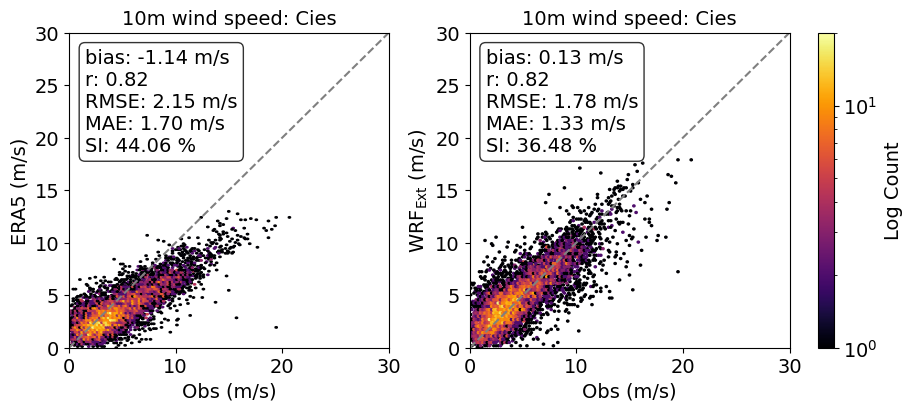

In [29]:
fig = plt.figure(figsize=(9, 4), constrained_layout=True)
gs = fig.add_gridspec(1,2)
limits = [0,30]
hexbin_plotter(gs[0,0],cite_data['ws_dfs'][0],cite_data['ws_dfs'][1],f'10m wind speed: {key}',text_arg=True,units='m/s',xlabel='Obs (m/s)',ylabel='ERA5 (m/s)',limits=limits)
ax = hexbin_plotter(gs[0,1],cite_data['ws_dfs'][0],cite_data['ws_dfs'][2],f'10m wind speed: {key}',text_arg=True,units='m/s',
                    xlabel='Obs (m/s)',ylabel=r'WRF$_{\mathrm{Ext}}$ (m/s)',colorbar=True,limits=limits)
plt.savefig(f'{case}_{run}_{key}_wind_hexbins.png',dpi=300,bbox_inches='tight',pad_inches=0)

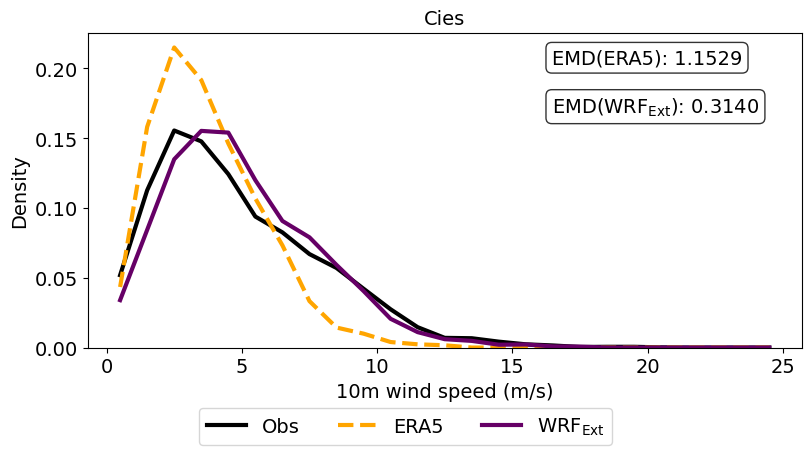

In [30]:
bins=np.arange(0, 25.1, 1)
labels = ['Obs', 'ERA5', r'WRF$_{\mathrm{Ext}}$']

fig = plt.figure(figsize=(8, 4), constrained_layout=True)
gs = fig.add_gridspec(1,1)
ax = hist_pdf_plotter(gs[0,0],cite_data['ws_dfs'],bins,line_styles,colors,labels,xlabel='10m wind speed (m/s)',ylabel = 'Density',title=key,text_arg=True,text_alignment='right')

# Add a legend at the bottom
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', bbox_to_anchor=(0.5, -0.1), ncol=len(labels), borderaxespad=0.,fontsize=14)

plt.savefig(f'{case}_{run}_{key}_wind_hist_pdf.png',dpi=300,bbox_inches='tight',pad_inches=0)

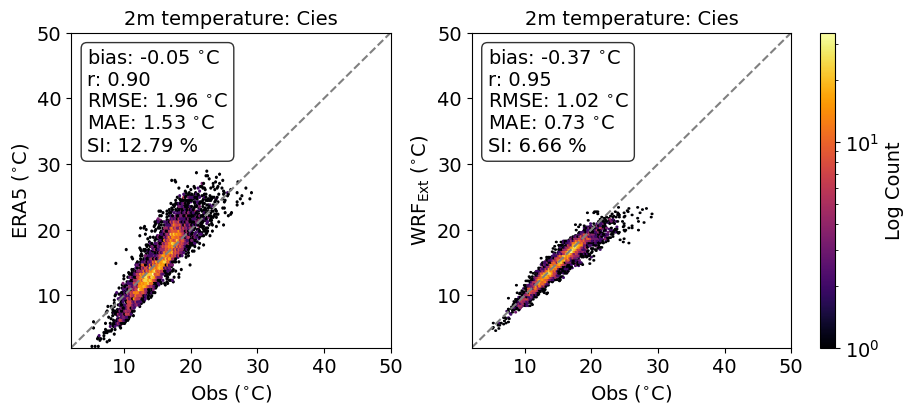

In [31]:
fig = plt.figure(figsize=(9, 4), constrained_layout=True)
gs = fig.add_gridspec(1,2)
limits = [2,50]
hexbin_plotter(gs[0,0],cite_data['temp_dfs'][0],cite_data['temp_dfs'][1],f'2m temperature: {key}',text_arg=True,units=r'$^{\circ}$C',
               xlabel=r'Obs ($^{\circ}$C)',ylabel='ERA5 ($^{\circ}$C)',limits=limits)
ax = hexbin_plotter(gs[0,1],cite_data['temp_dfs'][0],cite_data['temp_dfs'][2],f'2m temperature: {key}',text_arg=True,units=r'$^{\circ}$C',
                    xlabel='Obs ($^{\circ}$C)',ylabel=r'WRF$_{\mathrm{Ext}}$ ($^{\circ}$C)',colorbar=True,limits=limits)
plt.savefig(f'{case}_{run}_{key}_temperature_hexbins.png',dpi=300,bbox_inches='tight',pad_inches=0)

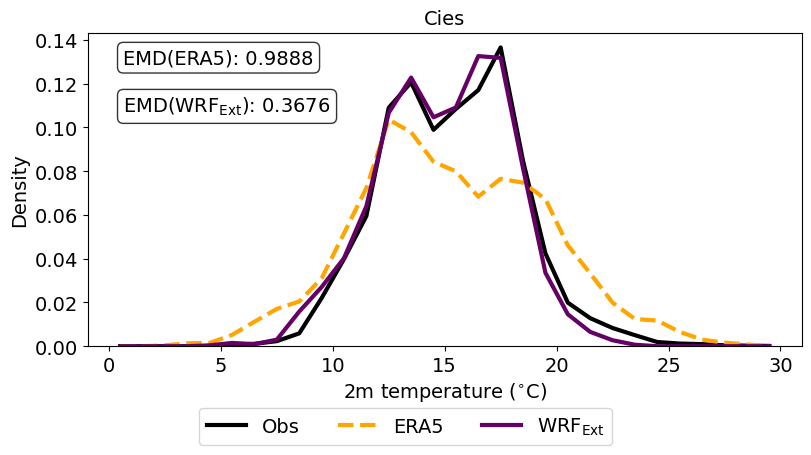

In [33]:
bins=np.arange(0, 30.1, 1)
labels = ['Obs', 'ERA5', r'WRF$_{\mathrm{Ext}}$']

fig = plt.figure(figsize=(8, 4), constrained_layout=True)
gs = fig.add_gridspec(1,1)
ax = hist_pdf_plotter(gs[0,0],cite_data['temp_dfs'],bins,line_styles,colors,labels,xlabel=r'2m temperature ($^{\circ}$C)',ylabel = 'Density',title=key,text_arg=True)

# Add a legend at the bottom
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', bbox_to_anchor=(0.5, -0.1), ncol=len(labels), borderaxespad=0.,fontsize=14)

plt.savefig(f'{case}_{run}_{key}_temperature_hist_pdf.png',dpi=300,bbox_inches='tight',pad_inches=0)

### Observational cite CS

In [34]:
run = 'Validation_runs'
key = 'CS'
# === Simulations from wrfout ===
chunks={"Time": -1,"south_north": 8,"west_east": 8}
# read XLAND and get the lat lon data from this
XLAND = xr.open_dataset(f'{root_dir}/{run}/{case}/Postprocessed/variablewise_files/XLAND.nc')
XLAT = XLAND.XLAT
XLONG = XLAND.XLONG

ws = xr.open_dataset(f'{root_dir}/{run}/{case}/Postprocessed/variablewise_files/ws_10.nc')['ws']
ws_df = read_pointwise_timeseries(ws,obs_points[key][0],obs_points[key][1]).drop_vars(['XLONG','XLAT']).to_dataframe(name='ws')

t2 = xr.open_dataset(f'{root_dir}/{run}/{case}/Postprocessed/variablewise_files/T2.nc',chunks=chunks)
t2 = t2.assign_coords(XLAT=XLAT,XLONG=XLONG)
t2_df = read_pointwise_timeseries(t2,obs_points[key][0],obs_points[key][1],var_name='T2').drop_vars(['XLONG','XLAT']).to_dataframe(name='t2')

sim_df = pd.concat([ws_df,t2_df],axis=1)
sim_df.columns = pd.MultiIndex.from_product([[run], sim_df.columns])

'''
# -- Observations --#
obs_df = pd.read_csv(f'{root_dir}/eval/Observations/Buoy/Portugal/Cabo_Silleiro_Buoy.csv',header=1,index_col=0,sep='\t')
obs_df.index = pd.to_datetime(obs_df.index, format='%Y-%m-%d %H')
obs_df.replace(-9999.9, np.nan, inplace=True)
obs_df.dropna(inplace=True)
obs_df = obs_df[start:end].iloc[:,:-1]
'''

# -- Observations --#
obs_df = pd.read_csv(f'{root_dir}/eval/Observations/Buoy/Portugal/15350_19531_2248_ALL_20110101152054_20121231152054.csv',header=1,index_col=0,sep='\t')
obs_df.index = pd.to_datetime(obs_df.index, format='%Y-%m-%d %H')
#obs_df.replace(-9999.9, np.nan, inplace=True)
obs_df.dropna(inplace=True)
obs_df = obs_df[start:end].iloc[:,:-1]
obs_df = obs_df[['Wind Speed(m/s)','Wind coming-from Direction(0=N,90=E)','Air Temperature(ºC)']]

#Add top column name as obs
head_column = 'Obs'
obs_df.columns = pd.MultiIndex.from_product([[head_column], obs_df.columns])
obs_df['Obs']['Wind Speed(m/s)'] = extrapolate(obs_df['Obs']['Wind Speed(m/s)'],3,10,0.0002)

#--- Reanalysis from open meteo---#
ERA5 = pd.read_csv(f'{root_dir}/eval/Reanalysis/open-meteo/{key}_ERA5.csv',header=2,index_col=0)
ERA5.index = pd.to_datetime(ERA5.index)
ERA5.columns = pd.MultiIndex.from_product([['ERA5'], ERA5.columns])

# Now, combine the df df_7303, and df_7303_reanalysis side by side
merged_df = sim_df.merge(obs_df, left_index=True, right_index=True, how='inner')
merged_df = merged_df.merge(ERA5, left_index=True, right_index=True, how='inner')

# wind speed dataframes
ws_dfs = [merged_df['Obs']['Wind Speed(m/s)'],
          merged_df['ERA5']['wind_speed_10m (m/s)'],
         merged_df[run]['ws']]

# 2m temperature dataframes
temp_dfs = [merged_df['Obs']['Air Temperature(ºC)'],
           merged_df['ERA5']['temperature_2m (°C)'],
           merged_df[run]['t2']] #convert into Kelvin

# --- Storing the dataframes into the validation list here ---#
cite_data = {'ws_dfs': ws_dfs,
            'temp_dfs': temp_dfs}

Time elapsed for nearest point identification is 0.0028324127197265625s
{'south_north': 199, 'west_east': 34}
Time elapsed for nearest point identification is 0.0014071464538574219s
{'south_north': 199, 'west_east': 34}


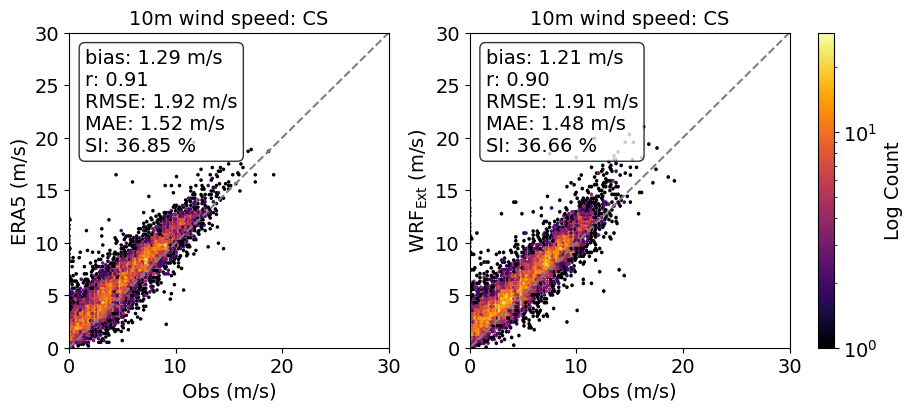

In [36]:
fig = plt.figure(figsize=(9, 4), constrained_layout=True)
gs = fig.add_gridspec(1,2)
limits = [0,30]
hexbin_plotter(gs[0,0],cite_data['ws_dfs'][0],cite_data['ws_dfs'][1],f'10m wind speed: {key}',text_arg=True,units='m/s',xlabel='Obs (m/s)',ylabel='ERA5 (m/s)',limits=limits)
ax = hexbin_plotter(gs[0,1],cite_data['ws_dfs'][0],cite_data['ws_dfs'][2],f'10m wind speed: {key}',text_arg=True,units='m/s',
                    xlabel='Obs (m/s)',ylabel=r'WRF$_{\mathrm{Ext}}$ (m/s)',colorbar=True,limits=limits)
plt.savefig(f'{case}_{run}_{key}_wind_hexbins.png',dpi=300,bbox_inches='tight',pad_inches=0)

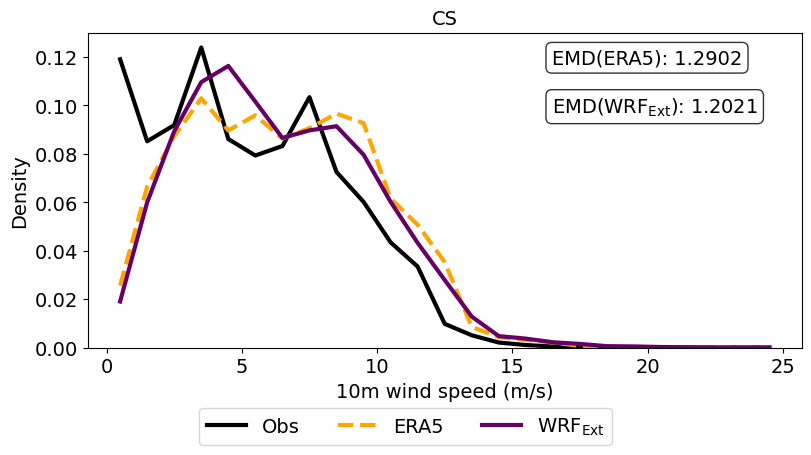

In [37]:
bins=np.arange(0, 25.1, 1)
labels = ['Obs', 'ERA5', r'WRF$_{\mathrm{Ext}}$']

fig = plt.figure(figsize=(8, 4), constrained_layout=True)
gs = fig.add_gridspec(1,1)
ax = hist_pdf_plotter(gs[0,0],cite_data['ws_dfs'],bins,line_styles,colors,labels,xlabel='10m wind speed (m/s)',ylabel = 'Density',title=key,text_arg=True,text_alignment='right')

# Add a legend at the bottom
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', bbox_to_anchor=(0.5, -0.1), ncol=len(labels), borderaxespad=0.,fontsize=14)

plt.savefig(f'{case}_{run}_{key}_wind_hist_pdf.png',dpi=300,bbox_inches='tight',pad_inches=0)

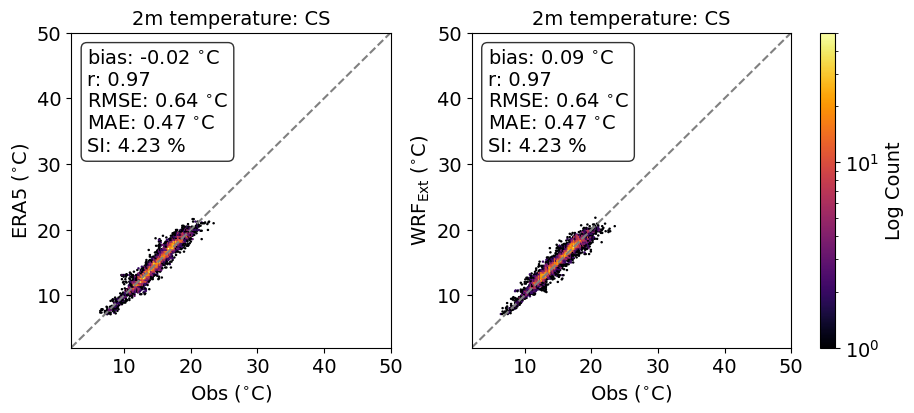

In [38]:
fig = plt.figure(figsize=(9, 4), constrained_layout=True)
gs = fig.add_gridspec(1,2)
limits = [2,50]
hexbin_plotter(gs[0,0],cite_data['temp_dfs'][0],cite_data['temp_dfs'][1],f'2m temperature: {key}',text_arg=True,units=r'$^{\circ}$C',
               xlabel=r'Obs ($^{\circ}$C)',ylabel='ERA5 ($^{\circ}$C)',limits=limits)
ax = hexbin_plotter(gs[0,1],cite_data['temp_dfs'][0],cite_data['temp_dfs'][2],f'2m temperature: {key}',text_arg=True,units=r'$^{\circ}$C',
                    xlabel='Obs ($^{\circ}$C)',ylabel=r'WRF$_{\mathrm{Ext}}$ ($^{\circ}$C)',colorbar=True,limits=limits)
plt.savefig(f'{case}_{run}_{key}_temperature_hexbins.png',dpi=300,bbox_inches='tight',pad_inches=0)

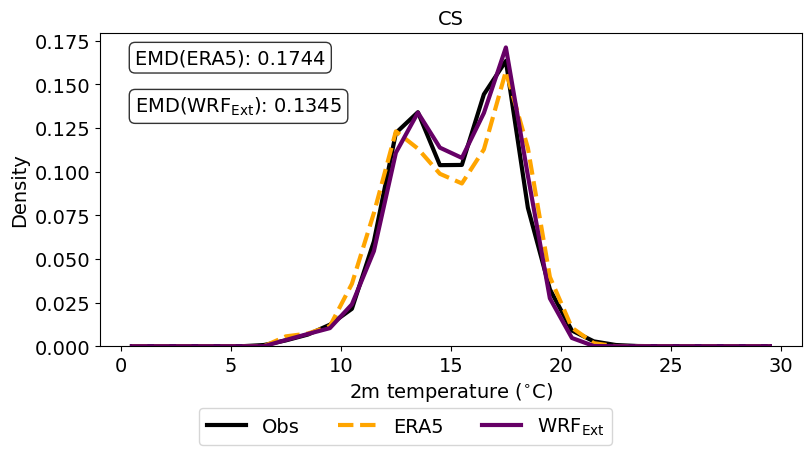

In [39]:
bins=np.arange(0, 30.1, 1)
labels = ['Obs', 'ERA5', r'WRF$_{\mathrm{Ext}}$']

fig = plt.figure(figsize=(8, 4), constrained_layout=True)
gs = fig.add_gridspec(1,1)
ax = hist_pdf_plotter(gs[0,0],cite_data['temp_dfs'],bins,line_styles,colors,labels,xlabel=r'2m temperature ($^{\circ}$C)',ylabel = 'Density',title=key,text_arg=True)

# Add a legend at the bottom
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', bbox_to_anchor=(0.5, -0.1), ncol=len(labels), borderaxespad=0.,fontsize=14)

plt.savefig(f'{case}_{run}_{key}_temperature_hist_pdf.png',dpi=300,bbox_inches='tight',pad_inches=0)

## Validation with Extended domain

In [40]:
# -- Simulations --#
case = 'Portugal_coast'
runs = ['New_runs','Validation_runs']
levels = ['100','120','150']
optimization_data[case] = {}

for key in sample_points:
    ws_dfs = []
    temp_dfs = []
    for run in runs:
        # read XLAND and get the lat lon data from this
        XLAND = xr.open_dataset(f'{root_dir}/{run}/{case}/Postprocessed/variablewise_files/XLAND.nc')
        XLAT = XLAND.XLAT
        XLONG = XLAND.XLONG
            
        wsdfs = []
        for level in levels:
            run_dir=f'{root_dir}/{run}/{case}/Postprocessed/variablewise_files'
            ws = xr.open_dataset(f'{run_dir}/ws_{level}.nc')['ws']

            df = read_pointwise_timeseries(ws.sel(Time=slice(start,end)),sample_points[key][0],sample_points[key][1]).drop_vars(['XLONG','XLAT','num_z_levels_stag']).to_dataframe(name='data')
            df.columns = [level]
            wsdfs.append(df)
        
        wsdfs = pd.concat(wsdfs,axis=1)
        wsdfs.columns = pd.MultiIndex.from_product([[run], wsdfs.columns])
        ws_dfs.append(wsdfs)
        
        tempdfs = []
        t2 = xr.open_dataset(f'{root_dir}/{run}/{case}/Postprocessed/variablewise_files/T2.nc',chunks=chunks)
        t2 = t2.assign_coords(XLAT=XLAT,XLONG=XLONG)
        t2_df = read_pointwise_timeseries(t2.sel(Time=slice(start,end)),sample_points[key][0],sample_points[key][1],var_name='T2').to_dataframe(name='t2')
        
        t2_df.columns = pd.MultiIndex.from_product([[run], t2_df.columns])
        temp_dfs.append(t2_df)
        
    # --- Storing the dataframes into the validation list here ---#
    cite_data = {'ws_dfs': ws_dfs, 'temp_dfs': temp_dfs}
    optimization_data[case][key] = cite_data

Time elapsed for nearest point identification is 0.003706216812133789s
{'south_north': 26, 'west_east': 79}
Time elapsed for nearest point identification is 0.0032541751861572266s
{'south_north': 26, 'west_east': 79}
Time elapsed for nearest point identification is 0.0034847259521484375s
{'south_north': 26, 'west_east': 79}
Time elapsed for nearest point identification is 0.0013642311096191406s
{'south_north': 26, 'west_east': 79}
Time elapsed for nearest point identification is 0.005374908447265625s
{'south_north': 33, 'west_east': 114}
Time elapsed for nearest point identification is 0.006451845169067383s
{'south_north': 33, 'west_east': 114}
Time elapsed for nearest point identification is 0.006489276885986328s
{'south_north': 33, 'west_east': 114}
Time elapsed for nearest point identification is 0.001707315444946289s
{'south_north': 33, 'west_east': 114}
Time elapsed for nearest point identification is 0.003139495849609375s
{'south_north': 64, 'west_east': 54}
Time elapsed for near

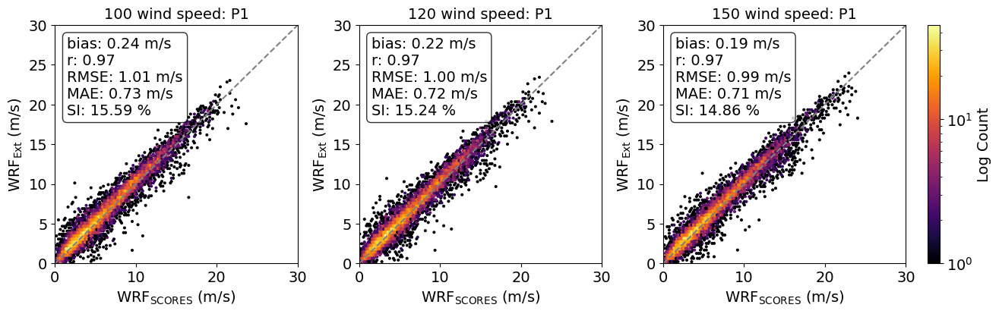

In [42]:
case = 'Portugal_coast'
runs = ['New_runs','Validation_runs']
labels=[r'WRF$_{\mathrm{SCORES}}$',r'WRF$_{\mathrm{Ext}}$']
levels = ['100','120','150']

key = 'P1'
fig = plt.figure(figsize=(13, 4), constrained_layout=True)
gs = fig.add_gridspec(1,3)
limits = [0,30]

cite_data = optimization_data[case][key]
ws_dfs = cite_data['ws_dfs']
for i,level in enumerate(levels):
    colorbar = True if i == 2 else False
    ax = hexbin_plotter(gs[0,i],cite_data['ws_dfs'][0][runs[0]][level],cite_data['ws_dfs'][1][runs[1]][level],
                        f'{level} wind speed: {key}',text_arg=True,units='m/s',xlabel=r'WRF$_{\mathrm{SCORES}}$ (m/s)',
                        ylabel=r'WRF$_{\mathrm{Ext}}$ (m/s)',colorbar=colorbar,limits=limits)
plt.savefig(f'{case}_optimization_runs_{key}_wind_hexbins.png',dpi=300,bbox_inches='tight',pad_inches=0)

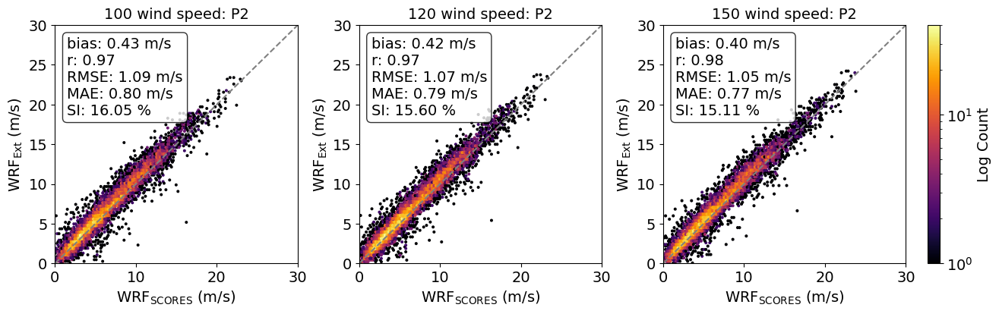

In [44]:
key = 'P2'
fig = plt.figure(figsize=(13, 4), constrained_layout=True)
gs = fig.add_gridspec(1,3)
limits = [0,30]

cite_data = optimization_data[case][key]
ws_dfs = cite_data['ws_dfs']
for i,level in enumerate(levels):
    colorbar = True if i == 2 else False
    ax = hexbin_plotter(gs[0,i],cite_data['ws_dfs'][0][runs[0]][level],cite_data['ws_dfs'][1][runs[1]][level],
                        f'{level} wind speed: {key}',text_arg=True,units='m/s',xlabel=r'WRF$_{\mathrm{SCORES}}$ (m/s)',
                        ylabel=r'WRF$_{\mathrm{Ext}}$ (m/s)',colorbar=colorbar,limits=limits)
plt.savefig(f'{case}_optimization_runs_{key}_wind_hexbins.png',dpi=300,bbox_inches='tight',pad_inches=0)

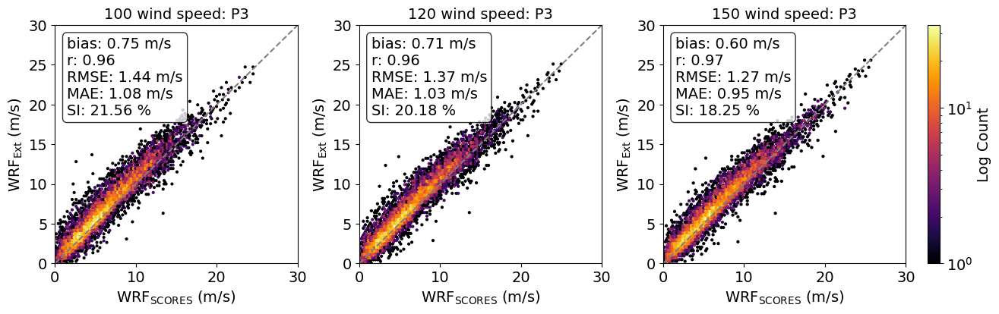

In [45]:
key = 'P3'
fig = plt.figure(figsize=(13, 4), constrained_layout=True)
gs = fig.add_gridspec(1,3)
limits = [0,30]

cite_data = optimization_data[case][key]
ws_dfs = cite_data['ws_dfs']
for i,level in enumerate(levels):
    colorbar = True if i == 2 else False
    ax = hexbin_plotter(gs[0,i],cite_data['ws_dfs'][0][runs[0]][level],cite_data['ws_dfs'][1][runs[1]][level],
                        f'{level} wind speed: {key}',text_arg=True,units='m/s',xlabel=r'WRF$_{\mathrm{SCORES}}$ (m/s)',
                        ylabel=r'WRF$_{\mathrm{Ext}}$ (m/s)',colorbar=colorbar,limits=limits)
plt.savefig(f'{case}_optimization_runs_{key}_wind_hexbins.png',dpi=300,bbox_inches='tight',pad_inches=0)

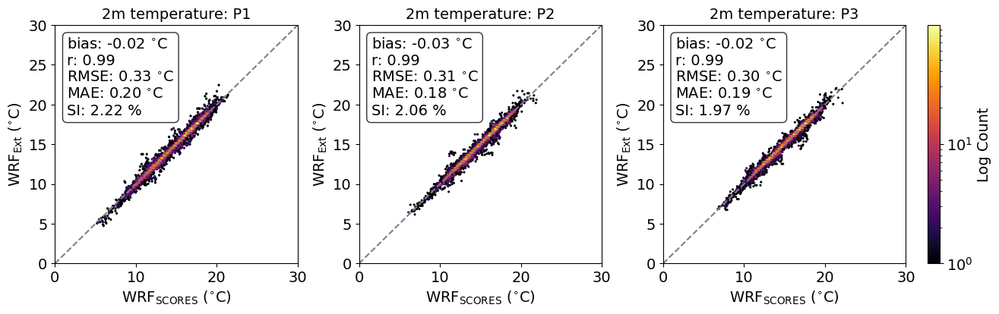

In [46]:
runs = ['New_runs','Validation_runs']
labels=[r'WRF$_{\mathrm{SCORES}}$',r'WRF$_{\mathrm{Ext}}$']
levels = ['100','120','150']

fig = plt.figure(figsize=(13, 4), constrained_layout=True)
gs = fig.add_gridspec(1,3)
limits = [0,30]

temp_dfs = cite_data['temp_dfs']
for i,key in enumerate(sample_points):
    colorbar = True if i == 2 else False
    cite_data = optimization_data[case][key]
    ax = hexbin_plotter(gs[0,i],cite_data['temp_dfs'][0][runs[0]]['t2'],cite_data['temp_dfs'][1][runs[1]]['t2'],
                        f'2m temperature: {key}',text_arg=True,units=r'$^{\circ}$C',xlabel=r'WRF$_{\mathrm{SCORES}}$ ($^{\circ}$C)',
                        ylabel=r'WRF$_{\mathrm{Ext}}$ ($^{\circ}$C)',colorbar=colorbar,limits=limits)
plt.savefig(f'{case}_optimization_runs_temperature_hexbins.png',dpi=300,bbox_inches='tight',pad_inches=0)

## Resource assessment using $WRF_{SCORES}$ simulations

In [30]:
client.close()
cluster.close()

In [31]:
import dask.distributed as dd
import dask
import dask.array as da
# Create a Dask cluster
print("Starting parallel computing...")
cluster = dd.LocalCluster(n_workers=48, dashboard_address=':22722')

# Connect to the cluster
client = dd.Client(cluster)
client

Starting parallel computing...


Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:22722/status,
Dashboard: http://127.0.0.1:22722/status,Workers: 48
Total threads: 96,Total memory: 187.55 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:42979,Workers: 48
Dashboard: http://127.0.0.1:22722/status,Total threads: 96
Started: Just now,Total memory: 187.55 GiB
Comm: tcp://127.0.0.1:44111,Total threads: 2
Dashboard: http://127.0.0.1:41159/status,Memory: 3.91 GiB
Nanny: tcp://127.0.0.1:41449,


#### Sample swdown at Portugal

Time elapsed for nearest point identification is 0.0019402503967285156s
{'south_north': 26, 'west_east': 79}
Time elapsed for nearest point identification is 0.0019419193267822266s
{'south_north': 64, 'west_east': 54}
Time elapsed for nearest point identification is 0.0016033649444580078s
{'south_north': 102, 'west_east': 31}


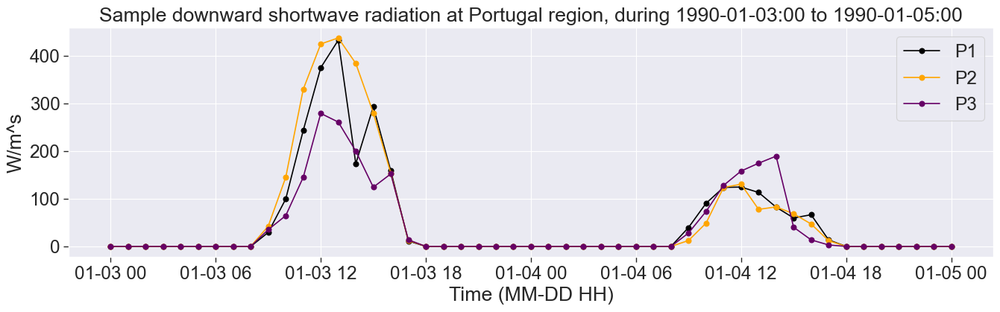

In [13]:
run = 'New_runs'
# read XLAND and get the lat lon data from this
XLAND = xr.open_dataset(f'{root_dir}/{run}/{case}/Postprocessed/XLAND.nc')
XLAT = XLAND.XLAT
XLONG = XLAND.XLONG

sns.set_theme(style="white")
sns.set(rc={"xtick.bottom" : True, "ytick.left" : True})
sns.set_context("paper", font_scale=2)
fig, ax = plt.subplots(1, 1, figsize=(16, 4))
for i,key in enumerate(sample_points.keys()):
    swdown = xr.open_dataset(f'{root_dir}/{run}/Portugal_coast/Postprocessed/variablewise_files/SWDOWN2.nc',chunks=chunks)
    swdown = swdown.assign_coords(XLAT=XLAT,XLONG=XLONG)
    swdown_df = read_pointwise_timeseries(swdown,sample_points[key][0],sample_points[key][1],var_name='SWDOWN2').to_dataframe(name='swdown')
    ax.plot(swdown_df.loc['1990-01-03 00:00:00':'1990-01-05 00:00:00']['swdown'],marker='o',color=colors[i],label=key)
ax.set_xlabel('Time (MM-DD HH)')
ax.set_ylabel(f'W/m^s')
ax.set_title('Sample downward shortwave radiation at Portugal region, during 1990-01-03:00 to 1990-01-05:00')
ax.legend()
plt.savefig(f'{case}_optimization_runs_sample_SWDOWN.pdf',dpi=300,bbox_inches='tight',pad_inches=0)

## Wind resources

## 120 m

In [40]:
%%time
case = 'Portugal_coast'
run='New_runs'
run_dir=f'{root_dir}/{run}/{case}/Postprocessed/variablewise_files'
chunks={"Time": -1,"south_north": 8,"west_east": 8}

level = 120
rated_power = 8 # MW
turbine_type = f'{rated_power}MW'
ws = xr.open_dataset(f'{run_dir}/ws_{level}.nc',chunks=chunks)['ws']
wpd = WPD(ws)#.compute()
tp = xr.open_dataset(f'{run_dir}/{turbine_type}/tp_{level}.nc',chunks=chunks)['power'].compute() # in kW
CF = tp*1e2/(rated_power*1e3) # in %

CPU times: user 3min 18s, sys: 4min 59s, total: 8min 17s
Wall time: 6min 41s


### Mean wind resources

In [17]:
%%time
mean_ws = ws.mean(dim='Time').compute()
mean_wpd = wpd.mean(dim='Time').compute()
mean_AEP = tp.isel(Time=slice(None,-1)).resample(Time='Y').sum().mean(dim='Time').compute()
#mean_CF = mean_AEP/(8766*8000)
mean_CF = CF.mean(dim='Time').compute()

CPU times: user 1min 29s, sys: 1min 6s, total: 2min 36s
Wall time: 3min 49s


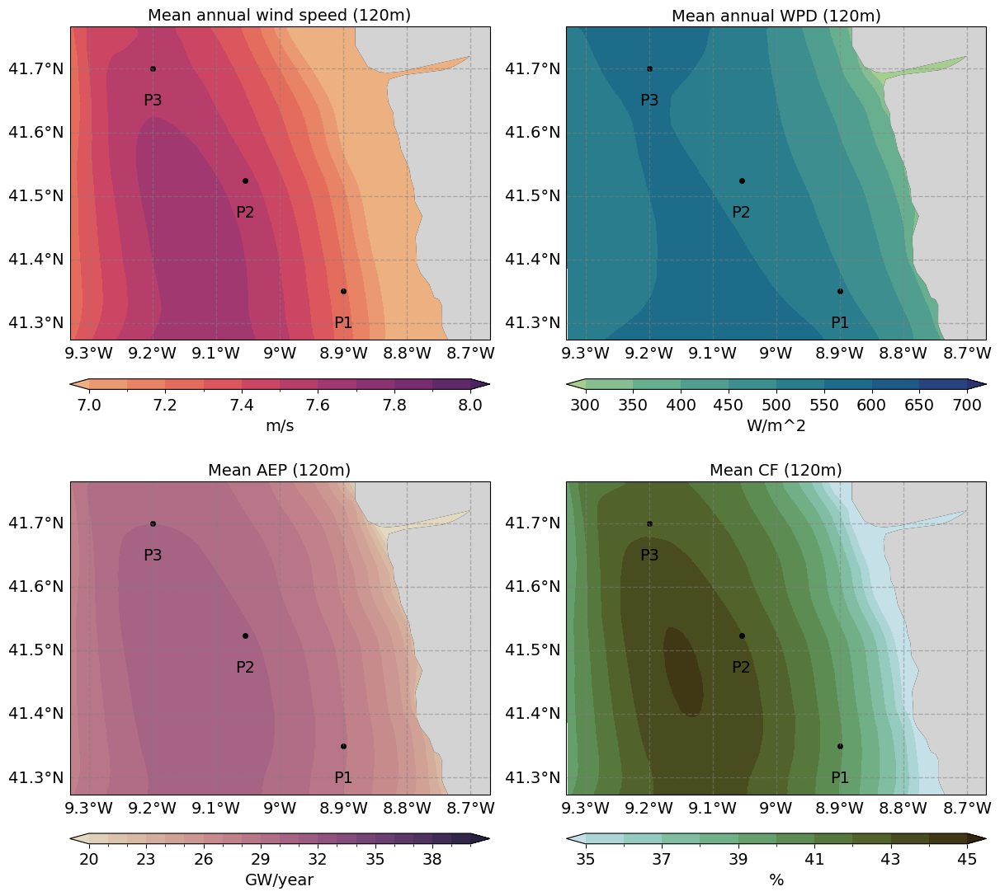

In [19]:
fig = plt.figure(figsize=(12, 11), constrained_layout=True)
gs = fig.add_gridspec(2,2)
map_plotter(gs[0,0],mean_ws[10:-10,10:-10],'XLONG','XLAT',np.arange(7,8.1,0.1),'flare',f'Mean annual wind speed ({level}m)',1,'m/s','horizontal',sample_points = sample_points)
map_plotter(gs[0,1],mean_wpd[10:-10,10:-10],'XLONG','XLAT',np.arange(300,700.1,50),'crest',f'Mean annual WPD ({level}m)',1,'W/m^2','horizontal',sample_points = sample_points)
map_plotter(gs[1,0],mean_AEP[10:-10,10:-10]/1e6,'XLONG','XLAT',np.arange(20,40.1,1),"ch:s=-.2,r=.6",f'Mean AEP ({level}m)',1,'GW/year','horizontal',sample_points = sample_points)
map_plotter(gs[1,1],mean_CF[10:-10,10:-10]*1e2,'XLONG','XLAT',np.arange(35,45.1,1),"ch:s=10,r=.6",f'Mean CF ({level}m)',1,'%','horizontal',sample_points = sample_points)
plt.savefig(f'{case}_optimization_runs_mean_wind_resources_{level}m.png',dpi=300,bbox_inches='tight',pad_inches=0)

### Resource variabilities

Time elapsed for nearest point identification is 0.0032958984375s
{'south_north': 26, 'west_east': 79}
Time elapsed for nearest point identification is 0.0012812614440917969s
{'south_north': 64, 'west_east': 54}
Time elapsed for nearest point identification is 0.0015120506286621094s
{'south_north': 102, 'west_east': 31}
Time elapsed for nearest point identification is 0.0028471946716308594s
{'south_north': 26, 'west_east': 79}
Time elapsed for nearest point identification is 0.0013759136199951172s
{'south_north': 64, 'west_east': 54}
Time elapsed for nearest point identification is 0.0011420249938964844s
{'south_north': 102, 'west_east': 31}
Time elapsed for nearest point identification is 0.001596212387084961s
{'south_north': 26, 'west_east': 79}
Time elapsed for nearest point identification is 0.0011851787567138672s
{'south_north': 64, 'west_east': 54}
Time elapsed for nearest point identification is 0.001998424530029297s
{'south_north': 102, 'west_east': 31}


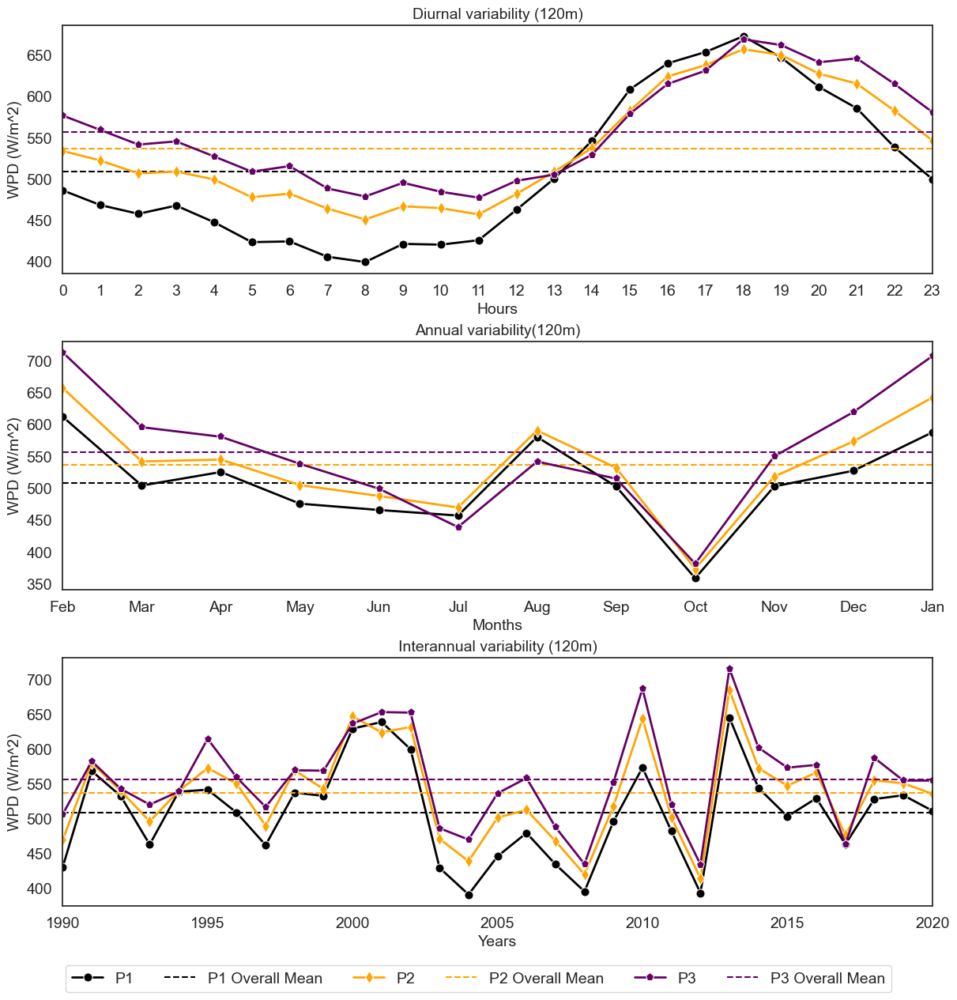

In [20]:
fig = plt.figure(figsize=(12, 12), constrained_layout=True)
gs = fig.add_gridspec(3,1)
sns.set_theme(style="white")

hourly_df = pd.DataFrame()
for i,key in enumerate(sample_points.keys()):
    ds = read_pointwise_timeseries(wpd,sample_points[key][0],sample_points[key][1])

    pointwise_df = pd.DataFrame()

    # Loop through hours
    for hour in range(0,24):
        # Extract data for the current year
        data = ds.sel(Time=ds.Time.dt.hour == hour).mean().values
        # Create a new DataFrame with the year as a column
        #df = pd.DataFrame({'Hour': [hour], key: data})
        df = pd.DataFrame({key: data}, index=pd.Index([hour], name='Hour'))
        # Append the data to the main DataFrame
        pointwise_df = pd.concat([pointwise_df, df])
    hourly_df = pd.concat([hourly_df, pointwise_df],axis=1)

variability_plotter(gs[0,0],hourly_df,f'Diurnal variability ({level}m)','Hours','WPD (W/m^2)', key,colors[i],'o',xlabel_ticks=hours)


monthly_df = pd.DataFrame()
for i,key in enumerate(sample_points.keys()):
    ds = read_pointwise_timeseries(wpd,sample_points[key][0],sample_points[key][1])

    pointwise_df = pd.DataFrame()

    # Loop through hours
    for month in [12, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]:
        # Extract data for the current year
        data = ds.sel(Time=ds.Time.dt.month == month).mean().values
        # Create a new DataFrame with the year as a column
        #df = pd.DataFrame({'Hour': [hour], key: data})
        df = pd.DataFrame({key: data}, index=pd.Index([month], name='month'))
        # Append the data to the main DataFrame
        pointwise_df = pd.concat([pointwise_df, df])
    monthly_df = pd.concat([monthly_df, pointwise_df],axis=1)

variability_plotter(gs[1,0],monthly_df,f'Annual variability({level}m)','Months','WPD (W/m^2)', key,colors[i],'o',xlabel_ticks=months)

yearly_df = pd.DataFrame()
for i,key in enumerate(sample_points.keys()):
    ds = read_pointwise_timeseries(wpd,sample_points[key][0],sample_points[key][1])

    pointwise_df = pd.DataFrame()

    # Loop through hours
    for year in list(range(1990, 2021)):
        # Extract data for the current year
        data = ds.sel(Time=ds.Time.dt.year == year).mean().values
        # Create a new DataFrame with the year as a column
        #df = pd.DataFrame({'Hour': [hour], key: data})
        df = pd.DataFrame({key: data}, index=pd.Index([year], name='year'))
        # Append the data to the main DataFrame
        pointwise_df = pd.concat([pointwise_df, df])
    yearly_df = pd.concat([yearly_df, pointwise_df],axis=1)

axs = variability_plotter(gs[2,0],yearly_df,f'Interannual variability ({level}m)','Years','WPD (W/m^2)', key,colors[i],'o')

# Extract legend from one of the subplots
handles, labels = axs.get_legend_handles_labels()
# Create a common legend below the figures
fig.legend(handles, labels, loc='lower center', ncol=len(labels), bbox_to_anchor=(0.5, -0.05),fontsize=14)

plt.savefig(f'{case}_optimization_runs_wind_resources_variabilities_{level}m.png',dpi=300,bbox_inches='tight',pad_inches=0)

Time elapsed for nearest point identification is 0.003993511199951172s
{'south_north': 26, 'west_east': 79}
Time elapsed for nearest point identification is 0.0017654895782470703s
{'south_north': 64, 'west_east': 54}
Time elapsed for nearest point identification is 0.0042116641998291016s
{'south_north': 102, 'west_east': 31}
Time elapsed for nearest point identification is 0.0017781257629394531s
{'south_north': 26, 'west_east': 79}
Time elapsed for nearest point identification is 0.0016231536865234375s
{'south_north': 64, 'west_east': 54}
Time elapsed for nearest point identification is 0.0018100738525390625s
{'south_north': 102, 'west_east': 31}
Time elapsed for nearest point identification is 0.0019893646240234375s
{'south_north': 26, 'west_east': 79}
Time elapsed for nearest point identification is 0.0015804767608642578s
{'south_north': 64, 'west_east': 54}
Time elapsed for nearest point identification is 0.0016443729400634766s
{'south_north': 102, 'west_east': 31}


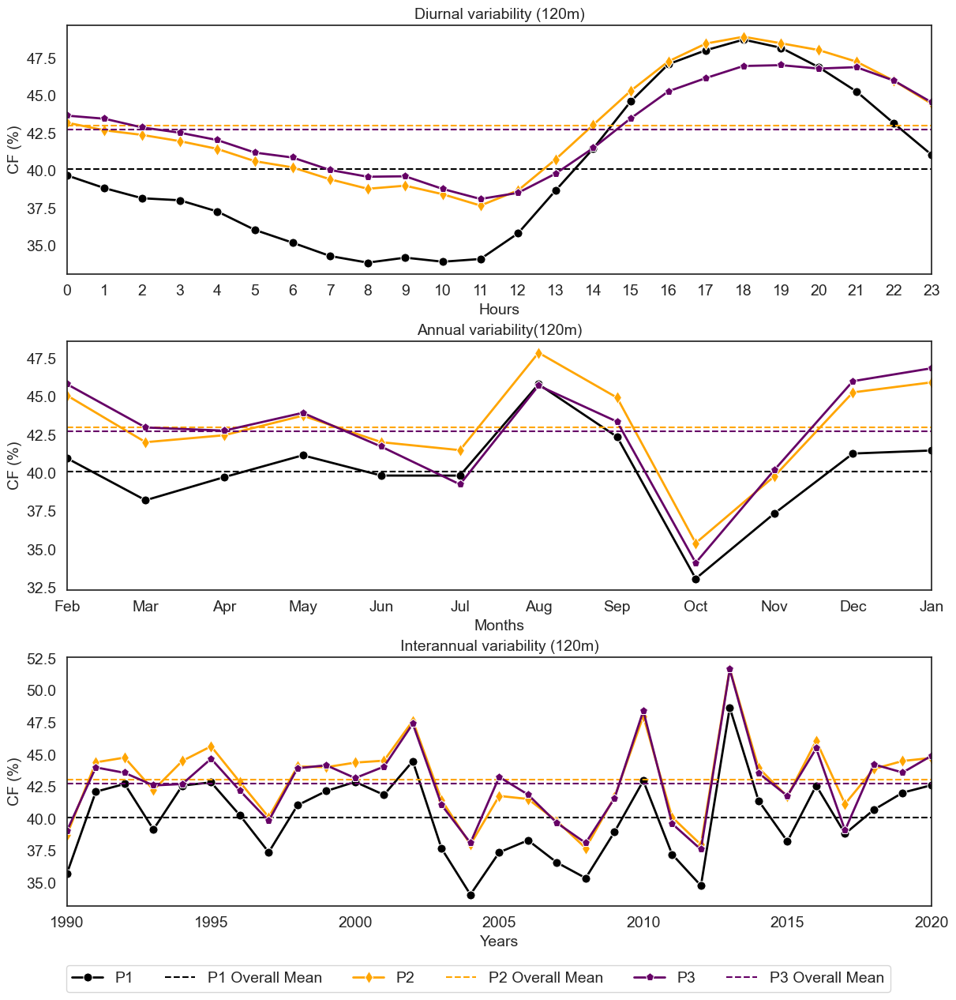

In [44]:
fig = plt.figure(figsize=(12, 12), constrained_layout=True)
gs = fig.add_gridspec(3,1)
sns.set_theme(style="white")

hourly_df = pd.DataFrame()
for i,key in enumerate(sample_points.keys()):
    ds = read_pointwise_timeseries(CF,sample_points[key][0],sample_points[key][1])

    pointwise_df = pd.DataFrame()

    # Loop through hours
    for hour in range(0,24):
        # Extract data for the current year
        data = ds.sel(Time=ds.Time.dt.hour == hour).mean().values
        # Create a new DataFrame with the year as a column
        #df = pd.DataFrame({'Hour': [hour], key: data})
        df = pd.DataFrame({key: data}, index=pd.Index([hour], name='Hour'))
        # Append the data to the main DataFrame
        pointwise_df = pd.concat([pointwise_df, df])
    hourly_df = pd.concat([hourly_df, pointwise_df],axis=1)

variability_plotter(gs[0,0],hourly_df,f'Diurnal variability ({level}m)','Hours','CF (%)', key,colors[i],'o',xlabel_ticks=hours)


monthly_df = pd.DataFrame()
for i,key in enumerate(sample_points.keys()):
    ds = read_pointwise_timeseries(CF,sample_points[key][0],sample_points[key][1])

    pointwise_df = pd.DataFrame()

    # Loop through hours
    for month in [12, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]:
        # Extract data for the current year
        data = ds.sel(Time=ds.Time.dt.month == month).mean().values
        # Create a new DataFrame with the year as a column
        #df = pd.DataFrame({'Hour': [hour], key: data})
        df = pd.DataFrame({key: data}, index=pd.Index([month], name='month'))
        # Append the data to the main DataFrame
        pointwise_df = pd.concat([pointwise_df, df])
    monthly_df = pd.concat([monthly_df, pointwise_df],axis=1)

variability_plotter(gs[1,0],monthly_df,f'Annual variability({level}m)','Months','CF (%)', key,colors[i],'o',xlabel_ticks=months)

yearly_df = pd.DataFrame()
for i,key in enumerate(sample_points.keys()):
    ds = read_pointwise_timeseries(CF,sample_points[key][0],sample_points[key][1])

    pointwise_df = pd.DataFrame()

    # Loop through hours
    for year in list(range(1990, 2021)):
        # Extract data for the current year
        data = ds.sel(Time=ds.Time.dt.year == year).mean().values
        # Create a new DataFrame with the year as a column
        #df = pd.DataFrame({'Hour': [hour], key: data})
        df = pd.DataFrame({key: data}, index=pd.Index([year], name='year'))
        # Append the data to the main DataFrame
        pointwise_df = pd.concat([pointwise_df, df])
    yearly_df = pd.concat([yearly_df, pointwise_df],axis=1)

axs = variability_plotter(gs[2,0],yearly_df,f'Interannual variability ({level}m)','Years','CF (%)', key,colors[i],'o')

# Extract legend from one of the subplots
handles, labels = axs.get_legend_handles_labels()
# Create a common legend below the figures
fig.legend(handles, labels, loc='lower center', ncol=len(labels), bbox_to_anchor=(0.5, -0.05),fontsize=14)

#plt.savefig(f'{case}_optimization_runs_wind_resources_variabilities_{level}m.png',dpi=300,bbox_inches='tight',pad_inches=0)

## 150 m

In [16]:
%%time
case = 'Portugal_coast'
run='New_runs'
run_dir=f'{root_dir}/{run}/{case}/Postprocessed/variablewise_files'
chunks={"Time": -1,"south_north": 8,"west_east": 8}

level = 150
turbine_type = '15MW'
ws = xr.open_dataset(f'{run_dir}/ws_{level}.nc',chunks=chunks)['ws']
wpd = WPD(ws).compute()
tp = xr.open_dataset(f'{run_dir}/{turbine_type}/tp_{level}.nc',chunks=chunks)['power']

CPU times: user 57 s, sys: 58 s, total: 1min 55s
Wall time: 2min 51s


### Mean wind resources

In [17]:
%%time
mean_ws = ws.mean(dim='Time').compute()
mean_wpd = wpd.mean(dim='Time').compute()
mean_AEP = tp.isel(Time=slice(None,-1)).resample(Time='Y').sum().mean(dim='Time').compute()
mean_CF = mean_AEP/(8766*15000)

CPU times: user 1min 30s, sys: 20.5 s, total: 1min 50s
Wall time: 3min 53s
CPU times: user 1min 30s, sys: 20.5 s, total: 1min 50s
Wall time: 3min 53s


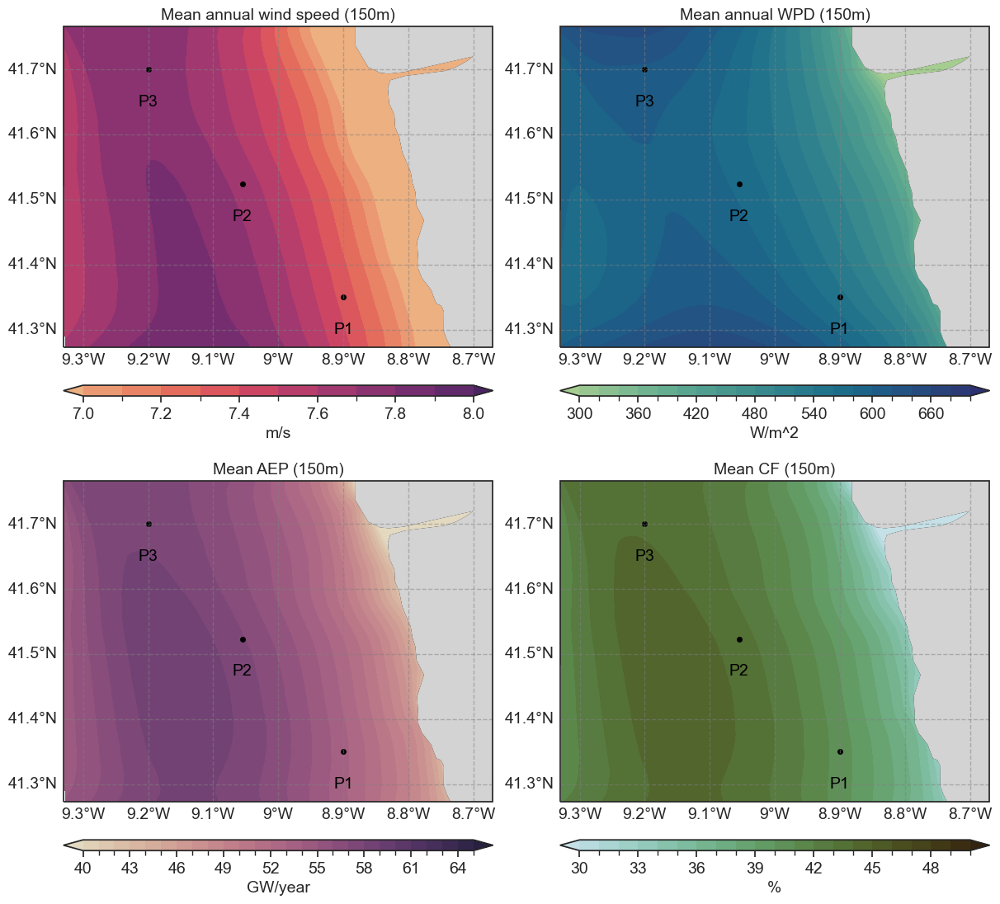

In [20]:
fig = plt.figure(figsize=(12, 11), constrained_layout=True)
gs = fig.add_gridspec(2,2)
map_plotter(gs[0,0],mean_ws[10:-10,10:-10],'XLONG','XLAT',np.arange(7,8.1,0.1),'flare',f'Mean annual wind speed ({level}m)',1,'m/s','horizontal',sample_points = sample_points)
map_plotter(gs[0,1],mean_wpd[10:-10,10:-10],'XLONG','XLAT',np.arange(300,700.1,20),'crest',f'Mean annual WPD ({level}m)',1,'W/m^2','horizontal',sample_points = sample_points)
map_plotter(gs[1,0],mean_AEP[10:-10,10:-10]/1e6,'XLONG','XLAT',np.arange(40,65.1,1),"ch:s=-.2,r=.6",f'Mean AEP ({level}m)',1,'GW/year','horizontal',sample_points = sample_points)
map_plotter(gs[1,1],mean_CF[10:-10,10:-10]*1e2,'XLONG','XLAT',np.arange(30,50.1,1),"ch:s=10,r=.6",f'Mean CF ({level}m)',1,'%','horizontal',sample_points = sample_points)
plt.savefig(f'{case}_optimization_runs_mean_wind_resources_{level}m.png',dpi=300,bbox_inches='tight',pad_inches=0)

### Resource variabilities

Time elapsed for nearest point identification is 0.004428863525390625s
{'south_north': 26, 'west_east': 79}
Time elapsed for nearest point identification is 0.0015597343444824219s
{'south_north': 64, 'west_east': 54}
Time elapsed for nearest point identification is 0.002064943313598633s
{'south_north': 102, 'west_east': 31}
Time elapsed for nearest point identification is 0.0034134387969970703s
{'south_north': 26, 'west_east': 79}
Time elapsed for nearest point identification is 0.001337289810180664s
{'south_north': 64, 'west_east': 54}
Time elapsed for nearest point identification is 0.0012905597686767578s
{'south_north': 102, 'west_east': 31}
Time elapsed for nearest point identification is 0.0018036365509033203s
{'south_north': 26, 'west_east': 79}
Time elapsed for nearest point identification is 0.0013005733489990234s
{'south_north': 64, 'west_east': 54}
Time elapsed for nearest point identification is 0.0012888908386230469s
{'south_north': 102, 'west_east': 31}


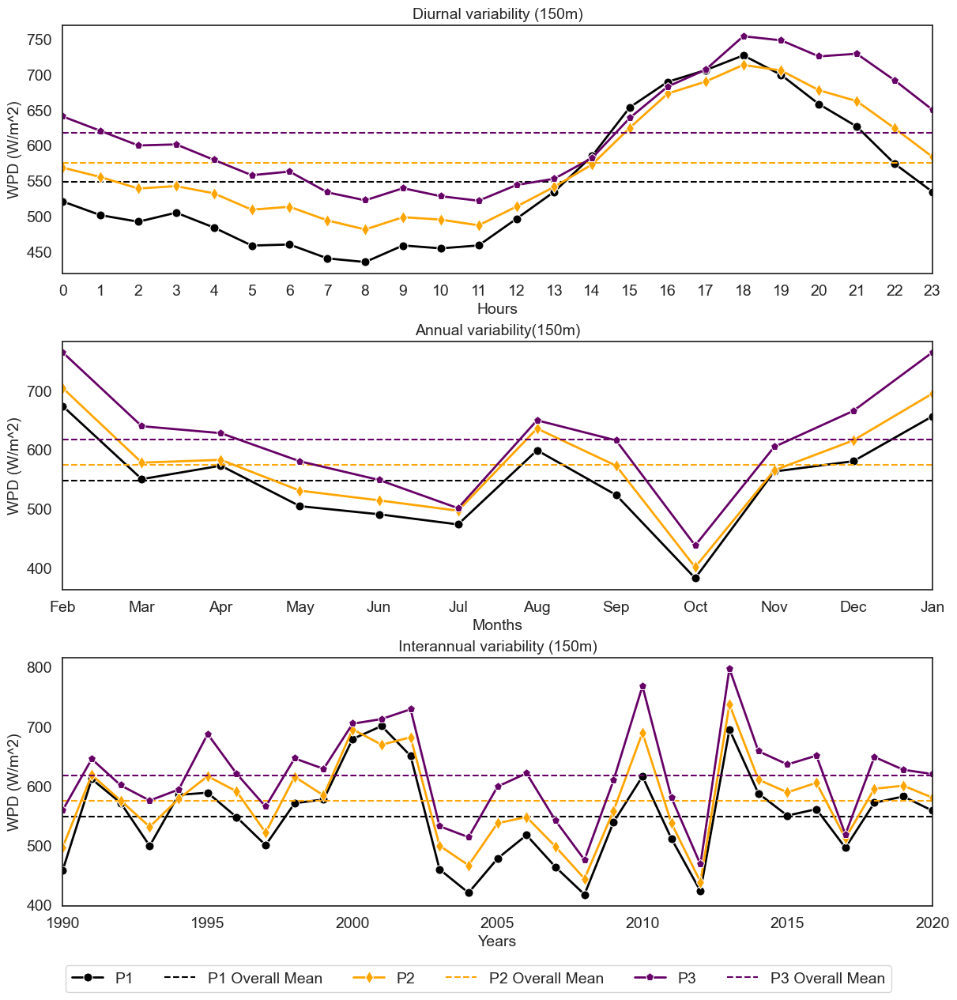

In [19]:
fig = plt.figure(figsize=(12, 12), constrained_layout=True)
gs = fig.add_gridspec(3,1)
sns.set_theme(style="white")

hourly_df = pd.DataFrame()
for i,key in enumerate(sample_points.keys()):
    ds = read_pointwise_timeseries(wpd,sample_points[key][0],sample_points[key][1])

    pointwise_df = pd.DataFrame()

    # Loop through hours
    for hour in range(0,24):
        # Extract data for the current year
        data = ds.sel(Time=ds.Time.dt.hour == hour).mean().values
        # Create a new DataFrame with the year as a column
        #df = pd.DataFrame({'Hour': [hour], key: data})
        df = pd.DataFrame({key: data}, index=pd.Index([hour], name='Hour'))
        # Append the data to the main DataFrame
        pointwise_df = pd.concat([pointwise_df, df])
    hourly_df = pd.concat([hourly_df, pointwise_df],axis=1)

variability_plotter(gs[0,0],hourly_df,f'Diurnal variability ({level}m)','Hours','WPD (W/m^2)', key,colors[i],'o',xlabel_ticks=hours)


monthly_df = pd.DataFrame()
for i,key in enumerate(sample_points.keys()):
    ds = read_pointwise_timeseries(wpd,sample_points[key][0],sample_points[key][1])

    pointwise_df = pd.DataFrame()

    # Loop through hours
    for month in [12, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]:
        # Extract data for the current year
        data = ds.sel(Time=ds.Time.dt.month == month).mean().values
        # Create a new DataFrame with the year as a column
        #df = pd.DataFrame({'Hour': [hour], key: data})
        df = pd.DataFrame({key: data}, index=pd.Index([month], name='month'))
        # Append the data to the main DataFrame
        pointwise_df = pd.concat([pointwise_df, df])
    monthly_df = pd.concat([monthly_df, pointwise_df],axis=1)

variability_plotter(gs[1,0],monthly_df,f'Annual variability({level}m)','Months','WPD (W/m^2)', key,colors[i],'o',xlabel_ticks=months)

yearly_df = pd.DataFrame()
for i,key in enumerate(sample_points.keys()):
    ds = read_pointwise_timeseries(wpd,sample_points[key][0],sample_points[key][1])

    pointwise_df = pd.DataFrame()

    # Loop through hours
    for year in list(range(1990, 2021)):
        # Extract data for the current year
        data = ds.sel(Time=ds.Time.dt.year == year).mean().values
        # Create a new DataFrame with the year as a column
        #df = pd.DataFrame({'Hour': [hour], key: data})
        df = pd.DataFrame({key: data}, index=pd.Index([year], name='year'))
        # Append the data to the main DataFrame
        pointwise_df = pd.concat([pointwise_df, df])
    yearly_df = pd.concat([yearly_df, pointwise_df],axis=1)

axs = variability_plotter(gs[2,0],yearly_df,f'Interannual variability ({level}m)','Years','WPD (W/m^2)', key,colors[i],'o')

# Extract legend from one of the subplots
handles, labels = axs.get_legend_handles_labels()
# Create a common legend below the figures
fig.legend(handles, labels, loc='lower center', ncol=len(labels), bbox_to_anchor=(0.5, -0.05),fontsize=14)

plt.savefig(f'{case}_optimization_runs_wind_resources_variabilities_{level}m.png',dpi=300,bbox_inches='tight',pad_inches=0)

# Solar resource assessment

In [21]:
Epv = 0.216
cell_watt = 365

In [22]:
%%time
run = 'New_runs'
# read XLAND and get the lat lon data from this
XLAND = xr.open_dataset(f'{root_dir}/{run}/{case}/Postprocessed/XLAND.nc')
XLAT = XLAND.XLAT
XLONG = XLAND.XLONG

t2m = xr.open_dataset(f'{root_dir}/{run}/{case}/Postprocessed/variablewise_files/T2.nc',chunks=chunks)
t2m = t2m['T2'].assign_coords(XLAT=XLAT,XLONG=XLONG)
swdown = xr.open_dataset(f'{root_dir}/{run}/{case}/Postprocessed/variablewise_files/SWDOWN2.nc',chunks=chunks)
swdown = swdown['SWDOWN2'].assign_coords(XLAT=XLAT,XLONG=XLONG).compute()
spv = xr.open_dataset(f'{root_dir}/{run}/{case}/Postprocessed/variablewise_files/spv.nc',chunks=chunks)['PVO']

CPU times: user 56.7 s, sys: 49.9 s, total: 1min 46s
Wall time: 2min 2s


In [28]:
%%time
mean_t2m = t2m.mean(dim='Time').compute()
mean_swdown = swdown.mean(dim='Time').compute()
mean_Spv = Spv.isel(Time=slice(None,-1)).resample(Time='Y').sum().mean(dim='Time').compute()
mean_CF = mean_Spv/(8766*cell_watt)

CPU times: user 2min 19s, sys: 57.7 s, total: 3min 16s
Wall time: 4min 24s


In [45]:
(mean_spv[10:-10,10:-10]/1e3).max()

<xarray.DataArray 'PVO' ()>
array(303.25643921)

Task exception was never retrieved
future: <Task finished name='Task-1202517' coro=<Client._gather.<locals>.wait() done, defined at /home/harish/.conda/envs/wrf-python-stable/lib/python3.10/site-packages/distributed/client.py:2119> exception=AllExit()>
Traceback (most recent call last):
  File "/home/harish/.conda/envs/wrf-python-stable/lib/python3.10/site-packages/distributed/client.py", line 2128, in wait
    raise AllExit()
distributed.client.AllExit


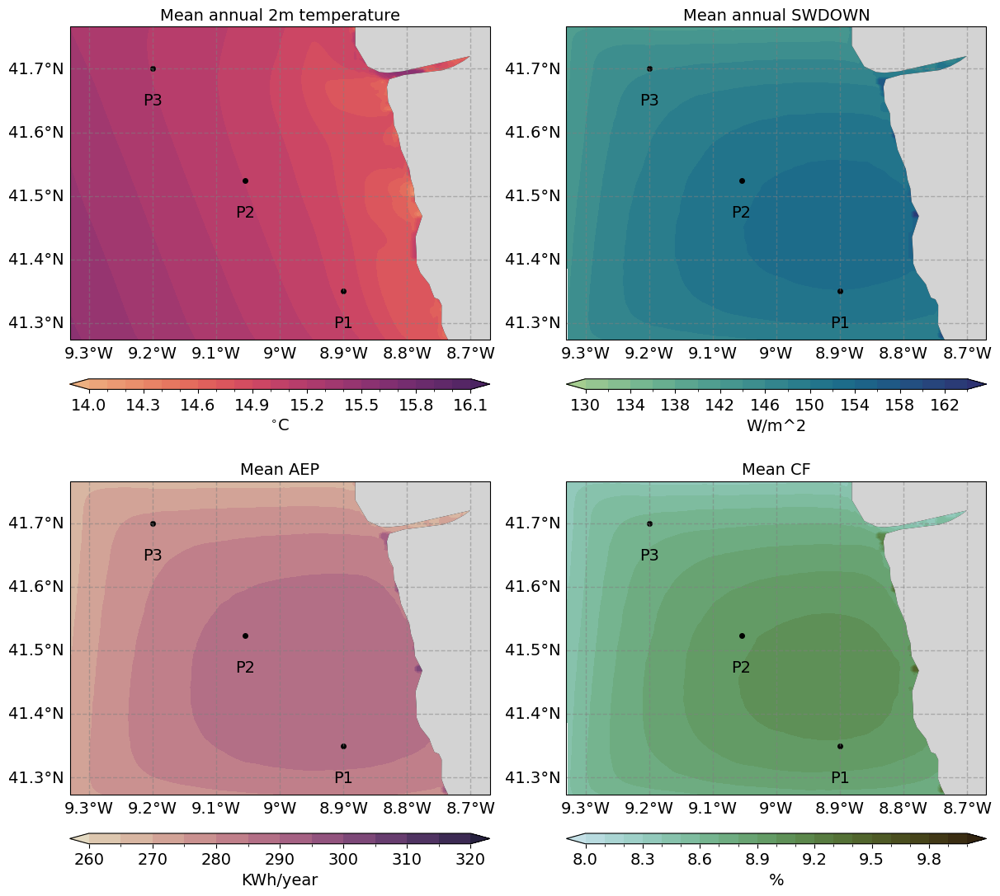

In [33]:
fig = plt.figure(figsize=(12, 11), constrained_layout=True)
gs = fig.add_gridspec(2,2)
map_plotter(gs[0,0],mean_t2m[10:-10,10:-10],'XLONG','XLAT',np.arange(14,16.1,0.1),'flare',f'Mean annual 2m temperature',1,r'$^{\circ}$C','horizontal',sample_points = sample_points)
map_plotter(gs[0,1],mean_swdown[10:-10,10:-10],'XLONG','XLAT',np.arange(130,165.1,2),'crest',f'Mean annual SWDOWN',1,'W/m^2','horizontal',sample_points = sample_points)
map_plotter(gs[1,0],mean_Spv[10:-10,10:-10]/1e3,'XLONG','XLAT',np.arange(260,320.1,5),"ch:s=-.2,r=.6",f'Mean AEP',1,'KWh/year','horizontal',sample_points = sample_points)
map_plotter(gs[1,1],mean_CF[10:-10,10:-10]*1e2,'XLONG','XLAT',np.arange(8,10.1,0.1),"ch:s=10,r=.6",f'Mean CF',1,'%','horizontal',sample_points = sample_points)
plt.savefig(f'{case}_optimization_runs_mean_solar_resources.png',dpi=300,bbox_inches='tight',pad_inches=0)

### Resource variabilities

Time elapsed for nearest point identification is 0.007444620132446289s
{'south_north': 26, 'west_east': 79}
Time elapsed for nearest point identification is 0.0043714046478271484s
{'south_north': 64, 'west_east': 54}
Time elapsed for nearest point identification is 0.0012102127075195312s
{'south_north': 102, 'west_east': 31}
Time elapsed for nearest point identification is 0.0018000602722167969s
{'south_north': 26, 'west_east': 79}
Time elapsed for nearest point identification is 0.001329660415649414s
{'south_north': 64, 'west_east': 54}
Time elapsed for nearest point identification is 0.0014460086822509766s
{'south_north': 102, 'west_east': 31}
Time elapsed for nearest point identification is 0.0017228126525878906s
{'south_north': 26, 'west_east': 79}
Time elapsed for nearest point identification is 0.0012559890747070312s
{'south_north': 64, 'west_east': 54}
Time elapsed for nearest point identification is 0.006631374359130859s
{'south_north': 102, 'west_east': 31}


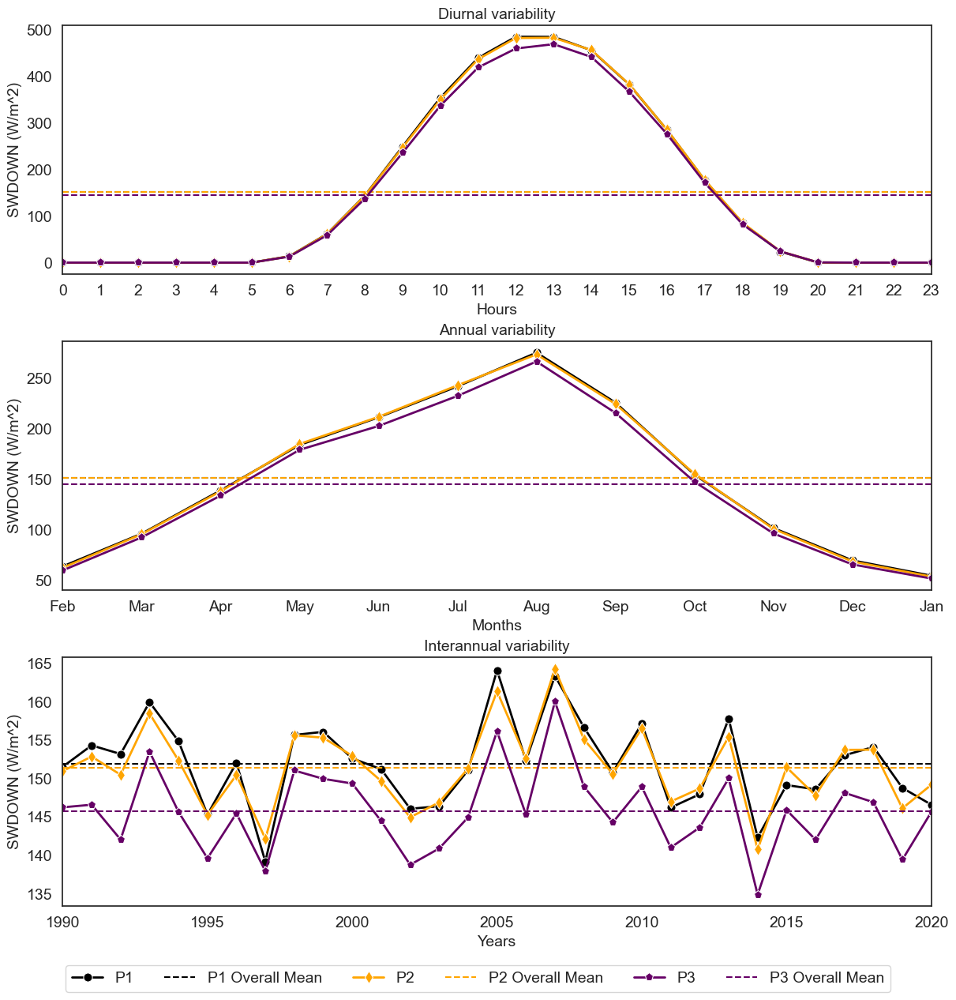

In [23]:
fig = plt.figure(figsize=(12, 12), constrained_layout=True)
gs = fig.add_gridspec(3,1)
sns.set_theme(style="white")

hourly_df = pd.DataFrame()
for i,key in enumerate(sample_points.keys()):
    ds = read_pointwise_timeseries(swdown,sample_points[key][0],sample_points[key][1])

    pointwise_df = pd.DataFrame()

    # Loop through hours
    for hour in range(0,24):
        # Extract data for the current year
        data = ds.sel(Time=ds.Time.dt.hour == hour).mean().values
        # Create a new DataFrame with the year as a column
        #df = pd.DataFrame({'Hour': [hour], key: data})
        df = pd.DataFrame({key: data}, index=pd.Index([hour], name='Hour'))
        # Append the data to the main DataFrame
        pointwise_df = pd.concat([pointwise_df, df])
    hourly_df = pd.concat([hourly_df, pointwise_df],axis=1)

variability_plotter(gs[0,0],hourly_df,f'Diurnal variability','Hours','SWDOWN (W/m^2)', key,colors[i],'o',xlabel_ticks=hours)


monthly_df = pd.DataFrame()
for i,key in enumerate(sample_points.keys()):
    ds = read_pointwise_timeseries(swdown,sample_points[key][0],sample_points[key][1])

    pointwise_df = pd.DataFrame()

    # Loop through hours
    for month in [12, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]:
        # Extract data for the current year
        data = ds.sel(Time=ds.Time.dt.month == month).mean().values
        # Create a new DataFrame with the year as a column
        #df = pd.DataFrame({'Hour': [hour], key: data})
        df = pd.DataFrame({key: data}, index=pd.Index([month], name='month'))
        # Append the data to the main DataFrame
        pointwise_df = pd.concat([pointwise_df, df])
    monthly_df = pd.concat([monthly_df, pointwise_df],axis=1)

variability_plotter(gs[1,0],monthly_df,f'Annual variability','Months','SWDOWN (W/m^2)', key,colors[i],'o',xlabel_ticks=months)

yearly_df = pd.DataFrame()
for i,key in enumerate(sample_points.keys()):
    ds = read_pointwise_timeseries(swdown,sample_points[key][0],sample_points[key][1])

    pointwise_df = pd.DataFrame()

    # Loop through hours
    for year in list(range(1990, 2021)):
        # Extract data for the current year
        data = ds.sel(Time=ds.Time.dt.year == year).mean().values
        # Create a new DataFrame with the year as a column
        #df = pd.DataFrame({'Hour': [hour], key: data})
        df = pd.DataFrame({key: data}, index=pd.Index([year], name='year'))
        # Append the data to the main DataFrame
        pointwise_df = pd.concat([pointwise_df, df])
    yearly_df = pd.concat([yearly_df, pointwise_df],axis=1)

axs = variability_plotter(gs[2,0],yearly_df,f'Interannual variability','Years','SWDOWN (W/m^2)', key,colors[i],'o')

# Extract legend from one of the subplots
handles, labels = axs.get_legend_handles_labels()
# Create a common legend below the figures
fig.legend(handles, labels, loc='lower center', ncol=len(labels), bbox_to_anchor=(0.5, -0.05),fontsize=14)

plt.savefig(f'{case}_optimization_runs_solar_resources_variabilities.png',dpi=300,bbox_inches='tight',pad_inches=0)

# Netherlands

In [12]:
case = 'Netherlands_coast'

# create empty keys as case, in the dictonaries
optimization_data[case] = {}
validation_data[case] = {}

sample_points = {
    "P1": (51.3, 2.3),
    "P2": (51.6, 2.6), #P2 is POR2 in tslist
    "P3": (51.75, 3.25),
}

obs_points = {
    "LOT1": (51.7068, 3.034618),
    "Wandelaar": (51.392,3.051),
    "Westhinder": (51.381,2.436),
}

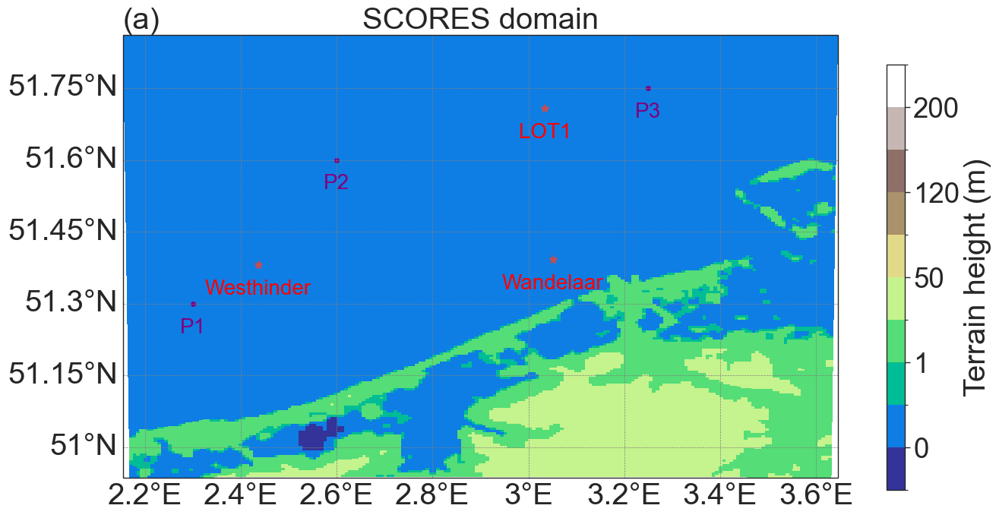

In [25]:
# Load data for the first file
SCORES_domain = f'{root_dir}/New_runs/{case}/Postprocessed/geo_em.d01.nc'
SCORES_ds = xr.open_dataset(SCORES_domain)
plot_data1 = SCORES_ds.HGT_M[0, ...].assign_coords(latitude=SCORES_ds.XLAT_M[0,...],longitude=SCORES_ds.XLONG_M[0,...])

# Define the custom color levels and colormap
clevels = [-5, 0, 0.5, 1, 10, 50, 80, 120, 160, 200, 240]
cmap = plt.get_cmap("terrain")

# Create a figure with two subplots
sns.set_theme(style="white")
sns.set_context("paper",font_scale=3)
fig, axes = plt.subplots(1, 1, figsize=(12, 8),width_ratios=[1], subplot_kw={'projection':ccrs.PlateCarree()})
#plt.rc('font', size=10)    # fontsize of the all text
#plt.rc('ytick', labelsize=10)    # fontsize of the tick labels
#plt.rc('xtick', labelsize=10)

# Plot the data for the first file in the first subplot
im1 = plot_data1.plot(x='longitude',y='latitude',levels=clevels, cmap=cmap, ax=axes,add_colorbar=False)
#cbar = plt.colorbar(im1, ax=axes[0], shrink=0.5)
#cbar.set_label('Terrain height (m)')
gl = axes.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linestyle='--', linewidth=0.5, color='gray')
gl.top_labels = False
gl.right_labels = False
axes.set_title('SCORES domain',loc='center')
axes.set_title('(a)',loc='left')

# Add labels and markers of sample points
for label, (lat, lon) in sample_points.items():
    axes.text(lon, lat - 0.05, label, color='purple', fontsize=20, ha='center', va='center')
    axes.plot(lon, lat, '.', markersize=8,color='purple')

# Add labels and markers of observationsl sites

for label, (lat, lon) in obs_points.items():
    ax = axes
    ax.text(lon, lat - 0.05, label, color='red', fontsize=20, ha='center', va='center')
    ax.plot(lon, lat, 'r*', markersize=8)

# Add colorbar spanning both subplots
cax = plt.axes([1, 0.12, 0.02, 0.7])  # Adjust the position and size of the colorbar
cbar = plt.colorbar(im1, cax=cax)
cbar.set_label('Terrain height (m)')

plt.tight_layout(rect=(0, 0, 1.0, 1))   
plt.subplots_adjust(hspace=-0.5)

plt.savefig(f'{case}_Domain_configuration.png',dpi=300,bbox_inches='tight',pad_inches=0)

## Validation with observations

### LiDAR LOT1

In [154]:
## === Checking maximum number of samples exist in a year ===

# Read the original DataFrame
obs_df = pd.read_csv(f'{root_dir}/eval/Observations/LiDAR/Netherlands/LOT1_WindResourceSpeedDirectionTIStat.csv',header=0,index_col=0)

# Convert the index to datetime
obs_df.index = pd.to_datetime(obs_df.index, format='%Y-%m-%d %H')

# Resample to hourly frequency and clean the DataFrame
obs_df = obs_df.resample('1H').asfreq()

# Set the initial start date and end date
start = pd.to_datetime('2015-07-01 00:00:00', utc=True)
end = start + pd.DateOffset(years=1)
# Loop through each one-year period
while end <= pd.to_datetime('2017-02-01', utc=True):
    # Extract data for the current one-year period
    yearly_data = obs_df.loc[start:end].copy()
    yearly_data.replace(-9999.9, np.nan, inplace=True)
    yearly_data.dropna(inplace=True)
    
    # Check the number of samples in the current one-year period
    num_samples = len(yearly_data)
    
    print(start,end,num_samples,'supposed times: ',len(pd.date_range(start=start, end=end, freq='1H')))
    
    # Move to the next one-year period
    start += pd.DateOffset(months=1)
    end += pd.DateOffset(months=1)

2015-07-01 00:00:00+00:00 2016-07-01 00:00:00+00:00 5533 supposed times:  8785
2015-08-01 00:00:00+00:00 2016-08-01 00:00:00+00:00 5455 supposed times:  8785
2015-09-01 00:00:00+00:00 2016-09-01 00:00:00+00:00 5362 supposed times:  8785
2015-10-01 00:00:00+00:00 2016-10-01 00:00:00+00:00 5778 supposed times:  8785
2015-11-01 00:00:00+00:00 2016-11-01 00:00:00+00:00 6454 supposed times:  8785
2015-12-01 00:00:00+00:00 2016-12-01 00:00:00+00:00 6717 supposed times:  8785
2016-01-01 00:00:00+00:00 2017-01-01 00:00:00+00:00 7025 supposed times:  8785
2016-02-01 00:00:00+00:00 2017-02-01 00:00:00+00:00 7706 supposed times:  8785


In [13]:
#-- Duration of the observations and corresponding simulations --#
start='2016-02-01 00:00:00'
end='2017-02-01 00:00:00'
times = pd.date_range(start=start, end=end, freq='1H')
print('A total of ',times.shape[0],'times should exist during ',times[0],' and ',times[-1])

A total of  8785 times should exist during  2016-02-01 00:00:00  and  2017-02-01 00:00:00


In [52]:
# -- Observations --#
obs_df = pd.read_csv(f'{root_dir}/eval/Observations/LiDAR/Netherlands/LOT1_WindResourceSpeedDirectionTIStat.csv',header=0,index_col=0)
obs_df.index = pd.to_datetime(obs_df.index, format='%Y-%m-%d %H')
obs_df = obs_df.resample('1H').asfreq()
obs_df.replace(-9999.9, np.nan, inplace=True)
obs_df.dropna(inplace=True)
obs_df = obs_df[start:end].iloc[:,:-1]
obs_df = obs_df[['WindDir100m deg','WindSpeed100mh m/s']]

#Add top column name as obs
head_column = 'Obs'
obs_df.columns = pd.MultiIndex.from_product([[head_column], obs_df.columns])

The LOT1 has wind speed at different vertical levels, but no temperature. Thus, we sticked to used the observations at the remaining locations

### Westhinder

In [14]:
key = 'Westhinder'
# === Simulations from wrfout ===
run = 'New_runs'
chunks={"Time": -1,"south_north": 8,"west_east": 8}
# read XLAND and get the lat lon data from this
XLAND = xr.open_dataset(f'{root_dir}/{run}/{case}/Postprocessed/variablewise_files/XLAND.nc')
XLAT = XLAND.XLAT
XLONG = XLAND.XLONG

ws = xr.open_dataset(f'{root_dir}/{run}/{case}/Postprocessed/variablewise_files/ws_10.nc')['ws']
ws_df = read_pointwise_timeseries(ws,obs_points[key][0],obs_points[key][1]).drop_vars(['XLONG','XLAT']).to_dataframe(name='ws')

t2 = xr.open_dataset(f'{root_dir}/{run}/{case}/Postprocessed/variablewise_files/T2.nc',chunks=chunks)
t2 = t2.assign_coords(XLAT=XLAT,XLONG=XLONG)
t2_df = read_pointwise_timeseries(t2,obs_points[key][0],obs_points[key][1],var_name='T2').drop_vars(['XLONG','XLAT']).to_dataframe(name='t2')

sim_df = pd.concat([ws_df,t2_df],axis=1)
sim_df = sim_df.loc[start:end]
sim_df.index = sim_df.index.tz_localize('UTC')
sim_df.columns = pd.MultiIndex.from_product([[run], sim_df.columns])

# === Observations ===#
temp_df = pd.read_csv(f'{root_dir}/eval/Observations/Meetnet_Vlaamse_Banken/{key}/MP7.TLU_001_MP7TE1TLU010.txt',header=0,index_col=0,sep='\t')
temp_df.index = pd.to_datetime(temp_df.index, format='%Y-%m-%d %H')
wspd_df = pd.read_csv(f'{root_dir}/eval/Observations/Meetnet_Vlaamse_Banken/{key}/MP7.WVC_001_MP7WI0WVC010.txt',header=0,index_col=0,sep='\t')
wspd_df.index = pd.to_datetime(wspd_df.index, format='%Y-%m-%d %H')
wdir_df = pd.read_csv(f'{root_dir}/eval/Observations/Meetnet_Vlaamse_Banken/{key}/MP7.WRS_001_MP7WI0WRS010.txt',header=0,index_col=0,sep='\t')
wdir_df.index = pd.to_datetime(wdir_df.index, format='%Y-%m-%d %H')
obs_df = pd.concat([temp_df,wspd_df,wdir_df],axis=1)
obs_df = obs_df.resample('1H').asfreq()
obs_df = obs_df[start:end]
#obs_df.index = obs_df.index.tz_localize('UTC')
obs_df.dropna(inplace=True)
#Add top column name as obs
head_column = 'Obs'
obs_df.columns = pd.MultiIndex.from_product([[head_column], obs_df.columns])

#--- Reanalysis from open meteo---#
ERA5 = pd.read_csv(f'{root_dir}/eval/Reanalysis/open-meteo/{key}_ERA5.csv',header=2,index_col=0)
ERA5.index = pd.to_datetime(ERA5.index)
ERA5.index = ERA5.index.tz_localize('UTC')
ERA5.columns = pd.MultiIndex.from_product([['ERA5'], ERA5.columns])

# Now, combine the datasets side by side
merged_df = sim_df.merge(obs_df, left_index=True, right_index=True, how='inner')
merged_df = merged_df.merge(ERA5, left_index=True, right_index=True, how='inner')

# wind speed dataframes
ws_dfs = [merged_df['Obs']['Average wind speed (at 10 m height) (m/s)'],
          merged_df['ERA5']['wind_speed_10m (m/s)'],
         merged_df[run]['ws']]

# 2m temperature dataframes
temp_dfs = [merged_df['Obs']['Air temperature (°C)'],
           merged_df['ERA5']['temperature_2m (°C)'],
           merged_df[run]['t2']] #convert into Kelvin

# --- Storing the dataframes into the validation list here ---#
cite_data = {'ws_dfs': ws_dfs, 'temp_dfs': temp_dfs}

Time elapsed for nearest point identification is 0.00465703010559082s
{'south_north': 95, 'west_east': 36}
Time elapsed for nearest point identification is 0.001306772232055664s
{'south_north': 95, 'west_east': 36}


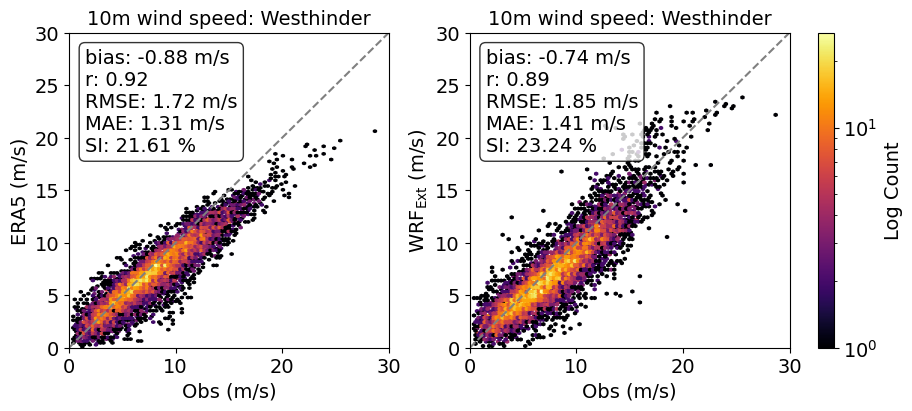

In [15]:
fig = plt.figure(figsize=(9, 4), constrained_layout=True)
gs = fig.add_gridspec(1,2)
limits = [0,30]
hexbin_plotter(gs[0,0],cite_data['ws_dfs'][0],cite_data['ws_dfs'][1],f'10m wind speed: {key}',text_arg=True,units='m/s',xlabel='Obs (m/s)',ylabel='ERA5 (m/s)',limits=limits)
ax = hexbin_plotter(gs[0,1],cite_data['ws_dfs'][0],cite_data['ws_dfs'][2],f'10m wind speed: {key}',text_arg=True,units='m/s',
                    xlabel='Obs (m/s)',ylabel=r'WRF$_{\mathrm{Ext}}$ (m/s)',colorbar=True,limits=limits)
plt.savefig(f'{case}_{run}_{key}_wind_hexbins.png',dpi=300,bbox_inches='tight',pad_inches=0)

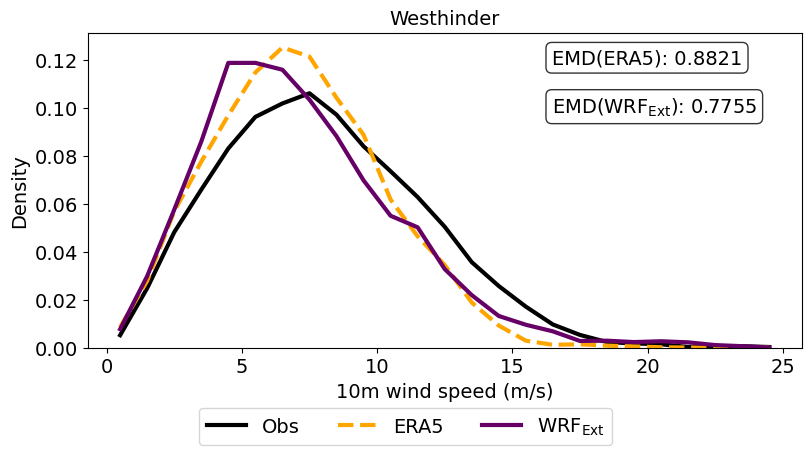

In [64]:
bins=np.arange(0, 25.1, 1)
labels = ['Obs', 'ERA5', r'WRF$_{\mathrm{Ext}}$']

fig = plt.figure(figsize=(8, 4), constrained_layout=True)
gs = fig.add_gridspec(1,1)
ax = hist_pdf_plotter(gs[0,0],cite_data['ws_dfs'],bins,line_styles,colors,labels,xlabel='10m wind speed (m/s)',ylabel = 'Density',title=key,text_arg=True,text_alignment='right')

# Add a legend at the bottom
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', bbox_to_anchor=(0.5, -0.1), ncol=len(labels), borderaxespad=0.,fontsize=14)

plt.savefig(f'{case}_{run}_{key}_wind_hist_pdf.png',dpi=300,bbox_inches='tight',pad_inches=0)

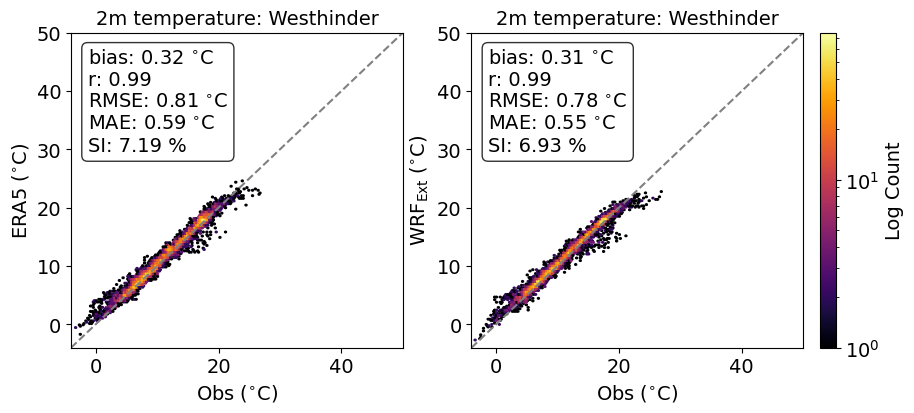

In [65]:
fig = plt.figure(figsize=(9, 4), constrained_layout=True)
gs = fig.add_gridspec(1,2)
limits = [-4,50]
hexbin_plotter(gs[0,0],cite_data['temp_dfs'][0],cite_data['temp_dfs'][1],f'2m temperature: {key}',text_arg=True,units=r'$^{\circ}$C',
               xlabel=r'Obs ($^{\circ}$C)',ylabel='ERA5 ($^{\circ}$C)',limits=limits)
ax = hexbin_plotter(gs[0,1],cite_data['temp_dfs'][0],cite_data['temp_dfs'][2],f'2m temperature: {key}',text_arg=True,units=r'$^{\circ}$C',
                    xlabel='Obs ($^{\circ}$C)',ylabel=r'WRF$_{\mathrm{Ext}}$ ($^{\circ}$C)',colorbar=True,limits=limits)
plt.savefig(f'{case}_{run}_{key}_temperature_hexbins.png',dpi=300,bbox_inches='tight',pad_inches=0)

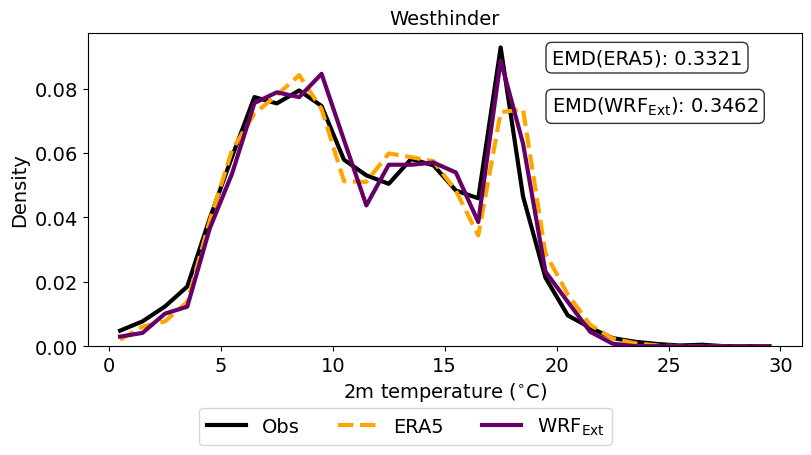

In [66]:
bins=np.arange(0, 30.1, 1)
labels = ['Obs', 'ERA5', r'WRF$_{\mathrm{Ext}}$']

fig = plt.figure(figsize=(8, 4), constrained_layout=True)
gs = fig.add_gridspec(1,1)
ax = hist_pdf_plotter(gs[0,0],cite_data['temp_dfs'],bins,line_styles,colors,labels,xlabel=r'2m temperature ($^{\circ}$C)',ylabel = 'Density',title=key,text_arg=True,text_alignment='right')

# Add a legend at the bottom
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', bbox_to_anchor=(0.5, -0.1), ncol=len(labels), borderaxespad=0.,fontsize=14)

plt.savefig(f'{case}_{run}_{key}_temperature_hist_pdf.png',dpi=300,bbox_inches='tight',pad_inches=0)

### Wandelaar

In [16]:
key = 'Wandelaar'

# === Simulations from wrfout ===
run = 'New_runs'
chunks={"Time": -1,"south_north": 8,"west_east": 8}
# read XLAND and get the lat lon data from this
XLAND = xr.open_dataset(f'{root_dir}/{run}/{case}/Postprocessed/variablewise_files/XLAND.nc')
XLAT = XLAND.XLAT
XLONG = XLAND.XLONG

ws = xr.open_dataset(f'{root_dir}/{run}/{case}/Postprocessed/variablewise_files/ws_10.nc')['ws']
ws_df = read_pointwise_timeseries(ws,obs_points[key][0],obs_points[key][1]).drop_vars(['XLONG','XLAT']).to_dataframe(name='ws')

t2 = xr.open_dataset(f'{root_dir}/{run}/{case}/Postprocessed/variablewise_files/T2.nc',chunks=chunks)
t2 = t2.assign_coords(XLAT=XLAT,XLONG=XLONG)
t2_df = read_pointwise_timeseries(t2,obs_points[key][0],obs_points[key][1],var_name='T2').drop_vars(['XLONG','XLAT']).to_dataframe(name='t2')

sim_df = pd.concat([ws_df,t2_df],axis=1)
sim_df = sim_df.loc[start:end]
sim_df.index = sim_df.index.tz_localize('UTC')
sim_df.columns = pd.MultiIndex.from_product([[run], sim_df.columns])

# === Observations ===#
temp_df = pd.read_csv(f'{root_dir}/eval/Observations/Meetnet_Vlaamse_Banken/{key}/MP0.TLU_001_MP0TE1TLU010.txt',header=0,index_col=0,sep='\t')
temp_df.index = pd.to_datetime(temp_df.index, format='%Y-%m-%d %H')

wdir_df1 = pd.read_csv(f'{root_dir}/eval/Observations/Meetnet_Vlaamse_Banken/{key}/MP0.WRS_001_MP0WI2WRS010.txt',header=0,index_col=0,sep='\t')
wdir_df2 = pd.read_csv(f'{root_dir}/eval/Observations/Meetnet_Vlaamse_Banken/{key}/MP0.WRS_002_MP0WI1WRS010.txt',header=0,index_col=0,sep='\t')
wdir_df = pd.concat([wdir_df1,wdir_df2],axis=0)
wdir_df.index = pd.to_datetime(wdir_df.index, format='%Y-%m-%d %H')

wspd_df1 = pd.read_csv(f'{root_dir}/eval/Observations/Meetnet_Vlaamse_Banken/{key}/MP0.WVC_001_MP0WI2WVC010.txt',header=0,index_col=0,sep='\t')
wspd_df2 = pd.read_csv(f'{root_dir}/eval/Observations/Meetnet_Vlaamse_Banken/{key}/MP0.WVC_002_MP0WI1WVC010.txt',header=0,index_col=0,sep='\t')
wspd_df = pd.concat([wspd_df1,wspd_df2],axis=0)
wspd_df.index = pd.to_datetime(wspd_df.index, format='%Y-%m-%d %H')

obs_df = pd.concat([temp_df,wspd_df,wdir_df],axis=1)
obs_df = obs_df.resample('1H').asfreq()
obs_df = obs_df[start:end]
#obs_df.index = obs_df.index.tz_localize('UTC')
obs_df.dropna(inplace=True)
#Add top column name as obs
head_column = 'Obs'
obs_df.columns = pd.MultiIndex.from_product([[head_column], obs_df.columns])

#--- Reanalysis from open meteo---#
ERA5 = pd.read_csv(f'{root_dir}/eval/Reanalysis/open-meteo/{key}_ERA5.csv',header=2,index_col=0)
ERA5.index = pd.to_datetime(ERA5.index)
ERA5.index = ERA5.index.tz_localize('UTC')
ERA5.columns = pd.MultiIndex.from_product([['ERA5'], ERA5.columns])

# Now, combine the datasets side by side
merged_df = sim_df.merge(obs_df, left_index=True, right_index=True, how='inner')
merged_df = merged_df.merge(ERA5, left_index=True, right_index=True, how='inner')

# wind speed dataframes
ws_dfs = [merged_df['Obs']['Average wind speed (at 10 m height) (m/s)'],
          merged_df['ERA5']['wind_speed_10m (m/s)'],
         merged_df[run]['ws']]

# 2m temperature dataframes
temp_dfs = [merged_df['Obs']['Air temperature (°C)'],
           merged_df['ERA5']['temperature_2m (°C)'],
           merged_df[run]['t2']] #convert into Kelvin

# --- Storing the dataframes into the validation list here ---#
cite_data = {'ws_dfs': ws_dfs, 'temp_dfs': temp_dfs}

Time elapsed for nearest point identification is 0.002705812454223633s
{'south_north': 97, 'west_east': 119}
Time elapsed for nearest point identification is 0.0013399124145507812s
{'south_north': 97, 'west_east': 119}


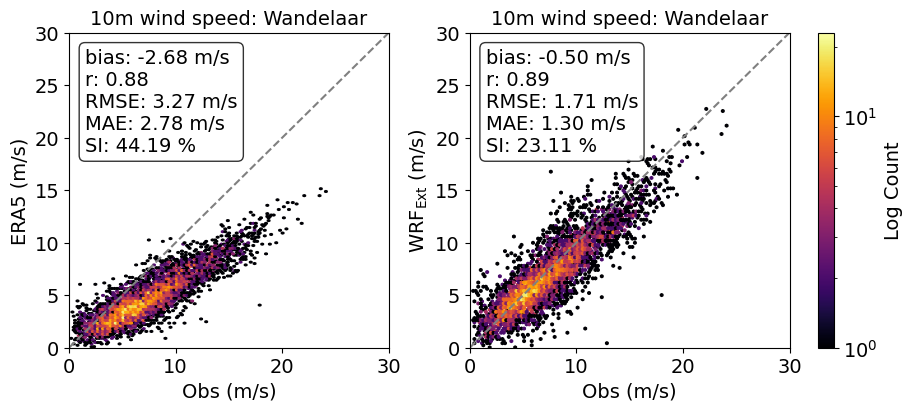

In [17]:
fig = plt.figure(figsize=(9, 4), constrained_layout=True)
gs = fig.add_gridspec(1,2)
limits = [0,30]
hexbin_plotter(gs[0,0],cite_data['ws_dfs'][0],cite_data['ws_dfs'][1],f'10m wind speed: {key}',text_arg=True,units='m/s',xlabel='Obs (m/s)',ylabel='ERA5 (m/s)',limits=limits)
ax = hexbin_plotter(gs[0,1],cite_data['ws_dfs'][0],cite_data['ws_dfs'][2],f'10m wind speed: {key}',text_arg=True,units='m/s',
                    xlabel='Obs (m/s)',ylabel=r'WRF$_{\mathrm{Ext}}$ (m/s)',colorbar=True,limits=limits)
plt.savefig(f'{case}_{run}_{key}_wind_hexbins.png',dpi=300,bbox_inches='tight',pad_inches=0)

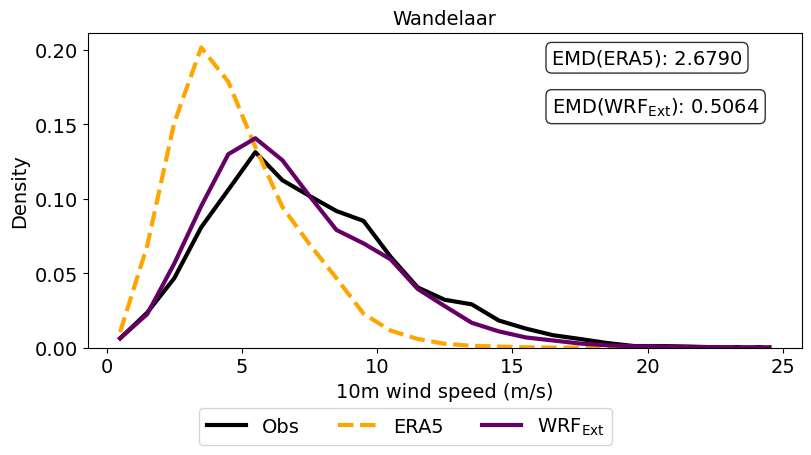

In [69]:
bins=np.arange(0, 25.1, 1)
labels = ['Obs', 'ERA5', r'WRF$_{\mathrm{Ext}}$']

fig = plt.figure(figsize=(8, 4), constrained_layout=True)
gs = fig.add_gridspec(1,1)
ax = hist_pdf_plotter(gs[0,0],cite_data['ws_dfs'],bins,line_styles,colors,labels,xlabel='10m wind speed (m/s)',ylabel = 'Density',title=key,text_arg=True,text_alignment='right')

# Add a legend at the bottom
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', bbox_to_anchor=(0.5, -0.1), ncol=len(labels), borderaxespad=0.,fontsize=14)

plt.savefig(f'{case}_{run}_{key}_wind_hist_pdf.png',dpi=300,bbox_inches='tight',pad_inches=0)

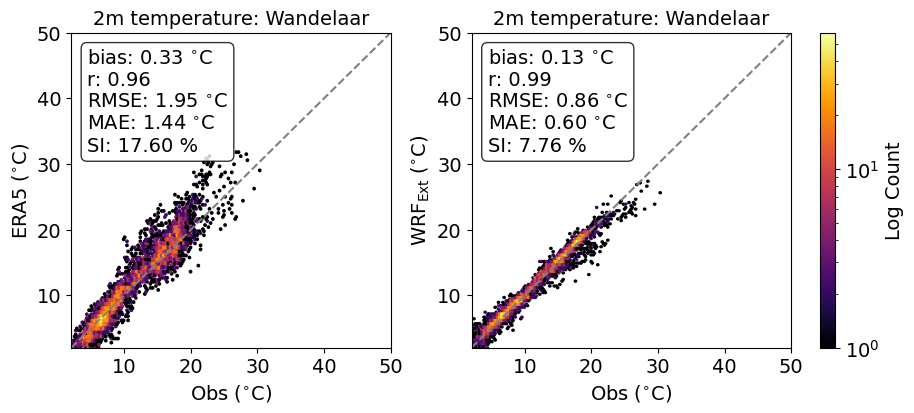

In [70]:
fig = plt.figure(figsize=(9, 4), constrained_layout=True)
gs = fig.add_gridspec(1,2)
limits = [2,50]
hexbin_plotter(gs[0,0],cite_data['temp_dfs'][0],cite_data['temp_dfs'][1],f'2m temperature: {key}',text_arg=True,units=r'$^{\circ}$C',
               xlabel=r'Obs ($^{\circ}$C)',ylabel='ERA5 ($^{\circ}$C)',limits=limits)
ax = hexbin_plotter(gs[0,1],cite_data['temp_dfs'][0],cite_data['temp_dfs'][2],f'2m temperature: {key}',text_arg=True,units=r'$^{\circ}$C',
                    xlabel='Obs ($^{\circ}$C)',ylabel=r'WRF$_{\mathrm{Ext}}$ ($^{\circ}$C)',colorbar=True,limits=limits)
plt.savefig(f'{case}_{run}_{key}_temperature_hexbins.png',dpi=300,bbox_inches='tight',pad_inches=0)

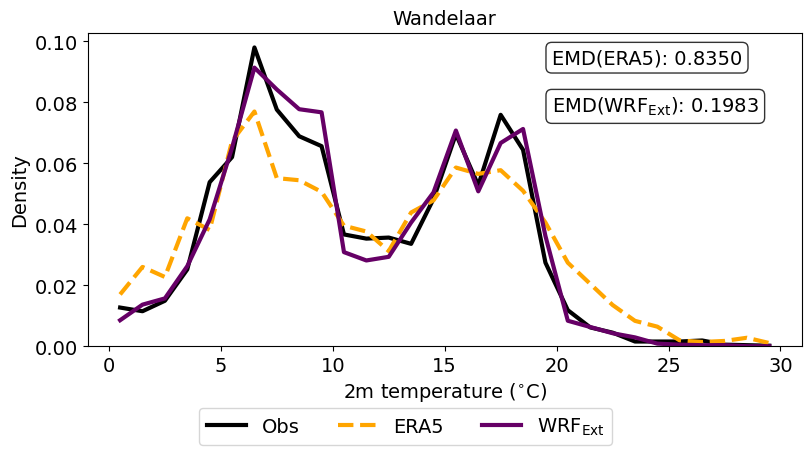

In [71]:
bins=np.arange(0, 30.1, 1)
labels = ['Obs', 'ERA5', r'WRF$_{\mathrm{Ext}}$']

fig = plt.figure(figsize=(8, 4), constrained_layout=True)
gs = fig.add_gridspec(1,1)
ax = hist_pdf_plotter(gs[0,0],cite_data['temp_dfs'],bins,line_styles,colors,labels,xlabel=r'2m temperature ($^{\circ}$C)',ylabel = 'Density',title=key,text_arg=True,text_alignment='right')

# Add a legend at the bottom
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', bbox_to_anchor=(0.5, -0.1), ncol=len(labels), borderaxespad=0.,fontsize=14)

plt.savefig(f'{case}_{run}_{key}_temperature_hist_pdf.png',dpi=300,bbox_inches='tight',pad_inches=0)

## Wind resources

## 120 m

In [15]:
%%time
case = 'Netherlands_coast'
run='New_runs'
run_dir=f'{root_dir}/{run}/{case}/Postprocessed/variablewise_files'
chunks={"Time": -1,"south_north": 24,"west_east": 24}

level = 120
turbine_type = '8MW'
ws = xr.open_dataset(f'{run_dir}/ws_{level}.nc',chunks=chunks)['ws']
wpd = WPD(ws).compute()
tp = xr.open_dataset(f'{run_dir}/{turbine_type}/tp_{level}.nc',chunks=chunks)['power']

CPU times: user 1min 26s, sys: 6min 31s, total: 7min 58s
Wall time: 8min 14s


### Mean wind resources

In [16]:
%%time
mean_ws = ws.mean(dim='Time').compute()
mean_wpd = wpd.mean(dim='Time').compute()
mean_AEP = tp.isel(Time=slice(None,-1)).resample(Time='Y').sum().mean(dim='Time').compute()
mean_CF = mean_AEP/(8766*8000)

2024-02-16 21:24:06,899 - distributed.worker_memory - WARNING - Unmanaged memory use is high. This may indicate a memory leak or the memory may not be released to the OS; see https://distributed.dask.org/en/latest/worker-memory.html#memory-not-released-back-to-the-os for more information. -- Unmanaged memory: 5.02 GiB -- Worker memory limit: 7.81 GiB
2024-02-16 21:24:14,677 - distributed.worker_memory - WARNING - Unmanaged memory use is high. This may indicate a memory leak or the memory may not be released to the OS; see https://distributed.dask.org/en/latest/worker-memory.html#memory-not-released-back-to-the-os for more information. -- Unmanaged memory: 5.19 GiB -- Worker memory limit: 7.81 GiB
2024-02-16 21:24:17,212 - distributed.worker_memory - WARNING - Unmanaged memory use is high. This may indicate a memory leak or the memory may not be released to the OS; see https://distributed.dask.org/en/latest/worker-memory.html#memory-not-released-back-to-the-os for more information. -- U

CPU times: user 4min 7s, sys: 2min 16s, total: 6min 24s
Wall time: 7min 56s


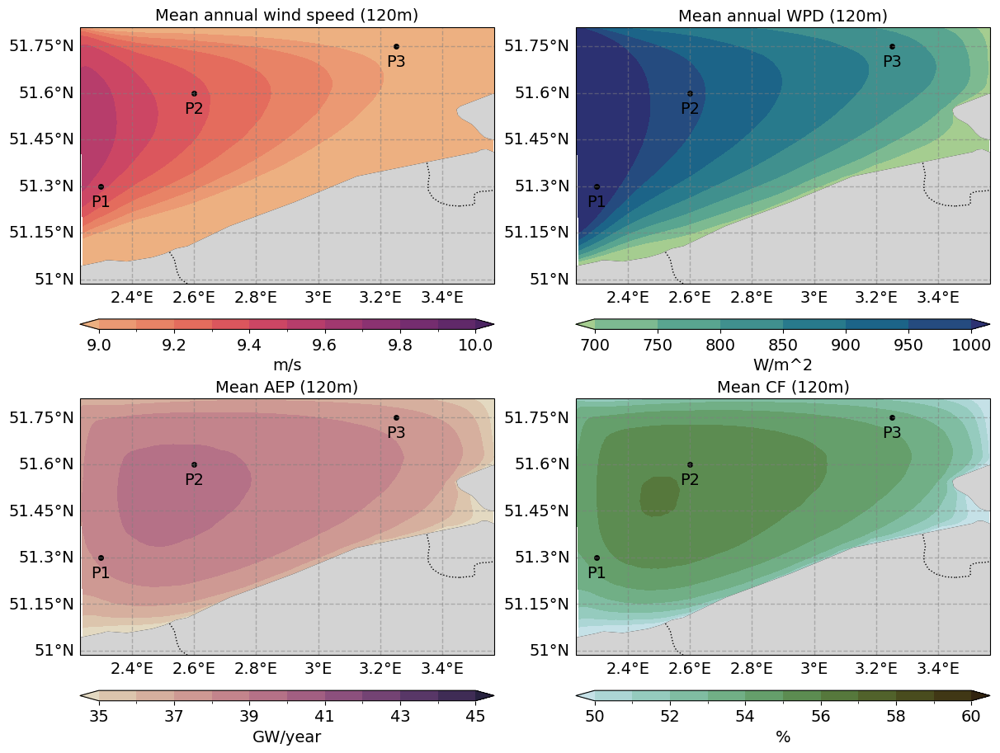

In [22]:
fig = plt.figure(figsize=(12, 9), constrained_layout=True)
gs = fig.add_gridspec(2,2)
map_plotter(gs[0,0],mean_ws[10:-10,10:-10],'XLONG','XLAT',np.arange(9,10.1,0.1),'flare',f'Mean annual wind speed ({level}m)',1,'m/s','horizontal',sample_points = sample_points)
map_plotter(gs[0,1],mean_wpd[10:-10,10:-10],'XLONG','XLAT',np.arange(700,1000.1,50),'crest',f'Mean annual WPD ({level}m)',1,'W/m^2','horizontal',sample_points = sample_points)
map_plotter(gs[1,0],mean_AEP[10:-10,10:-10]/1e6,'XLONG','XLAT',np.arange(35,45.1,1),"ch:s=-.2,r=.6",f'Mean AEP ({level}m)',1,'GW/year','horizontal',sample_points = sample_points)
map_plotter(gs[1,1],mean_CF[10:-10,10:-10]*1e2,'XLONG','XLAT',np.arange(50,60.1,1),"ch:s=10,r=.6",f'Mean CF ({level}m)',1,'%','horizontal',sample_points = sample_points)
plt.savefig(f'{case}_optimization_runs_mean_wind_resources_{level}m.png',dpi=300,bbox_inches='tight',pad_inches=0)

### Resource variabilities

Time elapsed for nearest point identification is 0.04633474349975586s
{'south_north': 78, 'west_east': 18}
Time elapsed for nearest point identification is 0.002065420150756836s
{'south_north': 142, 'west_east': 59}
Time elapsed for nearest point identification is 0.0017247200012207031s
{'south_north': 175, 'west_east': 146}
Time elapsed for nearest point identification is 0.001817941665649414s
{'south_north': 78, 'west_east': 18}
Time elapsed for nearest point identification is 0.0016028881072998047s
{'south_north': 142, 'west_east': 59}
Time elapsed for nearest point identification is 0.002086162567138672s
{'south_north': 175, 'west_east': 146}
Time elapsed for nearest point identification is 0.001983165740966797s
{'south_north': 78, 'west_east': 18}
Time elapsed for nearest point identification is 0.0017218589782714844s
{'south_north': 142, 'west_east': 59}
Time elapsed for nearest point identification is 0.001767873764038086s
{'south_north': 175, 'west_east': 146}


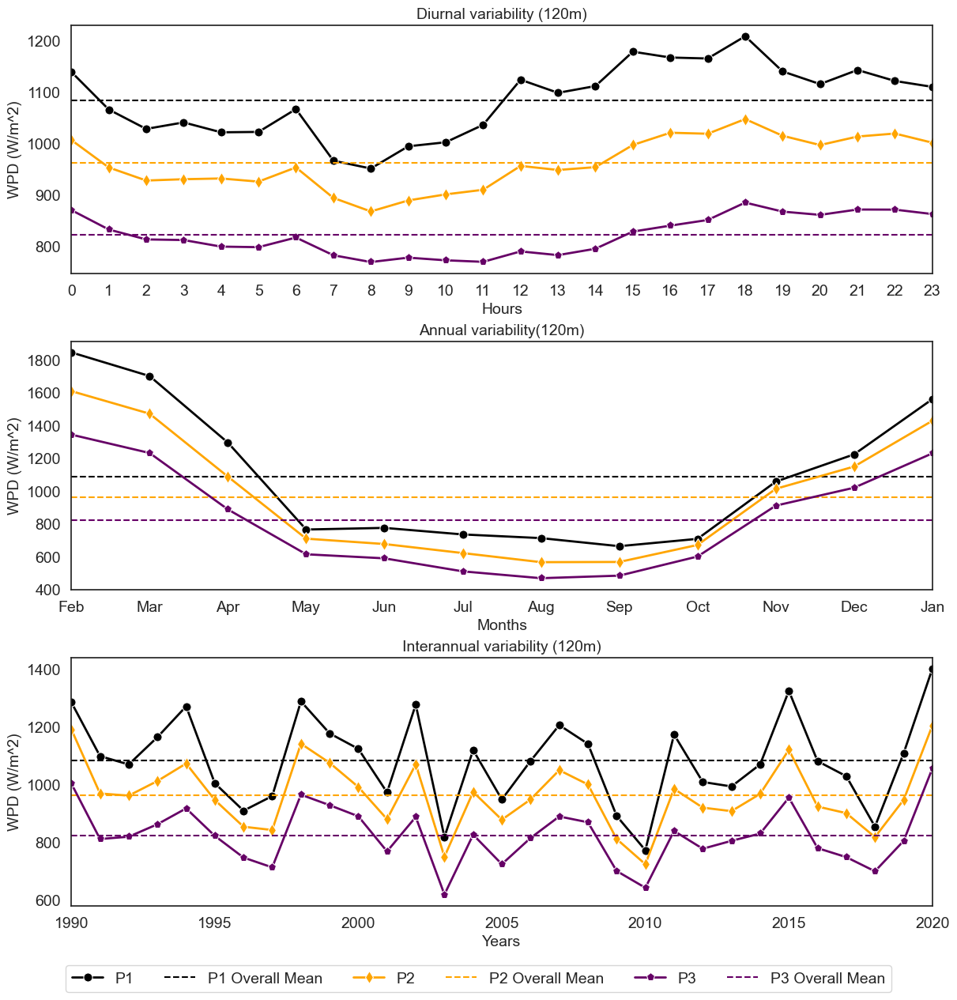

In [42]:
fig = plt.figure(figsize=(12, 12), constrained_layout=True)
gs = fig.add_gridspec(3,1)
sns.set_theme(style="white")

hourly_df = pd.DataFrame()
for i,key in enumerate(sample_points.keys()):
    ds = read_pointwise_timeseries(wpd,sample_points[key][0],sample_points[key][1])

    pointwise_df = pd.DataFrame()

    # Loop through hours
    for hour in range(0,24):
        # Extract data for the current year
        data = ds.sel(Time=ds.Time.dt.hour == hour).mean().values
        # Create a new DataFrame with the year as a column
        #df = pd.DataFrame({'Hour': [hour], key: data})
        df = pd.DataFrame({key: data}, index=pd.Index([hour], name='Hour'))
        # Append the data to the main DataFrame
        pointwise_df = pd.concat([pointwise_df, df])
    hourly_df = pd.concat([hourly_df, pointwise_df],axis=1)

variability_plotter(gs[0,0],hourly_df,f'Diurnal variability ({level}m)','Hours','WPD (W/m^2)', key,colors[i],'o',xlabel_ticks=hours)


monthly_df = pd.DataFrame()
for i,key in enumerate(sample_points.keys()):
    ds = read_pointwise_timeseries(wpd,sample_points[key][0],sample_points[key][1])

    pointwise_df = pd.DataFrame()

    # Loop through hours
    for month in [12, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]:
        # Extract data for the current year
        data = ds.sel(Time=ds.Time.dt.month == month).mean().values
        # Create a new DataFrame with the year as a column
        #df = pd.DataFrame({'Hour': [hour], key: data})
        df = pd.DataFrame({key: data}, index=pd.Index([month], name='month'))
        # Append the data to the main DataFrame
        pointwise_df = pd.concat([pointwise_df, df])
    monthly_df = pd.concat([monthly_df, pointwise_df],axis=1)

variability_plotter(gs[1,0],monthly_df,f'Annual variability({level}m)','Months','WPD (W/m^2)', key,colors[i],'o',xlabel_ticks=months)

yearly_df = pd.DataFrame()
for i,key in enumerate(sample_points.keys()):
    ds = read_pointwise_timeseries(wpd,sample_points[key][0],sample_points[key][1])

    pointwise_df = pd.DataFrame()

    # Loop through hours
    for year in list(range(1990, 2021)):
        # Extract data for the current year
        data = ds.sel(Time=ds.Time.dt.year == year).mean().values
        # Create a new DataFrame with the year as a column
        #df = pd.DataFrame({'Hour': [hour], key: data})
        df = pd.DataFrame({key: data}, index=pd.Index([year], name='year'))
        # Append the data to the main DataFrame
        pointwise_df = pd.concat([pointwise_df, df])
    yearly_df = pd.concat([yearly_df, pointwise_df],axis=1)

axs = variability_plotter(gs[2,0],yearly_df,f'Interannual variability ({level}m)','Years','WPD (W/m^2)', key,colors[i],'o')

# Extract legend from one of the subplots
handles, labels = axs.get_legend_handles_labels()
# Create a common legend below the figures
fig.legend(handles, labels, loc='lower center', ncol=len(labels), bbox_to_anchor=(0.5, -0.05),fontsize=14)

plt.savefig(f'{case}_optimization_runs_wind_resources_variabilities_{level}m.png',dpi=300,bbox_inches='tight',pad_inches=0)

## 150 m

In [16]:
%%time
case = 'Netherlands_coast'
run='New_runs'
run_dir=f'{root_dir}/{run}/{case}/Postprocessed/variablewise_files'
chunks={"Time": -1,"south_north": 24,"west_east": 24}

level = 150
turbine_type = '15MW'
ws = xr.open_dataset(f'{run_dir}/ws_{level}.nc',chunks=chunks)['ws']
wpd = WPD(ws).compute()
tp = xr.open_dataset(f'{run_dir}/{turbine_type}/tp_{level}.nc',chunks=chunks)['power']

CPU times: user 2min 34s, sys: 7min 28s, total: 10min 2s
Wall time: 10min 18s


### Mean wind resources

In [19]:
%%time
mean_ws = ws.mean(dim='Time').compute()
mean_wpd = wpd.mean(dim='Time').compute()
mean_AEP = tp.isel(Time=slice(None,-1)).resample(Time='Y').sum().mean(dim='Time').compute()
mean_CF = mean_AEP/(8766*15000)

2024-02-15 18:46:30,353 - distributed.worker_memory - WARNING - Unmanaged memory use is high. This may indicate a memory leak or the memory may not be released to the OS; see https://distributed.dask.org/en/latest/worker-memory.html#memory-not-released-back-to-the-os for more information. -- Unmanaged memory: 2.91 GiB -- Worker memory limit: 3.91 GiB
2024-02-15 18:46:31,625 - distributed.worker_memory - WARNING - Worker is at 86% memory usage. Pausing worker.  Process memory: 3.37 GiB -- Worker memory limit: 3.91 GiB
2024-02-15 18:46:33,780 - distributed.worker_memory - WARNING - Worker is at 64% memory usage. Resuming worker. Process memory: 2.54 GiB -- Worker memory limit: 3.91 GiB


CPU times: user 4min 3s, sys: 3min 42s, total: 7min 45s
Wall time: 7min 33s


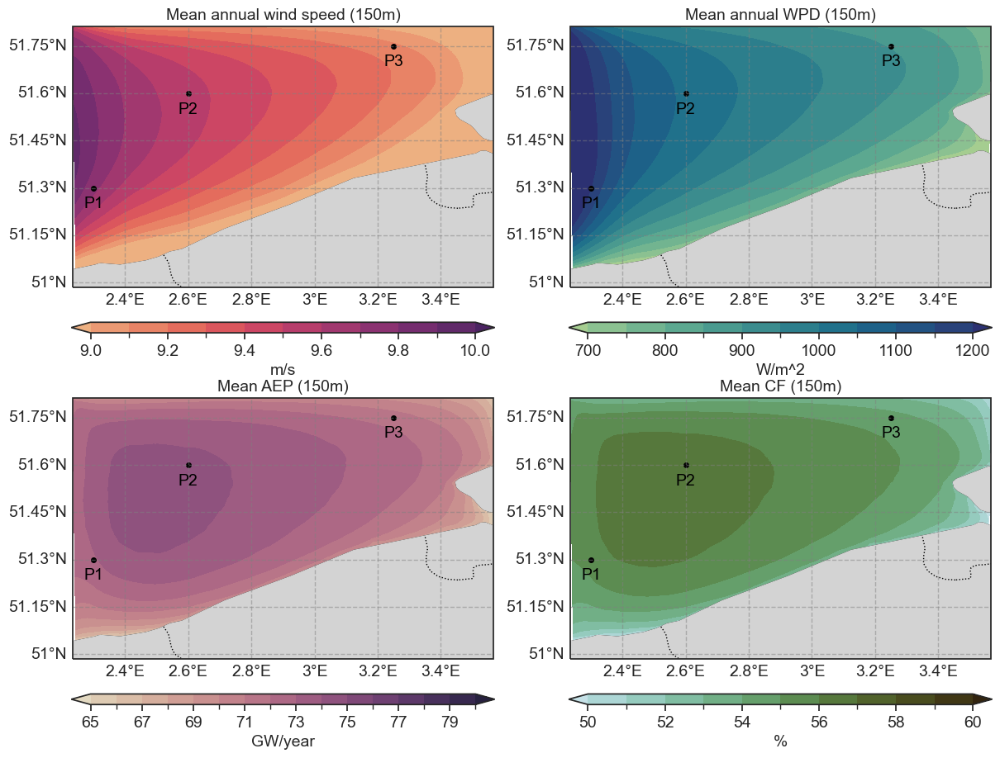

In [27]:
fig = plt.figure(figsize=(12, 9), constrained_layout=True)
gs = fig.add_gridspec(2,2)
map_plotter(gs[0,0],mean_ws[10:-10,10:-10],'XLONG','XLAT',np.arange(9,10.1,0.1),'flare',f'Mean annual wind speed ({level}m)',1,'m/s','horizontal',sample_points = sample_points)
map_plotter(gs[0,1],mean_wpd[10:-10,10:-10],'XLONG','XLAT',np.arange(700,1200.1,50),'crest',f'Mean annual WPD ({level}m)',1,'W/m^2','horizontal',sample_points = sample_points)
map_plotter(gs[1,0],mean_AEP[10:-10,10:-10]/1e6,'XLONG','XLAT',np.arange(65,80.1,1),"ch:s=-.2,r=.6",f'Mean AEP ({level}m)',1,'GW/year','horizontal',sample_points = sample_points)
map_plotter(gs[1,1],mean_CF[10:-10,10:-10]*1e2,'XLONG','XLAT',np.arange(50,60.1,1),"ch:s=10,r=.6",f'Mean CF ({level}m)',1,'%','horizontal',sample_points = sample_points)
plt.savefig(f'{case}_optimization_runs_mean_wind_resources_{level}m.png',dpi=300,bbox_inches='tight',pad_inches=0)

### Resource variabilities

Time elapsed for nearest point identification is 0.004269123077392578s
{'south_north': 78, 'west_east': 18}
Time elapsed for nearest point identification is 0.002079010009765625s
{'south_north': 142, 'west_east': 59}
Time elapsed for nearest point identification is 0.0018563270568847656s
{'south_north': 175, 'west_east': 146}
Time elapsed for nearest point identification is 0.002283811569213867s
{'south_north': 78, 'west_east': 18}
Time elapsed for nearest point identification is 0.002112150192260742s
{'south_north': 142, 'west_east': 59}
Time elapsed for nearest point identification is 0.0017919540405273438s
{'south_north': 175, 'west_east': 146}
Time elapsed for nearest point identification is 0.002016782760620117s
{'south_north': 78, 'west_east': 18}
Time elapsed for nearest point identification is 0.0024361610412597656s
{'south_north': 142, 'west_east': 59}
Time elapsed for nearest point identification is 0.0017962455749511719s
{'south_north': 175, 'west_east': 146}


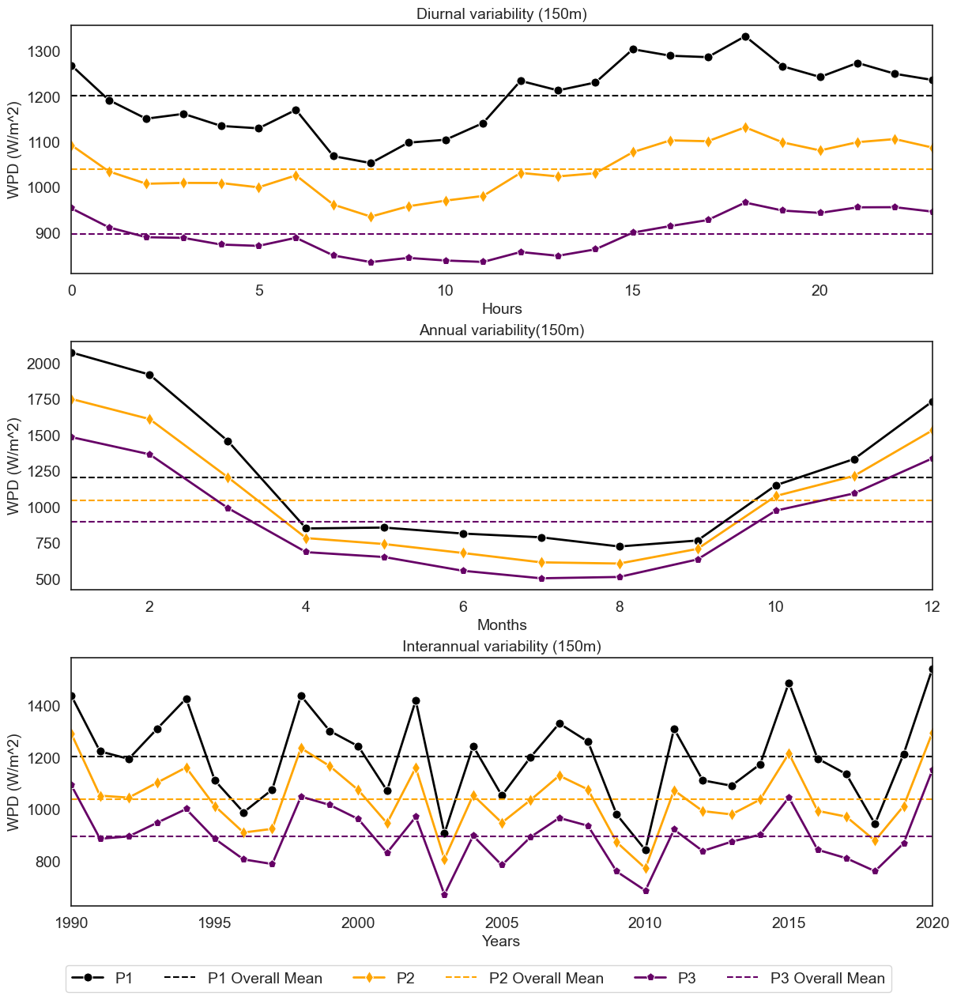

In [21]:
fig = plt.figure(figsize=(12, 12), constrained_layout=True)
gs = fig.add_gridspec(3,1)
sns.set_theme(style="white")

hourly_df = pd.DataFrame()
for i,key in enumerate(sample_points.keys()):
    ds = read_pointwise_timeseries(wpd,sample_points[key][0],sample_points[key][1])

    pointwise_df = pd.DataFrame()

    # Loop through hours
    for hour in range(0,24):
        # Extract data for the current year
        data = ds.sel(Time=ds.Time.dt.hour == hour).mean().values
        # Create a new DataFrame with the year as a column
        #df = pd.DataFrame({'Hour': [hour], key: data})
        df = pd.DataFrame({key: data}, index=pd.Index([hour], name='Hour'))
        # Append the data to the main DataFrame
        pointwise_df = pd.concat([pointwise_df, df])
    hourly_df = pd.concat([hourly_df, pointwise_df],axis=1)

variability_plotter(gs[0,0],hourly_df,f'Diurnal variability ({level}m)','Hours','WPD (W/m^2)', key,colors[i],'o')


monthly_df = pd.DataFrame()
for i,key in enumerate(sample_points.keys()):
    ds = read_pointwise_timeseries(wpd,sample_points[key][0],sample_points[key][1])

    pointwise_df = pd.DataFrame()

    # Loop through hours
    for month in [12, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]:
        # Extract data for the current year
        data = ds.sel(Time=ds.Time.dt.month == month).mean().values
        # Create a new DataFrame with the year as a column
        #df = pd.DataFrame({'Hour': [hour], key: data})
        df = pd.DataFrame({key: data}, index=pd.Index([month], name='month'))
        # Append the data to the main DataFrame
        pointwise_df = pd.concat([pointwise_df, df])
    monthly_df = pd.concat([monthly_df, pointwise_df],axis=1)

variability_plotter(gs[1,0],monthly_df,f'Annual variability({level}m)','Months','WPD (W/m^2)', key,colors[i],'o')

yearly_df = pd.DataFrame()
for i,key in enumerate(sample_points.keys()):
    ds = read_pointwise_timeseries(wpd,sample_points[key][0],sample_points[key][1])

    pointwise_df = pd.DataFrame()

    # Loop through hours
    for year in list(range(1990, 2021)):
        # Extract data for the current year
        data = ds.sel(Time=ds.Time.dt.year == year).mean().values
        # Create a new DataFrame with the year as a column
        #df = pd.DataFrame({'Hour': [hour], key: data})
        df = pd.DataFrame({key: data}, index=pd.Index([year], name='year'))
        # Append the data to the main DataFrame
        pointwise_df = pd.concat([pointwise_df, df])
    yearly_df = pd.concat([yearly_df, pointwise_df],axis=1)

axs = variability_plotter(gs[2,0],yearly_df,f'Interannual variability ({level}m)','Years','WPD (W/m^2)', key,colors[i],'o')

# Extract legend from one of the subplots
handles, labels = axs.get_legend_handles_labels()
# Create a common legend below the figures
fig.legend(handles, labels, loc='lower center', ncol=len(labels), bbox_to_anchor=(0.5, -0.05),fontsize=14)

plt.savefig(f'{case}_optimization_runs_wind_resources_variabilities_{level}m.png',dpi=300,bbox_inches='tight',pad_inches=0)

# Solar resource assessment

In [22]:
Epv = 0.216
cell_watt = 365

In [32]:
%%time
run = 'New_runs'
# read XLAND and get the lat lon data from this
XLAND = xr.open_dataset(f'{root_dir}/{run}/{case}/Postprocessed/XLAND.nc')
XLAT = XLAND.XLAT
XLONG = XLAND.XLONG
chunks={"Time": -1,"south_north": 8,"west_east": 8}
t2m = xr.open_dataset(f'{root_dir}/{run}/{case}/Postprocessed/variablewise_files/T2.nc',chunks=chunks)

t2m = t2m['T2'].assign_coords(XLAT=XLAT,XLONG=XLONG)
swdown = xr.open_dataset(f'{root_dir}/{run}/{case}/Postprocessed/variablewise_files/SWDOWN2.nc',chunks=chunks)
swdown = swdown['SWDOWN2'].assign_coords(XLAT=XLAT,XLONG=XLONG)
spv = xr.open_dataset(f'{root_dir}/{run}/{case}/Postprocessed/variablewise_files/spv.nc',chunks=chunks)['PVO']

CPU times: user 75.8 ms, sys: 33.9 ms, total: 110 ms
Wall time: 76.7 ms


In [33]:
%%time
mean_t2m = t2m.mean(dim='Time').compute()
mean_swdown = swdown.mean(dim='Time').compute()
mean_spv = spv.isel(Time=slice(None,-1)).resample(Time='Y').sum().mean(dim='Time').compute()
mean_CF = mean_spv/(8766*cell_watt)

CPU times: user 2min 2s, sys: 49.7 s, total: 2min 52s
Wall time: 3min 35s


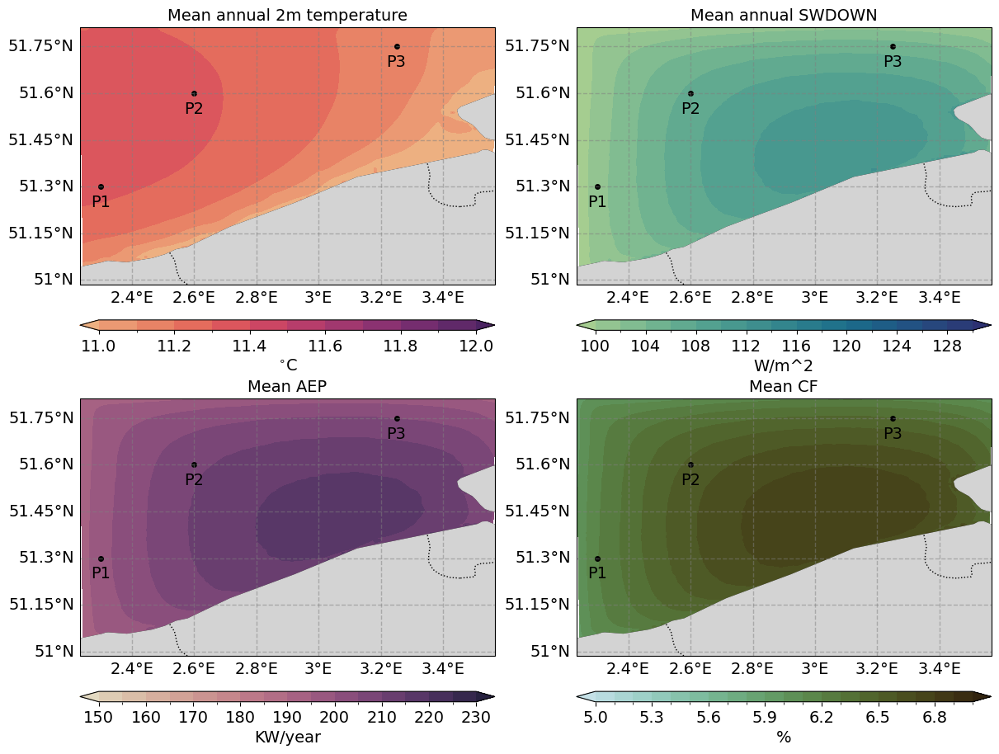

In [23]:
fig = plt.figure(figsize=(12, 9), constrained_layout=True)
gs = fig.add_gridspec(2,2)
map_plotter(gs[0,0],mean_t2m[10:-10,10:-10],'XLONG','XLAT',np.arange(11,12.1,0.1),'flare',f'Mean annual 2m temperature',1,r'$^{\circ}$C','horizontal',sample_points = sample_points)
map_plotter(gs[0,1],mean_swdown[10:-10,10:-10],'XLONG','XLAT',np.arange(100,130.1,2),'crest',f'Mean annual SWDOWN',1,'W/m^2','horizontal',sample_points = sample_points)
map_plotter(gs[1,0],mean_spv[10:-10,10:-10]/1e3,'XLONG','XLAT',np.arange(150,230.1,5),"ch:s=-.2,r=.6",f'Mean AEP',1,'KW/year','horizontal',sample_points = sample_points)
map_plotter(gs[1,1],mean_CF[10:-10,10:-10]*1e2,'XLONG','XLAT',np.arange(5,7.1,0.1),"ch:s=10,r=.6",f'Mean CF',1,'%','horizontal',sample_points = sample_points)
plt.savefig(f'{case}_optimization_runs_mean_solar_resources.png',dpi=300,bbox_inches='tight',pad_inches=0)

### Resource variabilities

Time elapsed for nearest point identification is 0.0029761791229248047s
{'south_north': 78, 'west_east': 18}
Time elapsed for nearest point identification is 0.0019736289978027344s
{'south_north': 142, 'west_east': 59}
Time elapsed for nearest point identification is 0.0022041797637939453s
{'south_north': 175, 'west_east': 146}
Time elapsed for nearest point identification is 0.0021550655364990234s
{'south_north': 78, 'west_east': 18}
Time elapsed for nearest point identification is 0.0016891956329345703s
{'south_north': 142, 'west_east': 59}
Time elapsed for nearest point identification is 0.0016281604766845703s
{'south_north': 175, 'west_east': 146}
Time elapsed for nearest point identification is 0.0017707347869873047s
{'south_north': 78, 'west_east': 18}
Time elapsed for nearest point identification is 0.0018270015716552734s
{'south_north': 142, 'west_east': 59}
Time elapsed for nearest point identification is 0.0016758441925048828s
{'south_north': 175, 'west_east': 146}


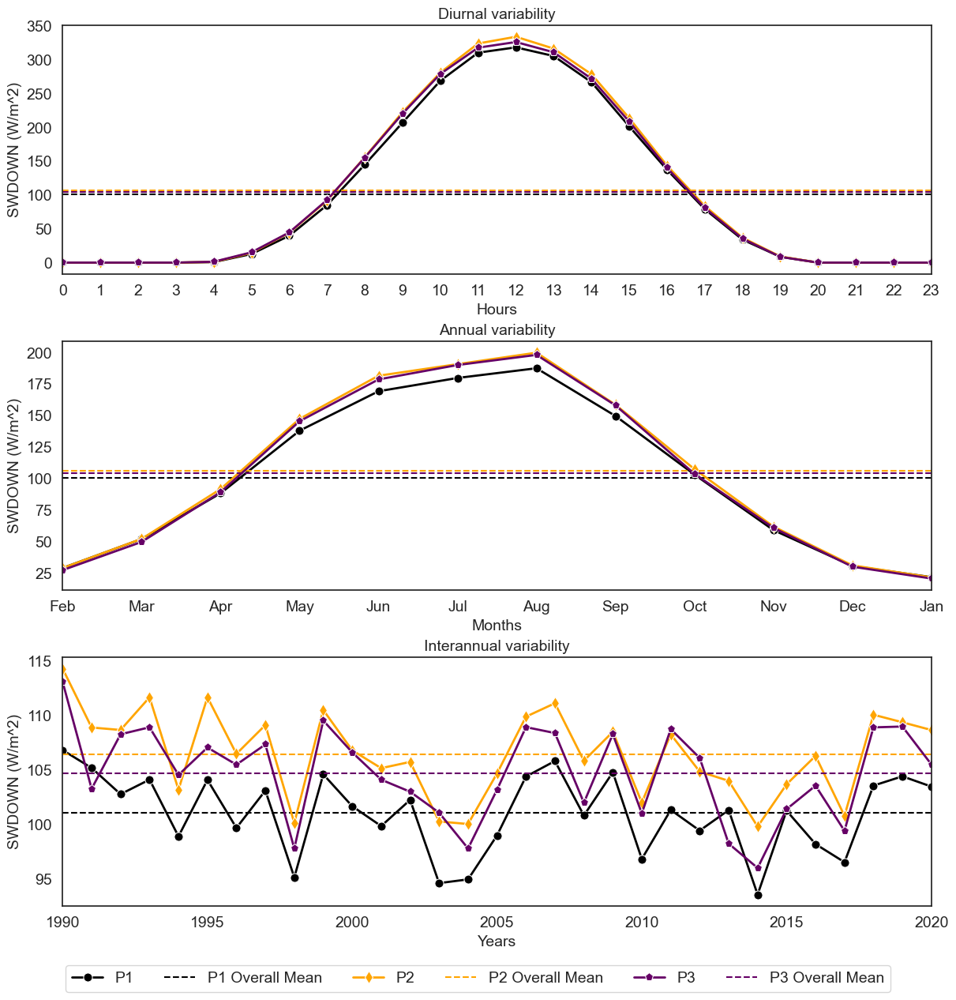

In [25]:
fig = plt.figure(figsize=(12, 12), constrained_layout=True)
gs = fig.add_gridspec(3,1)
sns.set_theme(style="white")

hourly_df = pd.DataFrame()
for i,key in enumerate(sample_points.keys()):
    ds = read_pointwise_timeseries(swdown,sample_points[key][0],sample_points[key][1])

    pointwise_df = pd.DataFrame()

    # Loop through hours
    for hour in range(0,24):
        # Extract data for the current year
        data = ds.sel(Time=ds.Time.dt.hour == hour).mean().values
        # Create a new DataFrame with the year as a column
        #df = pd.DataFrame({'Hour': [hour], key: data})
        df = pd.DataFrame({key: data}, index=pd.Index([hour], name='Hour'))
        # Append the data to the main DataFrame
        pointwise_df = pd.concat([pointwise_df, df])
    hourly_df = pd.concat([hourly_df, pointwise_df],axis=1)

variability_plotter(gs[0,0],hourly_df,f'Diurnal variability','Hours','SWDOWN (W/m^2)', key,colors[i],'o',xlabel_ticks=hours)


monthly_df = pd.DataFrame()
for i,key in enumerate(sample_points.keys()):
    ds = read_pointwise_timeseries(swdown,sample_points[key][0],sample_points[key][1])

    pointwise_df = pd.DataFrame()

    # Loop through hours
    for month in [12, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]:
        # Extract data for the current year
        data = ds.sel(Time=ds.Time.dt.month == month).mean().values
        # Create a new DataFrame with the year as a column
        #df = pd.DataFrame({'Hour': [hour], key: data})
        df = pd.DataFrame({key: data}, index=pd.Index([month], name='month'))
        # Append the data to the main DataFrame
        pointwise_df = pd.concat([pointwise_df, df])
    monthly_df = pd.concat([monthly_df, pointwise_df],axis=1)

variability_plotter(gs[1,0],monthly_df,f'Annual variability','Months','SWDOWN (W/m^2)', key,colors[i],'o',xlabel_ticks=months)

yearly_df = pd.DataFrame()
for i,key in enumerate(sample_points.keys()):
    ds = read_pointwise_timeseries(swdown,sample_points[key][0],sample_points[key][1])

    pointwise_df = pd.DataFrame()

    # Loop through hours
    for year in list(range(1990, 2021)):
        # Extract data for the current year
        data = ds.sel(Time=ds.Time.dt.year == year).mean().values
        # Create a new DataFrame with the year as a column
        #df = pd.DataFrame({'Hour': [hour], key: data})
        df = pd.DataFrame({key: data}, index=pd.Index([year], name='year'))
        # Append the data to the main DataFrame
        pointwise_df = pd.concat([pointwise_df, df])
    yearly_df = pd.concat([yearly_df, pointwise_df],axis=1)

axs = variability_plotter(gs[2,0],yearly_df,f'Interannual variability','Years','SWDOWN (W/m^2)', key,colors[i],'o')

# Extract legend from one of the subplots
handles, labels = axs.get_legend_handles_labels()
# Create a common legend below the figures
fig.legend(handles, labels, loc='lower center', ncol=len(labels), bbox_to_anchor=(0.5, -0.05),fontsize=14)

plt.savefig(f'{case}_optimization_runs_solar_resources_variabilities.png',dpi=300,bbox_inches='tight',pad_inches=0)

### Ireland

In [18]:
#-- Duration of the observations and corresponding simulations --#
start='2003-03-01 00:00:00'
end='2004-03-01 00:00:00'
times = pd.date_range(start=start, end=end, freq='1H')
print('A total of ',times.shape[0],'times should exist during ',times[0],' and ',times[-1])
case = 'Ireland_coast'

region = 'Ireland'
sample_points = {
    "P1": (52.55,-10.25),
    "P2": (52.85, -10), #P2 is POR2 in tslist
    "P3": (52.9, -10.4),
}
obs_points = {
    "M1": (53.12,-11.2)
}

A total of  8785 times should exist during  2003-03-01 00:00:00  and  2004-03-01 00:00:00


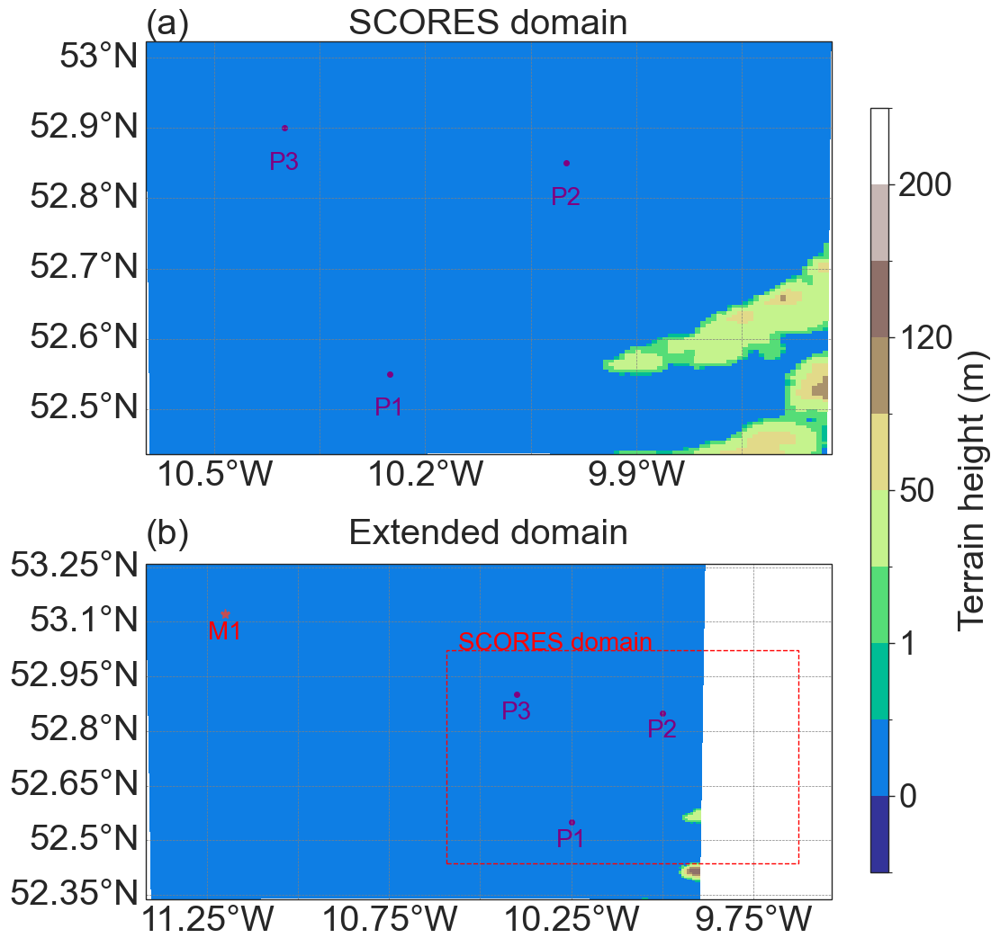

In [38]:
# Load data for the first file
SCORES_domain = f'{root_dir}/New_runs/{case}/Postprocessed/geo_em.d01.nc'
SCORES_ds = xr.open_dataset(SCORES_domain)
plot_data1 = SCORES_ds.HGT_M[0, ...].assign_coords(latitude=SCORES_ds.XLAT_M[0,...],longitude=SCORES_ds.XLONG_M[0,...])

# Load data for the second file
Extended_domain = f'{root_dir}/Validation_runs/{case}/Postprocessed/met_em.d01.2003-02-26_00:00:00.nc'
Extended_ds = xr.open_dataset(Extended_domain)
plot_data2 = Extended_ds.HGT_M[0, ...].assign_coords(latitude=Extended_ds.XLAT_M[0,...],longitude=Extended_ds.XLONG_M[0,...])

# Define the custom color levels and colormap
clevels = [-5, 0, 0.5, 1, 10, 50, 80, 120, 160, 200, 240]
cmap = plt.get_cmap("terrain")

# Create a figure with two subplots
sns.set_theme(style="white")
sns.set_context("paper",font_scale=3)
fig, axes = plt.subplots(2, 1, figsize=(10, 17),width_ratios=[1], subplot_kw={'projection':ccrs.PlateCarree()})
#plt.rc('font', size=10)    # fontsize of the all text
#plt.rc('ytick', labelsize=10)    # fontsize of the tick labels
#plt.rc('xtick', labelsize=10)

# Plot the data for the first file in the first subplot
im1 = plot_data1.plot(x='longitude',y='latitude',levels=clevels, cmap=cmap, ax=axes[0],add_colorbar=False)
#cbar = plt.colorbar(im1, ax=axes[0], shrink=0.5)
#cbar.set_label('Terrain height (m)')
gl = axes[0].gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linestyle='--', linewidth=0.5, color='gray')
gl.top_labels = False
gl.right_labels = False
axes[0].set_title('SCORES domain',loc='center')
axes[0].set_title('(a)',loc='left')

# Plot the data for the second file in the second subplot
im2 = plot_data2.plot(x='longitude',y='latitude',levels=clevels, cmap=cmap, ax=axes[1],add_colorbar=False)
gl = axes[1].gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linestyle='--', linewidth=0.5, color='gray')
#cbar = plt.colorbar(im1, ax=axes[1], shrink=0.8)
#cbar.set_label('Terrain height (m)')
gl.top_labels = False
gl.right_labels = False
axes[1].set_title('Extended domain',loc='center')
axes[1].set_title('(b)',loc='left')

# Get the maximum and minimum latitude and longitude from plot_data1
min_lat = plot_data1.latitude.min().values
max_lat = plot_data1.latitude.max().values
min_lon = plot_data1.longitude.min().values
max_lon = plot_data1.longitude.max().values

# Draw a rectangular box on im2
rect = matplotlib.patches.Rectangle((min_lon, min_lat), max_lon - min_lon, max_lat - min_lat,linestyle='--', linewidth=1, edgecolor='red', facecolor='none',label='dmy')
axes[1].add_patch(rect)

# Add the line label "SCORES domain" within the rectangular box
text_x = min_lon+0.3
text_y = max_lat+0.02
axes[1].annotate("SCORES domain", xy=(text_x, text_y), color='red', fontsize=20, ha='center', va='center')

# Add labels and markers of sample points
for label, (lat, lon) in sample_points.items():
    for ax in axes:
        ax.text(lon, lat - 0.05, label, color='purple', fontsize=20, ha='center', va='center')
        ax.plot(lon, lat, '.', markersize=8,color='purple')

# Add labels and markers of observationsl sites

for label, (lat, lon) in obs_points.items():
    ax = axes[1]
    ax.text(lon, lat - 0.05, label, color='red', fontsize=20, ha='center', va='center')
    ax.plot(lon, lat, 'r*', markersize=8)

# Add colorbar spanning both subplots
cax = plt.axes([1, 0.25, 0.02, 0.5])  # Adjust the position and size of the colorbar
cbar = plt.colorbar(im1, cax=cax)
cbar.set_label('Terrain height (m)')

plt.tight_layout(rect=(0, 0, 1.0, 1))   
plt.subplots_adjust(hspace=-0.5)

plt.savefig(f'Ireland_Domain_configuration.png',dpi=300,bbox_inches='tight',pad_inches=0)


#### M1

In [19]:
key = 'M1'
# === Simulations from wrfout ===
run = 'Validation_runs'
chunks={"Time": -1,"south_north": 8,"west_east": 8}
# read XLAND and get the lat lon data from this
XLAND = xr.open_dataset(f'{root_dir}/{run}/{case}/Postprocessed/variablewise_files/XLAND.nc')
XLAT = XLAND.XLAT
XLONG = XLAND.XLONG

ws = wind_speed(f'{root_dir}/{run}/{case}/Postprocessed/variablewise_files','U10','V10',chunks=chunks)
ws = ws.assign_coords(XLAT=XLAT,XLONG=XLONG)
ws_df = read_pointwise_timeseries(ws.assign_coords(XLAT=XLAT,XLONG=XLONG),obs_points[key][0],obs_points[key][1]).drop_vars(['XLONG','XLAT']).to_dataframe(name='ws')

t2 = xr.open_dataset(f'{root_dir}/{run}/{case}/Postprocessed/variablewise_files/T2.nc',chunks=chunks)
t2 = t2.assign_coords(XLAT=XLAT,XLONG=XLONG)
t2_df = read_pointwise_timeseries(t2,obs_points[key][0],obs_points[key][1],var_name='T2').to_dataframe(name='t2')

sim_df = pd.concat([ws_df,t2_df],axis=1)

sim_df = sim_df.loc[start:end]
sim_df.index = sim_df.index.tz_localize('UTC')
sim_df.columns = pd.MultiIndex.from_product([[run], sim_df.columns])

# -- Observations --#
obs_df = pd.read_csv(f'{root_dir}/eval/Observations/Buoy/Ireland_coast/M1.csv')
obs_df = obs_df[obs_df['station_id']=='M1']
obs_df = obs_df.loc[:,['time', 'WindDirection', 'WindSpeed', 'AirTemperature' ]]
obs_df.set_index('time',inplace=True)

obs_df = obs_df.apply(pd.to_numeric, errors='coerce') 
obs_df['WindSpeed'] = obs_df.loc[:,'WindSpeed']*0.514444 #Conversion from knots to m/s
obs_df.index = pd.to_datetime(obs_df.index)
obs_df = obs_df.resample('H').asfreq()
obs_df.dropna(inplace=True)

obs_df = obs_df.loc[start:end]
#Add top column name as obs
head_column = 'Obs'
obs_df.columns = pd.MultiIndex.from_product([[head_column], obs_df.columns])
obs_df['Obs']['WindSpeed'] = extrapolate(obs_df['Obs']['WindSpeed'],3,10,0.0002)

#--- Reanalysis from open meteo---#
ERA5 = pd.read_csv(f'{root_dir}/eval/Reanalysis/open-meteo/{key}_ERA5.csv',header=2,index_col=0)
ERA5.index = pd.to_datetime(ERA5.index).tz_localize('UTC')
ERA5.columns = pd.MultiIndex.from_product([['ERA5'], ERA5.columns])

# Now, combine the df df_7303, and df_7303_reanalysis side by side
merged_df = sim_df.merge(obs_df, left_index=True, right_index=True, how='inner')
merged_df = merged_df.merge(ERA5, left_index=True, right_index=True, how='inner')

# wind speed dataframes
ws_dfs = [merged_df['Obs']['WindSpeed'],
          merged_df['ERA5']['wind_speed_10m (m/s)'],
         merged_df[run]['ws']]

# 2m temperature dataframes
temp_dfs = [merged_df['Obs']['AirTemperature'],
           merged_df['ERA5']['temperature_2m (°C)'],
           merged_df[run]['t2']] #convert into Kelvin

# --- Storing the dataframes into the validation list here ---#
cite_data = {'ws_dfs': ws_dfs,
            'temp_dfs': temp_dfs}

Time elapsed for nearest point identification is 0.001665353775024414s
{'south_north': 169, 'west_east': 28}
Time elapsed for nearest point identification is 0.0020363330841064453s
{'south_north': 169, 'west_east': 28}


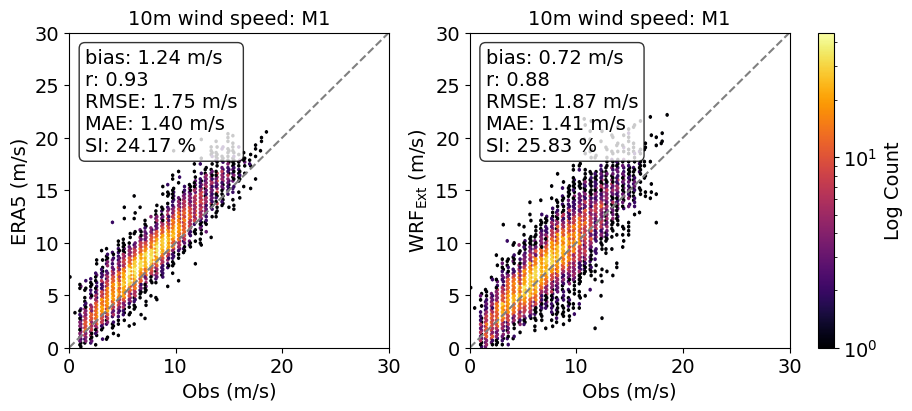

In [20]:
fig = plt.figure(figsize=(9, 4), constrained_layout=True)
gs = fig.add_gridspec(1,2)
limits = [0,30]
hexbin_plotter(gs[0,0],cite_data['ws_dfs'][0],cite_data['ws_dfs'][1],f'10m wind speed: {key}',text_arg=True,units='m/s',xlabel='Obs (m/s)',ylabel='ERA5 (m/s)',limits=limits)
ax = hexbin_plotter(gs[0,1],cite_data['ws_dfs'][0],cite_data['ws_dfs'][2],f'10m wind speed: {key}',text_arg=True,units='m/s',
                    xlabel='Obs (m/s)',ylabel=r'WRF$_{\mathrm{Ext}}$ (m/s)',colorbar=True,limits=limits)
plt.savefig(f'{case}_{run}_{key}_wind_hexbins.png',dpi=300,bbox_inches='tight',pad_inches=0)

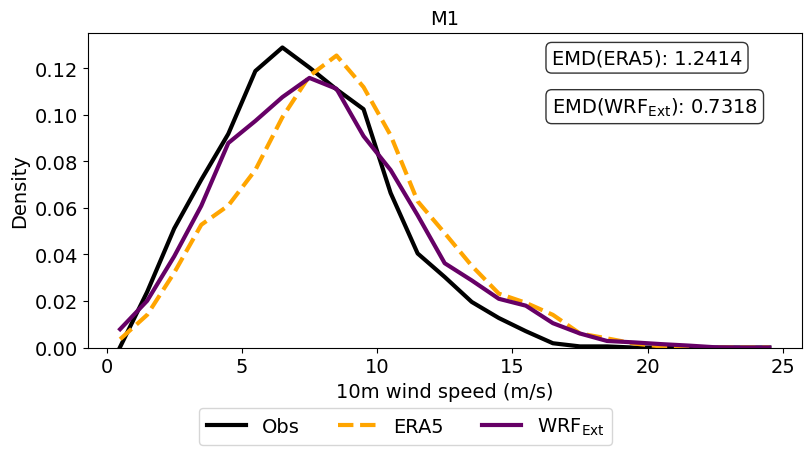

In [75]:
bins=np.arange(0, 25.1, 1)
labels = ['Obs', 'ERA5', r'WRF$_{\mathrm{Ext}}$']

fig = plt.figure(figsize=(8, 4), constrained_layout=True)
gs = fig.add_gridspec(1,1)
ax = hist_pdf_plotter(gs[0,0],cite_data['ws_dfs'],bins,line_styles,colors,labels,xlabel='10m wind speed (m/s)',ylabel = 'Density',title=key,text_arg=True,text_alignment='right')

# Add a legend at the bottom
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', bbox_to_anchor=(0.5, -0.1), ncol=len(labels), borderaxespad=0.,fontsize=14)

plt.savefig(f'{case}_{run}_{key}_wind_hist_pdf.png',dpi=300,bbox_inches='tight',pad_inches=0)

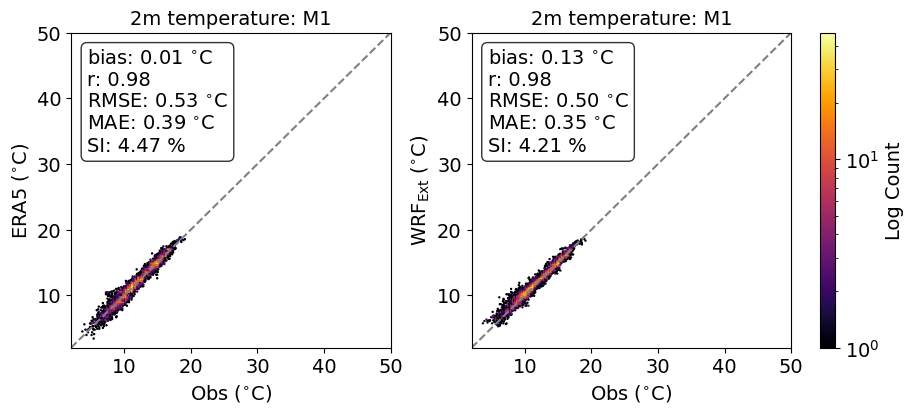

In [76]:
fig = plt.figure(figsize=(9, 4), constrained_layout=True)
gs = fig.add_gridspec(1,2)
limits = [2,50]
hexbin_plotter(gs[0,0],cite_data['temp_dfs'][0],cite_data['temp_dfs'][1],f'2m temperature: {key}',text_arg=True,units=r'$^{\circ}$C',
               xlabel=r'Obs ($^{\circ}$C)',ylabel='ERA5 ($^{\circ}$C)',limits=limits)
ax = hexbin_plotter(gs[0,1],cite_data['temp_dfs'][0],cite_data['temp_dfs'][2],f'2m temperature: {key}',text_arg=True,units=r'$^{\circ}$C',
                    xlabel='Obs ($^{\circ}$C)',ylabel=r'WRF$_{\mathrm{Ext}}$ ($^{\circ}$C)',colorbar=True,limits=limits)
plt.savefig(f'{case}_{run}_{key}_temperature_hexbins.png',dpi=300,bbox_inches='tight',pad_inches=0)

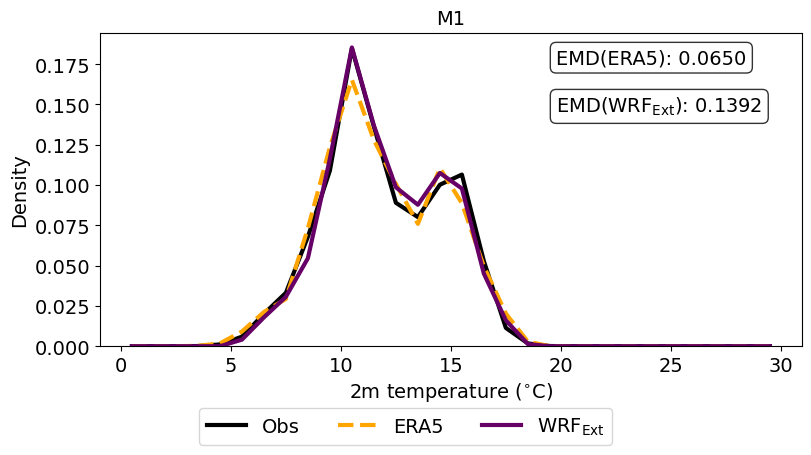

In [77]:
bins=np.arange(0, 30.1, 1)
labels = ['Obs', 'ERA5', r'WRF$_{\mathrm{Ext}}$']

fig = plt.figure(figsize=(8, 4), constrained_layout=True)
gs = fig.add_gridspec(1,1)
ax = hist_pdf_plotter(gs[0,0],cite_data['temp_dfs'],bins,line_styles,colors,labels,xlabel=r'2m temperature ($^{\circ}$C)',ylabel = 'Density',title=key,text_arg=True,text_alignment='right')

# Add a legend at the bottom
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', bbox_to_anchor=(0.5, -0.1), ncol=len(labels), borderaxespad=0.,fontsize=14)

plt.savefig(f'{case}_{run}_{key}_temperature_hist_pdf.png',dpi=300,bbox_inches='tight',pad_inches=0)

## Validation with Extended domain

In [79]:
# -- Simulations --#
case = 'Ireland_coast'
runs = ['New_runs','Validation_runs']
levels = ['100','120','150']
optimization_data[case] = {}

for key in sample_points:
    ws_dfs = []
    temp_dfs = []
    for run in runs:
        # read XLAND and get the lat lon data from this
        XLAND = xr.open_dataset(f'{root_dir}/{run}/{case}/Postprocessed/variablewise_files/XLAND.nc')
        XLAT = XLAND.XLAT
        XLONG = XLAND.XLONG
            
        wsdfs = []
        for level in levels:
            run_dir=f'{root_dir}/{run}/{case}/Postprocessed/variablewise_files'
            ws = xr.open_dataset(f'{run_dir}/ws_{level}.nc')['ws']

            df = read_pointwise_timeseries(ws.sel(Time=slice(start,end)),sample_points[key][0],sample_points[key][1]).drop_vars(['XLONG','XLAT','num_z_levels_stag']).to_dataframe(name='data')
            df.columns = [level]
            wsdfs.append(df)
        
        wsdfs = pd.concat(wsdfs,axis=1)
        wsdfs.columns = pd.MultiIndex.from_product([[run], wsdfs.columns])
        ws_dfs.append(wsdfs)
        
        tempdfs = []
        t2 = xr.open_dataset(f'{root_dir}/{run}/{case}/Postprocessed/variablewise_files/T2.nc',chunks=chunks)
        t2 = t2.assign_coords(XLAT=XLAT,XLONG=XLONG)
        t2_df = read_pointwise_timeseries(t2.sel(Time=slice(start,end)),sample_points[key][0],sample_points[key][1],var_name='T2').drop_vars(['XLONG','XLAT']).to_dataframe(name='t2')
        
        t2_df.columns = pd.MultiIndex.from_product([[run], t2_df.columns])
        temp_dfs.append(t2_df)
        
        del ws, t2
    # --- Storing the dataframes into the validation list here ---#
    cite_data = {'ws_dfs': ws_dfs, 'temp_dfs': temp_dfs}
    optimization_data[case][key] = cite_data

Time elapsed for nearest point identification is 0.0033731460571289062s
{'south_north': 24, 'west_east': 45}
Time elapsed for nearest point identification is 0.0035021305084228516s
{'south_north': 24, 'west_east': 45}
Time elapsed for nearest point identification is 0.0030846595764160156s
{'south_north': 24, 'west_east': 45}
Time elapsed for nearest point identification is 0.0021219253540039062s
{'south_north': 24, 'west_east': 45}
Time elapsed for nearest point identification is 0.0038564205169677734s
{'south_north': 45, 'west_east': 152}
Time elapsed for nearest point identification is 0.0036156177520751953s
{'south_north': 45, 'west_east': 152}
Time elapsed for nearest point identification is 0.0036058425903320312s
{'south_north': 45, 'west_east': 152}
Time elapsed for nearest point identification is 0.0011997222900390625s
{'south_north': 45, 'west_east': 152}
Time elapsed for nearest point identification is 0.003205537796020508s
{'south_north': 89, 'west_east': 77}
Time elapsed for

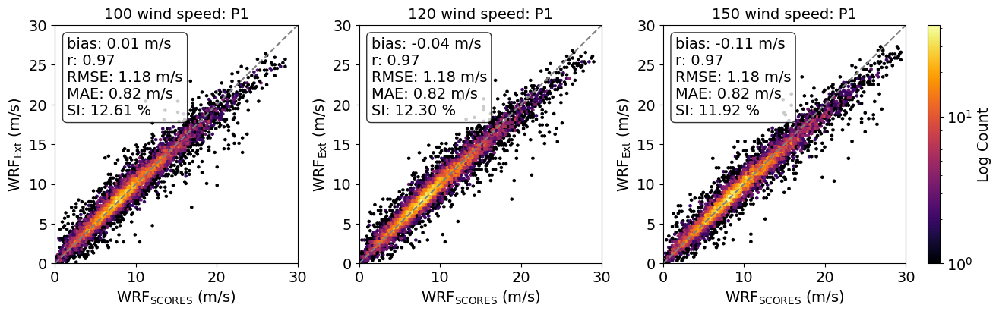

In [81]:
runs = ['New_runs','Validation_runs']
labels=[r'WRF$_{\mathrm{SCORES}}$',r'WRF$_{\mathrm{Ext}}$']
levels = ['100','120','150']

key = 'P1'
fig = plt.figure(figsize=(13, 4), constrained_layout=True)
gs = fig.add_gridspec(1,3)
limits = [0,30]

cite_data = optimization_data[case][key]
ws_dfs = cite_data['ws_dfs']
for i,level in enumerate(levels):
    colorbar = True if i == 2 else False
    ax = hexbin_plotter(gs[0,i],cite_data['ws_dfs'][0][runs[0]][level],cite_data['ws_dfs'][1][runs[1]][level],
                        f'{level} wind speed: {key}',text_arg=True,units='m/s',xlabel=r'WRF$_{\mathrm{SCORES}}$ (m/s)',
                        ylabel=r'WRF$_{\mathrm{Ext}}$ (m/s)',colorbar=colorbar,limits=limits)
plt.savefig(f'{case}_optimization_runs_{key}_wind_hexbins.png',dpi=300,bbox_inches='tight',pad_inches=0)

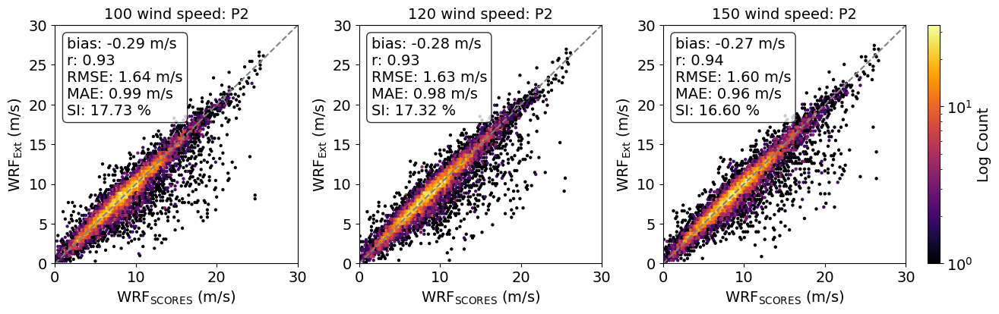

In [82]:
key = 'P2'
fig = plt.figure(figsize=(13, 4), constrained_layout=True)
gs = fig.add_gridspec(1,3)
limits = [0,30]

cite_data = optimization_data[case][key]
ws_dfs = cite_data['ws_dfs']
for i,level in enumerate(levels):
    colorbar = True if i == 2 else False
    ax = hexbin_plotter(gs[0,i],cite_data['ws_dfs'][0][runs[0]][level],cite_data['ws_dfs'][1][runs[1]][level],
                        f'{level} wind speed: {key}',text_arg=True,units='m/s',xlabel=r'WRF$_{\mathrm{SCORES}}$ (m/s)',
                        ylabel=r'WRF$_{\mathrm{Ext}}$ (m/s)',colorbar=colorbar,limits=limits)
plt.savefig(f'{case}_optimization_runs_{key}_wind_hexbins.png',dpi=300,bbox_inches='tight',pad_inches=0)

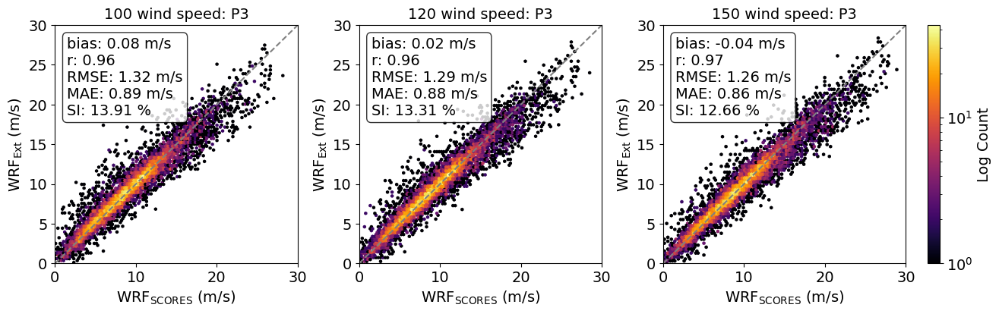

In [83]:
key = 'P3'
fig = plt.figure(figsize=(13, 4), constrained_layout=True)
gs = fig.add_gridspec(1,3)
limits = [0,30]

cite_data = optimization_data[case][key]
ws_dfs = cite_data['ws_dfs']
for i,level in enumerate(levels):
    colorbar = True if i == 2 else False
    ax = hexbin_plotter(gs[0,i],cite_data['ws_dfs'][0][runs[0]][level],cite_data['ws_dfs'][1][runs[1]][level],
                        f'{level} wind speed: {key}',text_arg=True,units='m/s',xlabel=r'WRF$_{\mathrm{SCORES}}$ (m/s)',
                        ylabel=r'WRF$_{\mathrm{Ext}}$ (m/s)',colorbar=colorbar,limits=limits)
plt.savefig(f'{case}_optimization_runs_{key}_wind_hexbins.png',dpi=300,bbox_inches='tight',pad_inches=0)

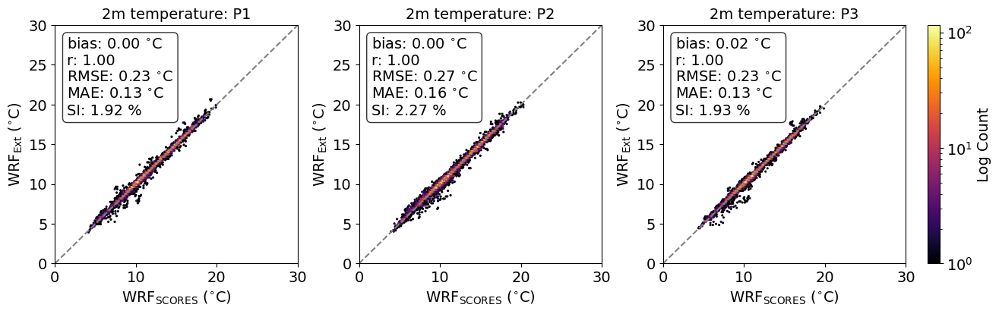

In [84]:
runs = ['New_runs','Validation_runs']
labels=[r'WRF$_{\mathrm{SCORES}}$',r'WRF$_{\mathrm{Ext}}$']
levels = ['100','120','150']

key = 'P1'
fig = plt.figure(figsize=(13, 4), constrained_layout=True)
gs = fig.add_gridspec(1,3)
limits = [0,30]

temp_dfs = cite_data['temp_dfs']
for i,key in enumerate(sample_points):
    colorbar = True if i == 2 else False
    cite_data = optimization_data[case][key]
    ax = hexbin_plotter(gs[0,i],cite_data['temp_dfs'][0][runs[0]]['t2'],cite_data['temp_dfs'][1][runs[1]]['t2'],
                        f'2m temperature: {key}',text_arg=True,units=r'$^{\circ}$C',xlabel=r'WRF$_{\mathrm{SCORES}}$ ($^{\circ}$C)',
                        ylabel=r'WRF$_{\mathrm{Ext}}$ ($^{\circ}$C)',colorbar=colorbar,limits=limits)
plt.savefig(f'{case}_optimization_runs_temperature_hexbins.png',dpi=300,bbox_inches='tight',pad_inches=0)

## Wind resources

## 120 m

In [34]:
%%time
case = 'Ireland_coast'
run='New_runs'
run_dir=f'{root_dir}/{run}/{case}/Postprocessed/variablewise_files'
chunks={"Time": -1,"south_north": 24,"west_east": 24}

level = 120
turbine_type = '8MW'
ws = xr.open_dataset(f'{run_dir}/ws_{level}.nc',chunks=chunks)['ws']
wpd = WPD(ws).compute()
tp = xr.open_dataset(f'{run_dir}/{turbine_type}/tp_{level}.nc',chunks=chunks)['power']

CPU times: user 31.8 s, sys: 32.2 s, total: 1min 4s
Wall time: 56.5 s


### Mean wind resources

In [35]:
%%time
mean_ws = ws.mean(dim='Time').compute()
mean_wpd = wpd.mean(dim='Time').compute()
mean_AEP = tp.isel(Time=slice(None,-1)).resample(Time='Y').sum().mean(dim='Time').compute()
mean_CF = mean_AEP/(8766*8000)

CPU times: user 1min 4s, sys: 34.8 s, total: 1min 39s
Wall time: 1min 49s


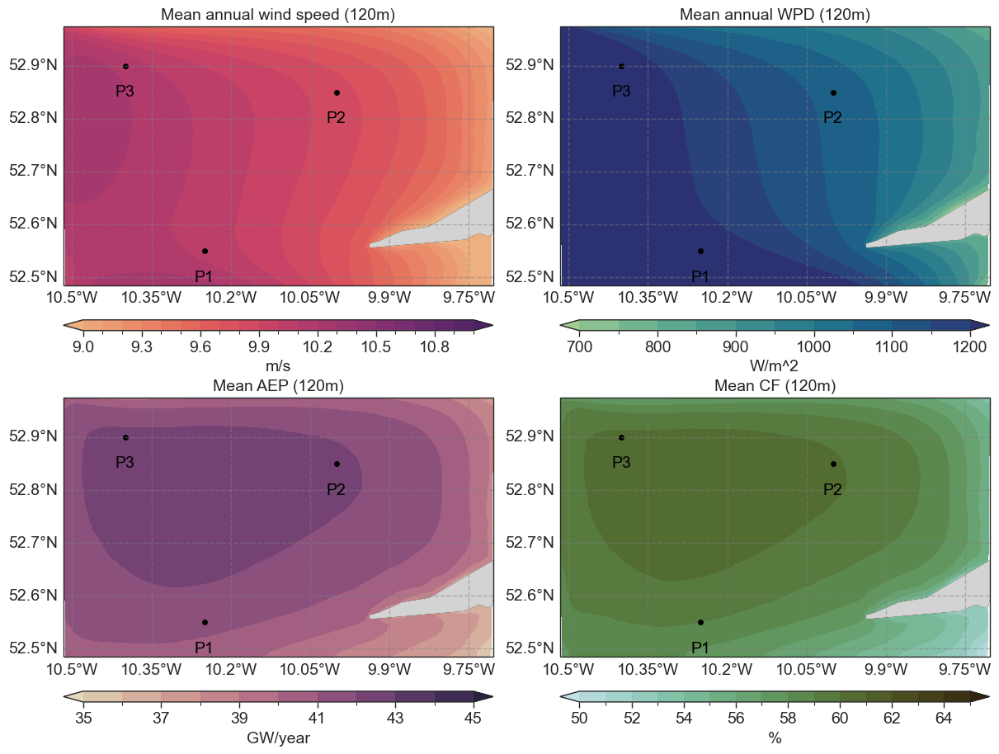

In [43]:
fig = plt.figure(figsize=(12, 9), constrained_layout=True)
gs = fig.add_gridspec(2,2)
map_plotter(gs[0,0],mean_ws[10:-10,10:-10],'XLONG','XLAT',np.arange(9,11.1,0.1),'flare',f'Mean annual wind speed ({level}m)',1,'m/s','horizontal',sample_points = sample_points)
map_plotter(gs[0,1],mean_wpd[10:-10,10:-10],'XLONG','XLAT',np.arange(700,1200.1,50),'crest',f'Mean annual WPD ({level}m)',1,'W/m^2','horizontal',sample_points = sample_points)
map_plotter(gs[1,0],mean_AEP[10:-10,10:-10]/1e6,'XLONG','XLAT',np.arange(35,45.1,1),"ch:s=-.2,r=.6",f'Mean AEP ({level}m)',1,'GW/year','horizontal',sample_points = sample_points)
map_plotter(gs[1,1],mean_CF[10:-10,10:-10]*1e2,'XLONG','XLAT',np.arange(50,65.1,1),"ch:s=10,r=.6",f'Mean CF ({level}m)',1,'%','horizontal',sample_points = sample_points)
plt.savefig(f'{case}_optimization_runs_mean_wind_resources_{level}m.png',dpi=300,bbox_inches='tight',pad_inches=0)

### Resource variabilities

Time elapsed for nearest point identification is 0.002893209457397461s
{'south_north': 24, 'west_east': 45}
Time elapsed for nearest point identification is 0.0016546249389648438s
{'south_north': 89, 'west_east': 77}
Time elapsed for nearest point identification is 0.0025815963745117188s
{'south_north': 100, 'west_east': 25}
Time elapsed for nearest point identification is 0.0020847320556640625s
{'south_north': 24, 'west_east': 45}
Time elapsed for nearest point identification is 0.0016238689422607422s
{'south_north': 89, 'west_east': 77}
Time elapsed for nearest point identification is 0.0022699832916259766s
{'south_north': 100, 'west_east': 25}
Time elapsed for nearest point identification is 0.0018084049224853516s
{'south_north': 24, 'west_east': 45}
Time elapsed for nearest point identification is 0.006145000457763672s
{'south_north': 89, 'west_east': 77}
Time elapsed for nearest point identification is 0.001800537109375s
{'south_north': 100, 'west_east': 25}


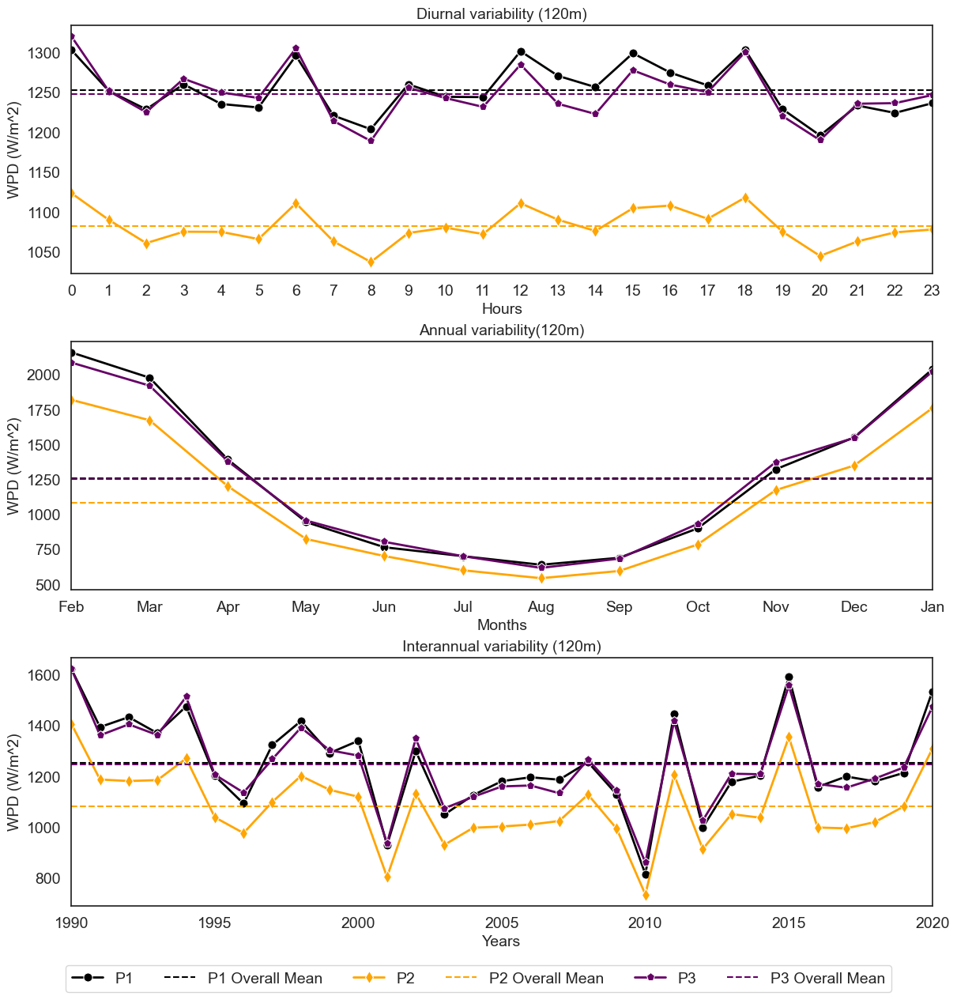

In [44]:
fig = plt.figure(figsize=(12, 12), constrained_layout=True)
gs = fig.add_gridspec(3,1)
sns.set_theme(style="white")

hourly_df = pd.DataFrame()
for i,key in enumerate(sample_points.keys()):
    ds = read_pointwise_timeseries(wpd,sample_points[key][0],sample_points[key][1])

    pointwise_df = pd.DataFrame()

    # Loop through hours
    for hour in range(0,24):
        # Extract data for the current year
        data = ds.sel(Time=ds.Time.dt.hour == hour).mean().values
        # Create a new DataFrame with the year as a column
        #df = pd.DataFrame({'Hour': [hour], key: data})
        df = pd.DataFrame({key: data}, index=pd.Index([hour], name='Hour'))
        # Append the data to the main DataFrame
        pointwise_df = pd.concat([pointwise_df, df])
    hourly_df = pd.concat([hourly_df, pointwise_df],axis=1)

variability_plotter(gs[0,0],hourly_df,f'Diurnal variability ({level}m)','Hours','WPD (W/m^2)', key,colors[i],'o',xlabel_ticks=hours)


monthly_df = pd.DataFrame()
for i,key in enumerate(sample_points.keys()):
    ds = read_pointwise_timeseries(wpd,sample_points[key][0],sample_points[key][1])

    pointwise_df = pd.DataFrame()

    # Loop through hours
    for month in [12, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]:
        # Extract data for the current year
        data = ds.sel(Time=ds.Time.dt.month == month).mean().values
        # Create a new DataFrame with the year as a column
        #df = pd.DataFrame({'Hour': [hour], key: data})
        df = pd.DataFrame({key: data}, index=pd.Index([month], name='month'))
        # Append the data to the main DataFrame
        pointwise_df = pd.concat([pointwise_df, df])
    monthly_df = pd.concat([monthly_df, pointwise_df],axis=1)

variability_plotter(gs[1,0],monthly_df,f'Annual variability({level}m)','Months','WPD (W/m^2)', key,colors[i],'o',xlabel_ticks=months)

yearly_df = pd.DataFrame()
for i,key in enumerate(sample_points.keys()):
    ds = read_pointwise_timeseries(wpd,sample_points[key][0],sample_points[key][1])

    pointwise_df = pd.DataFrame()

    # Loop through hours
    for year in list(range(1990, 2021)):
        # Extract data for the current year
        data = ds.sel(Time=ds.Time.dt.year == year).mean().values
        # Create a new DataFrame with the year as a column
        #df = pd.DataFrame({'Hour': [hour], key: data})
        df = pd.DataFrame({key: data}, index=pd.Index([year], name='year'))
        # Append the data to the main DataFrame
        pointwise_df = pd.concat([pointwise_df, df])
    yearly_df = pd.concat([yearly_df, pointwise_df],axis=1)

axs = variability_plotter(gs[2,0],yearly_df,f'Interannual variability ({level}m)','Years','WPD (W/m^2)', key,colors[i],'o')

# Extract legend from one of the subplots
handles, labels = axs.get_legend_handles_labels()
# Create a common legend below the figures
fig.legend(handles, labels, loc='lower center', ncol=len(labels), bbox_to_anchor=(0.5, -0.05),fontsize=14)

plt.savefig(f'{case}_optimization_runs_wind_resources_variabilities_{level}m.png',dpi=300,bbox_inches='tight',pad_inches=0)

## 150 m

In [30]:
%%time
case = 'Ireland_coast'
run='New_runs'
run_dir=f'{root_dir}/{run}/{case}/Postprocessed/variablewise_files'
chunks={"Time": -1,"south_north": 24,"west_east": 24}

level = 150
turbine_type = '15MW'
ws = xr.open_dataset(f'{run_dir}/ws_{level}.nc',chunks=chunks)['ws']
wpd = WPD(ws).compute()
tp = xr.open_dataset(f'{run_dir}/{turbine_type}/tp_{level}.nc',chunks=chunks)['power']

CPU times: user 54 s, sys: 3min 45s, total: 4min 39s
Wall time: 4min 51s


### Mean wind resources

In [ ]:
%%time
mean_ws = ws.mean(dim='Time').compute()
mean_wpd = wpd.mean(dim='Time').compute()
mean_AEP = tp.isel(Time=slice(None,-1)).resample(Time='Y').sum().mean(dim='Time').compute()
mean_CF = mean_AEP/(8766*15000)

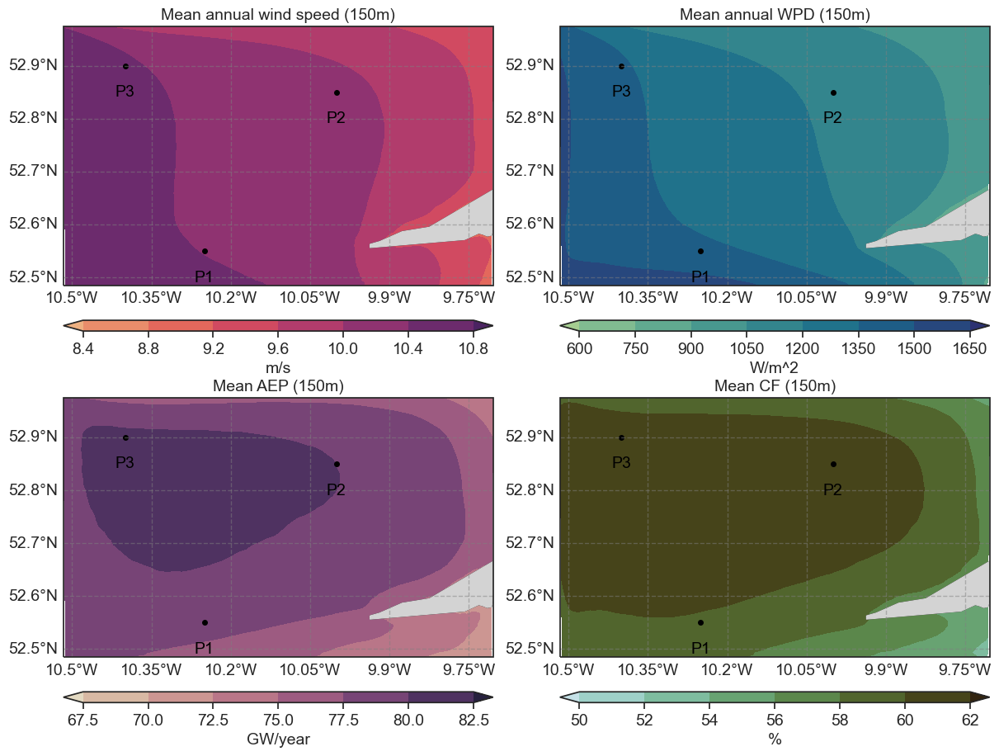

In [34]:
fig = plt.figure(figsize=(12, 9), constrained_layout=True)
gs = fig.add_gridspec(2,2)
map_plotter(gs[0,0],mean_ws[10:-10,10:-10],'XLONG','XLAT',None,'flare',f'Mean annual wind speed ({level}m)',1,'m/s','horizontal',sample_points = sample_points)
map_plotter(gs[0,1],mean_wpd[10:-10,10:-10],'XLONG','XLAT',None,'crest',f'Mean annual WPD ({level}m)',1,'W/m^2','horizontal',sample_points = sample_points)
map_plotter(gs[1,0],mean_AEP[10:-10,10:-10]/1e6,'XLONG','XLAT',None,"ch:s=-.2,r=.6",f'Mean AEP ({level}m)',1,'GW/year','horizontal',sample_points = sample_points)
map_plotter(gs[1,1],mean_CF[10:-10,10:-10]*1e2,'XLONG','XLAT',None,"ch:s=10,r=.6",f'Mean CF ({level}m)',1,'%','horizontal',sample_points = sample_points)
plt.savefig(f'{case}_optimization_runs_mean_wind_resources_{level}m.png',dpi=300,bbox_inches='tight',pad_inches=0)

### Resource variabilities

Time elapsed for nearest point identification is 0.0039577484130859375s
{'south_north': 24, 'west_east': 45}
Time elapsed for nearest point identification is 0.0017940998077392578s
{'south_north': 89, 'west_east': 77}
Time elapsed for nearest point identification is 0.0017635822296142578s
{'south_north': 100, 'west_east': 25}
Time elapsed for nearest point identification is 0.0021042823791503906s
{'south_north': 24, 'west_east': 45}
Time elapsed for nearest point identification is 0.001527547836303711s
{'south_north': 89, 'west_east': 77}
Time elapsed for nearest point identification is 0.001959562301635742s
{'south_north': 100, 'west_east': 25}
Time elapsed for nearest point identification is 0.001850128173828125s
{'south_north': 24, 'west_east': 45}
Time elapsed for nearest point identification is 0.0015976428985595703s
{'south_north': 89, 'west_east': 77}
Time elapsed for nearest point identification is 0.0021924972534179688s
{'south_north': 100, 'west_east': 25}


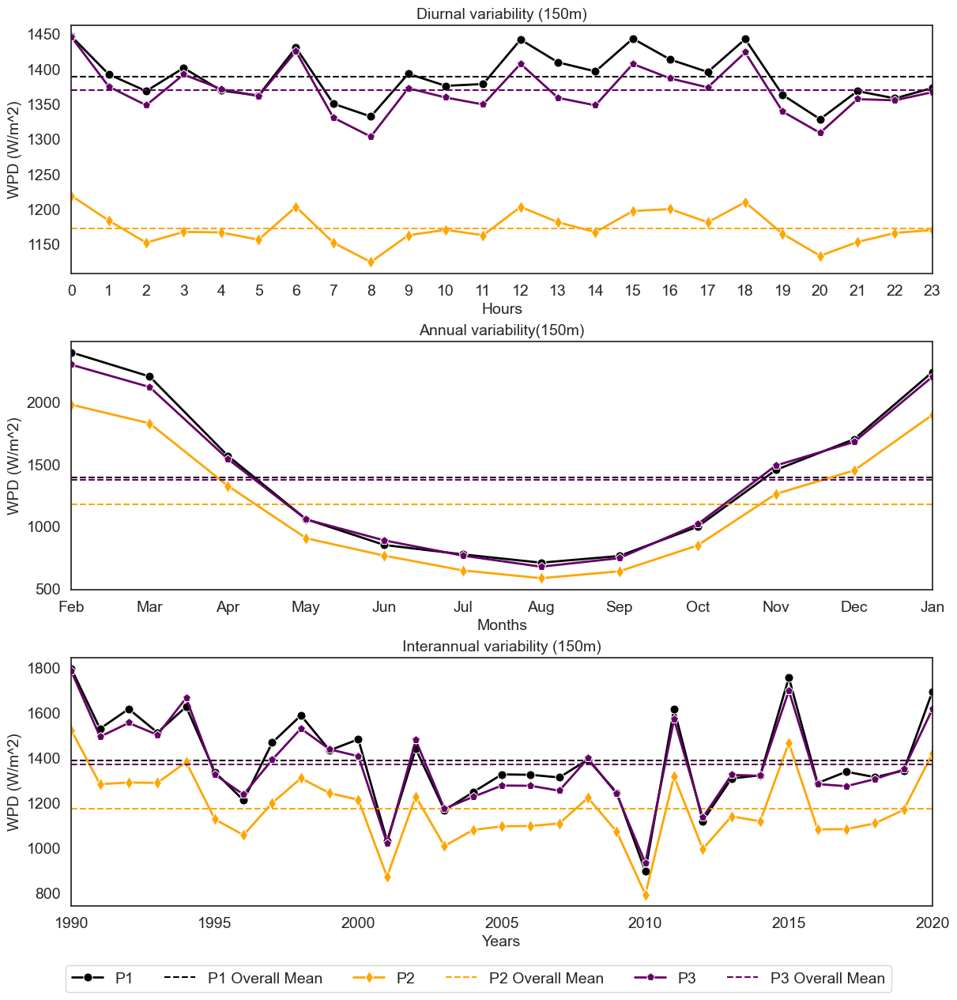

In [35]:
fig = plt.figure(figsize=(12, 12), constrained_layout=True)
gs = fig.add_gridspec(3,1)
sns.set_theme(style="white")

hourly_df = pd.DataFrame()
for i,key in enumerate(sample_points.keys()):
    ds = read_pointwise_timeseries(wpd,sample_points[key][0],sample_points[key][1])

    pointwise_df = pd.DataFrame()

    # Loop through hours
    for hour in range(0,24):
        # Extract data for the current year
        data = ds.sel(Time=ds.Time.dt.hour == hour).mean().values
        # Create a new DataFrame with the year as a column
        #df = pd.DataFrame({'Hour': [hour], key: data})
        df = pd.DataFrame({key: data}, index=pd.Index([hour], name='Hour'))
        # Append the data to the main DataFrame
        pointwise_df = pd.concat([pointwise_df, df])
    hourly_df = pd.concat([hourly_df, pointwise_df],axis=1)

variability_plotter(gs[0,0],hourly_df,f'Diurnal variability ({level}m)','Hours','WPD (W/m^2)', key,colors[i],'o',xlabel_ticks=hours)


monthly_df = pd.DataFrame()
for i,key in enumerate(sample_points.keys()):
    ds = read_pointwise_timeseries(wpd,sample_points[key][0],sample_points[key][1])

    pointwise_df = pd.DataFrame()

    # Loop through hours
    for month in [12, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]:
        # Extract data for the current year
        data = ds.sel(Time=ds.Time.dt.month == month).mean().values
        # Create a new DataFrame with the year as a column
        #df = pd.DataFrame({'Hour': [hour], key: data})
        df = pd.DataFrame({key: data}, index=pd.Index([month], name='month'))
        # Append the data to the main DataFrame
        pointwise_df = pd.concat([pointwise_df, df])
    monthly_df = pd.concat([monthly_df, pointwise_df],axis=1)

variability_plotter(gs[1,0],monthly_df,f'Annual variability({level}m)','Months','WPD (W/m^2)', key,colors[i],'o',xlabel_ticks=months)

yearly_df = pd.DataFrame()
for i,key in enumerate(sample_points.keys()):
    ds = read_pointwise_timeseries(wpd,sample_points[key][0],sample_points[key][1])

    pointwise_df = pd.DataFrame()

    # Loop through hours
    for year in list(range(1990, 2021)):
        # Extract data for the current year
        data = ds.sel(Time=ds.Time.dt.year == year).mean().values
        # Create a new DataFrame with the year as a column
        #df = pd.DataFrame({'Hour': [hour], key: data})
        df = pd.DataFrame({key: data}, index=pd.Index([year], name='year'))
        # Append the data to the main DataFrame
        pointwise_df = pd.concat([pointwise_df, df])
    yearly_df = pd.concat([yearly_df, pointwise_df],axis=1)

axs = variability_plotter(gs[2,0],yearly_df,f'Interannual variability ({level}m)','Years','WPD (W/m^2)', key,colors[i],'o')

# Extract legend from one of the subplots
handles, labels = axs.get_legend_handles_labels()
# Create a common legend below the figures
fig.legend(handles, labels, loc='lower center', ncol=len(labels), bbox_to_anchor=(0.5, -0.05),fontsize=14)

plt.savefig(f'{case}_optimization_runs_wind_resources_variabilities_{level}m.png',dpi=300,bbox_inches='tight',pad_inches=0)

### Solar resources

In [23]:
Epv = 0.216
cell_watt = 365

In [25]:
%%time
run = 'New_runs'
# read XLAND and get the lat lon data from this
XLAND = xr.open_dataset(f'{root_dir}/{run}/{case}/Postprocessed/XLAND.nc')
XLAT = XLAND.XLAT
XLONG = XLAND.XLONG

t2m = xr.open_dataset(f'{root_dir}/{run}/{case}/Postprocessed/variablewise_files/T2.nc',chunks=chunks)
t2m = t2m['T2'].assign_coords(XLAT=XLAT,XLONG=XLONG)-273.16
swdown = xr.open_dataset(f'{root_dir}/{run}/{case}/Postprocessed/variablewise_files/SWDOWN2.nc',chunks=chunks)
swdown = swdown['SWDOWN2'].assign_coords(XLAT=XLAT,XLONG=XLONG).compute()
spv = xr.open_dataset(f'{root_dir}/{run}/{case}/Postprocessed/variablewise_files/spv.nc',chunks=chunks)['PVO']

CPU times: user 47.4 s, sys: 48.3 s, total: 1min 35s
Wall time: 1min 26s


In [ ]:
%%time
mean_t2m = t2m.mean(dim='Time').compute()
mean_swdown = swdown.mean(dim='Time').compute()
mean_spv = spv.isel(Time=slice(None,-1)).resample(Time='Y').sum().mean(dim='Time').compute()
mean_CF = mean_spv/(8766*cell_watt)

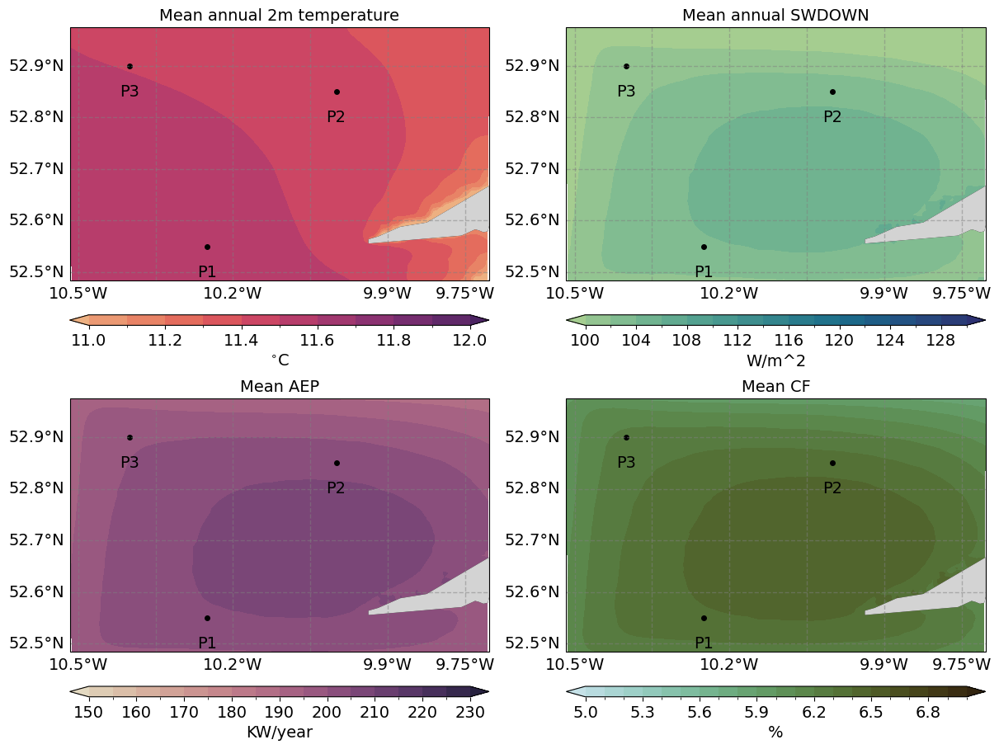

In [28]:
fig = plt.figure(figsize=(12, 9), constrained_layout=True)
gs = fig.add_gridspec(2,2)
map_plotter(gs[0,0],mean_t2m[10:-10,10:-10],'XLONG','XLAT',np.arange(11,12.1,0.1),'flare',f'Mean annual 2m temperature',1,r'$^{\circ}$C','horizontal',sample_points = sample_points)
map_plotter(gs[0,1],mean_swdown[10:-10,10:-10],'XLONG','XLAT',np.arange(100,130.1,2),'crest',f'Mean annual SWDOWN',1,'W/m^2','horizontal',sample_points = sample_points)
map_plotter(gs[1,0],mean_spv[10:-10,10:-10]/1e3,'XLONG','XLAT',np.arange(150,230.1,5),"ch:s=-.2,r=.6",f'Mean AEP',1,'KW/year','horizontal',sample_points = sample_points)
map_plotter(gs[1,1],mean_CF[10:-10,10:-10]*1e2,'XLONG','XLAT',np.arange(5,7.1,0.1),"ch:s=10,r=.6",f'Mean CF',1,'%','horizontal',sample_points = sample_points)
plt.savefig(f'{case}_optimization_runs_mean_solar_resources.png',dpi=300,bbox_inches='tight',pad_inches=0)

### Resource variabilities

Time elapsed for nearest point identification is 0.0072879791259765625s
{'south_north': 24, 'west_east': 45}
Time elapsed for nearest point identification is 0.0014421939849853516s
{'south_north': 89, 'west_east': 77}
Time elapsed for nearest point identification is 0.0016493797302246094s
{'south_north': 100, 'west_east': 25}
Time elapsed for nearest point identification is 0.0016927719116210938s
{'south_north': 24, 'west_east': 45}
Time elapsed for nearest point identification is 0.0012671947479248047s
{'south_north': 89, 'west_east': 77}
Time elapsed for nearest point identification is 0.0019719600677490234s
{'south_north': 100, 'west_east': 25}
Time elapsed for nearest point identification is 0.0015735626220703125s
{'south_north': 24, 'west_east': 45}
Time elapsed for nearest point identification is 0.001954793930053711s
{'south_north': 89, 'west_east': 77}
Time elapsed for nearest point identification is 0.002037525177001953s
{'south_north': 100, 'west_east': 25}


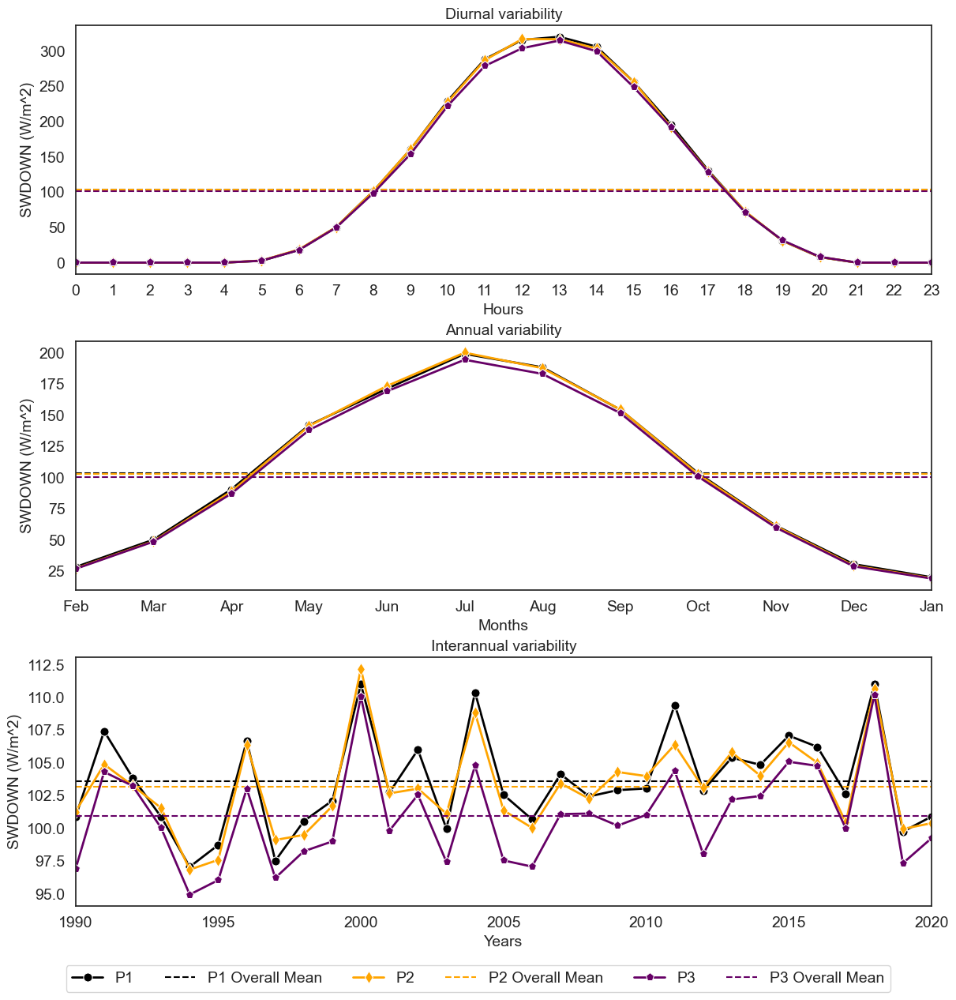

In [29]:
fig = plt.figure(figsize=(12, 12), constrained_layout=True)
gs = fig.add_gridspec(3,1)
sns.set_theme(style="white")

hourly_df = pd.DataFrame()
for i,key in enumerate(sample_points.keys()):
    ds = read_pointwise_timeseries(swdown,sample_points[key][0],sample_points[key][1])

    pointwise_df = pd.DataFrame()

    # Loop through hours
    for hour in range(0,24):
        # Extract data for the current year
        data = ds.sel(Time=ds.Time.dt.hour == hour).mean().values
        # Create a new DataFrame with the year as a column
        #df = pd.DataFrame({'Hour': [hour], key: data})
        df = pd.DataFrame({key: data}, index=pd.Index([hour], name='Hour'))
        # Append the data to the main DataFrame
        pointwise_df = pd.concat([pointwise_df, df])
    hourly_df = pd.concat([hourly_df, pointwise_df],axis=1)

variability_plotter(gs[0,0],hourly_df,f'Diurnal variability','Hours','SWDOWN (W/m^2)', key,colors[i],'o',xlabel_ticks=hours)


monthly_df = pd.DataFrame()
for i,key in enumerate(sample_points.keys()):
    ds = read_pointwise_timeseries(swdown,sample_points[key][0],sample_points[key][1])

    pointwise_df = pd.DataFrame()

    # Loop through hours
    for month in [12, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]:
        # Extract data for the current year
        data = ds.sel(Time=ds.Time.dt.month == month).mean().values
        # Create a new DataFrame with the year as a column
        #df = pd.DataFrame({'Hour': [hour], key: data})
        df = pd.DataFrame({key: data}, index=pd.Index([month], name='month'))
        # Append the data to the main DataFrame
        pointwise_df = pd.concat([pointwise_df, df])
    monthly_df = pd.concat([monthly_df, pointwise_df],axis=1)

variability_plotter(gs[1,0],monthly_df,f'Annual variability','Months','SWDOWN (W/m^2)', key,colors[i],'o',xlabel_ticks=months)

yearly_df = pd.DataFrame()
for i,key in enumerate(sample_points.keys()):
    ds = read_pointwise_timeseries(swdown,sample_points[key][0],sample_points[key][1])

    pointwise_df = pd.DataFrame()

    # Loop through hours
    for year in list(range(1990, 2021)):
        # Extract data for the current year
        data = ds.sel(Time=ds.Time.dt.year == year).mean().values
        # Create a new DataFrame with the year as a column
        #df = pd.DataFrame({'Hour': [hour], key: data})
        df = pd.DataFrame({key: data}, index=pd.Index([year], name='year'))
        # Append the data to the main DataFrame
        pointwise_df = pd.concat([pointwise_df, df])
    yearly_df = pd.concat([yearly_df, pointwise_df],axis=1)

axs = variability_plotter(gs[2,0],yearly_df,f'Interannual variability','Years','SWDOWN (W/m^2)', key,colors[i],'o')

# Extract legend from one of the subplots
handles, labels = axs.get_legend_handles_labels()
# Create a common legend below the figures
fig.legend(handles, labels, loc='lower center', ncol=len(labels), bbox_to_anchor=(0.5, -0.05),fontsize=14)

plt.savefig(f'{case}_optimization_runs_solar_resources_variabilities.png',dpi=300,bbox_inches='tight',pad_inches=0)